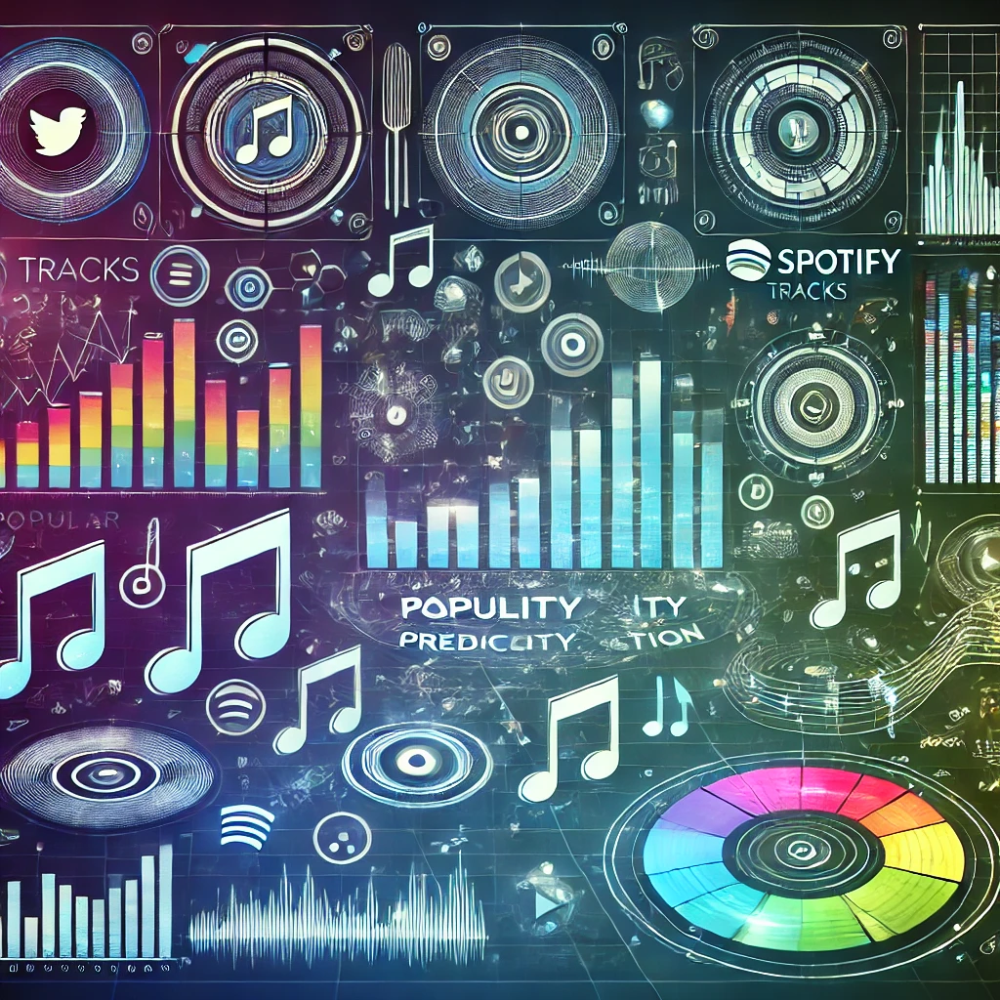

# Problem Statement

The goal of this project is to predict the popularity of Spotify tracks based on their audio features and metadata. Popularity is a crucial metric for artists, record labels, and streaming services to gauge the potential success of a track. By predicting the popularity of tracks before or shortly after release, we can assist in decision-making processes, such as marketing efforts, playlist curation, and talent acquisition.

The main question we aim to address is: "***Can we predict the popularity of a Spotify track using its metadata and audio characteristics?***"

# Business Objectives

1. **Increase Track Success Prediction Accuracy**:
   - **Goal**: Accurately predict the future popularity of tracks to maximize promotional effectiveness.
   - **Outcome**: Record labels and streaming platforms can focus resources on tracks that are predicted to perform well, improving the likelihood of commercial success and reducing investment risk.

2. **Optimize Marketing Spend**:
   - **Goal**: Help record labels and artists allocate marketing budgets more efficiently by predicting which tracks will gain traction and require additional promotion.
   - **Outcome**: Significant cost savings in promotional campaigns, as funds can be targeted towards tracks with higher predicted popularity, maximizing return on investment (ROI).

3. **Enhance Playlist Curation and User Experience**:
   - **Goal**: Support streaming platforms like Spotify in curating popular and engaging playlists by integrating popularity predictions into their recommendation engines.
   - **Outcome**: Improved user satisfaction and retention as users are more likely to engage with playlists that feature tracks predicted to be popular, increasing both streaming time and subscription renewals.

4. **Talent Identification and A&R Decision Support**:
   - **Goal**: Assist Artist & Repertoire (A&R) teams at record labels in identifying new talent by predicting which tracks or artists are likely to become popular.
   - **Outcome**: More effective talent scouting and contract negotiations, leading to early investment in artists with high potential, securing the label's market position.

5. **Increase Revenue Through Targeted Campaigns**:
   - **Goal**: Allow artists, labels, and platforms to launch more targeted promotional campaigns based on track popularity predictions.
   - **Outcome**: Increased streaming numbers and sales of high-potential tracks, boosting overall revenue from streaming, downloads, merchandise, and concert sales.

6. **Improve Artist Strategy and Track Development**:
   - **Goal**: Help artists and their teams make data-driven decisions about track development by understanding which audio features (e.g., danceability, energy, tempo) contribute most to a song's popularity.
   - **Outcome**: Artists can create music that is more likely to resonate with listeners, increasing their chances of producing a hit track, which can further their career and boost their earnings.

7. **Maximize Platform Engagement and Ad Revenue**:
   - **Goal**: Help streaming platforms optimize content delivery by integrating popularity predictions to keep users engaged with popular content.
   - **Outcome**: Longer streaming sessions and increased engagement, resulting in higher ad impressions and increased ad revenue for the platform.

By aligning the predictive model's capabilities with these business objectives, this project aims to deliver substantial value across the music industry. Record labels, streaming platforms, and artists can make better-informed decisions that drive both creative and commercial success. The ability to predict track popularity will empower stakeholders to optimize their operations, enhance user experiences, and ultimately increase profitability.

# Business Impacts

Predicting the popularity of Spotify tracks has multiple impacts across different stakeholders in the music industry:

1. **For Record Labels**:
   - **Talent Scouting and Investment**: Record labels can use the model to identify promising new artists or tracks and allocate marketing budgets more efficiently.
   - **Release Strategy**: The model can help determine the best time to release a track based on its predicted popularity, optimizing for exposure and success.

2. **For Artists**:
   - **Track Optimization**: Artists can better understand which aspects of their music (e.g., danceability, energy, acousticness) are more likely to result in a hit song, allowing them to make informed creative decisions.
   - **Branding and Marketing**: Artists can target their promotional efforts based on predicted popularity, focusing on social media and playlist placements for tracks with higher potential.

3. **For Streaming Platforms**:
   - **Playlist Curation**: Streaming platforms like Spotify can enhance their automated playlist curation processes by integrating popularity predictions to prioritize high-potential tracks.
   - **User Retention and Engagement**: By surfacing more popular tracks, platforms can keep users engaged, potentially leading to higher subscription rates and ad revenue.

# Procedure

1. **Data Preprocessing**:
 - Clean the dataset by handling missing values and removing duplicates.
 - Perform feature scaling and encode categorical features appropriately.
 - Conduct exploratory data analysis (EDA) to understand the relationships between features and the target variable.

2. **Feature Engineering**:
 - Select the most relevant features (audio characteristics and metadata) that influence a track’s popularity.
 - Possibly create new features or bins for the target variable to assist in a classification-based approach.

3. **Model Development**:
 - Train a variety of machine learning models (e.g., Linear Regression, Random Forest, Neural Networks) to predict a track’s popularity.

 - Experiment with both regression and classification approaches depending on how the popularity variable is handled.

 - Evaluate the models using appropriate metrics like Mean Absolute Error (MAE) for regression, or accuracy and F1-score for classification.

4. **Model Tuning**:
 - Optimize the models through hyperparameter tuning and cross-validation to improve performance.
  - Explore different model architectures, especially for neural networks, to ensure they generalize well to new data.

5. **Business Insights and Model Deployment**:
 - Provide business recommendations based on the model’s output (e.g., which track features correlate most with high popularity).
 - Ensure the model is scalable and can be integrated into a streaming platform or a marketing decision-making tool.

# Importing Necessary Libraries

In [ ]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import scipy
from scipy.stats import yeojohnson, stats, jarque_bera, normaltest, shapiro

import sklearn
from sklearn import linear_model
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn import metrics
from sklearn import preprocessing
from sklearn.metrics import mean_absolute_error, silhouette_score, accuracy_score, f1_score, cohen_kappa_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN, KMeans

import statsmodels.api as sm
from statsmodels.tools.eval_measures import mse, rmse
from statsmodels.tsa.stattools import acf

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout

from yellowbrick.cluster import KElbowVisualizer

import warnings
warnings.filterwarnings('ignore')

2024-08-24 04:12:45.413518: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-24 04:12:45.413647: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-24 04:12:45.518520: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# Importing the Dataset

In [ ]:
!git clone https://github.com/sdey96/Spotify-Popularity-Classification.git

Cloning into 'Spotify-Popularity-Classification'...

remote: Enumerating objects: 23, done.

remote: Counting objects: 100% (23/23), done.

remote: Compressing objects: 100% (22/22), done.

remote: Total 23 (delta 6), reused 0 (delta 0), pack-reused 0 (from 0)

Receiving objects: 100% (23/23), 17.43 MiB | 11.44 MiB/s, done.

Resolving deltas: 100% (6/6), done.


In [ ]:
file_path = "/kaggle/input/spotify-tracks-dataset/Spotify.csv"

df = pd.read_csv(file_path)

df.head()

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,...,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,...,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,...,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,...,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,...,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


## Defining the Variables/ Features

The dataset contains information about Spotify tracks with various features. Here is a detailed explanation of the features:

1. **Unnamed: 0**: An index column (*needs to be dropped*).
2. **track_id**: A unique identifier for each track on Spotify.
3. **artists**: The name(s) of the artist(s) associated with the track.
4. **album_name**: The name of the album on which the track appears.
5. **track_name**: The title of the track.
6. **popularity** [TARGET]: A numerical value indicating the popularity of the track, typically on a scale from 0 to 100.
7. **duration_ms**: The duration of the track in milliseconds.
8. **explicit**: A boolean indicating whether the track has explicit content (`True` for explicit, `False` for clean).
9. **danceability**: A measure of how suitable a track is for dancing, with higher values indicating more danceable tracks.
10. **energy**: A measure of the intensity and activity of the track, with higher values indicating more energetic tracks.
11. **key**: The key in which the track is composed, represented as an integer.
12. **loudness**: The overall loudness of the track in decibels (dB), averaged across the entire track.
13. **mode**: Indicates the modality (major or minor) of the track. Major is represented by 1 and minor by 0.
14. **speechiness**: A measure of the presence of spoken words in the track. Higher values indicate more speech-like qualities.
15. **acousticness**: A measure of the acoustic nature of the track, with higher values indicating more acoustic sounds.
16. **instrumentalness**: Predicts whether a track contains no vocals. Higher values indicate greater likelihood of the track being instrumental.
17. **liveness**: A measure of the presence of a live audience in the recording. Higher values indicate a higher probability of the track being a live recording.
18. **valence**: A measure of the musical positiveness conveyed by the track, with higher values indicating more positive (happy) tracks.
19. **tempo**: The overall estimated tempo of a track in beats per minute (BPM).
20. **time_signature**: An estimated time signature, indicating the number of beats in each bar.
21. **track_genre**: The genre of the track.

## Basic Checks

In [ ]:
df.shape

(114000, 21)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114000 entries, 0 to 113999
Data columns (total 21 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        114000 non-null  int64  
 1   track_id          114000 non-null  object 
 2   artists           113999 non-null  object 
 3   album_name        113999 non-null  object 
 4   track_name        113999 non-null  object 
 5   popularity        114000 non-null  int64  
 6   duration_ms       114000 non-null  int64  
 7   explicit          114000 non-null  bool   
 8   danceability      114000 non-null  float64
 9   energy            114000 non-null  float64
 10  key               114000 non-null  int64  
 11  loudness          114000 non-null  float64
 12  mode              114000 non-null  int64  
 13  speechiness       114000 non-null  float64
 14  acousticness      114000 non-null  float64
 15  instrumentalness  114000 non-null  float64
 16  liveness          11

In [ ]:
df.describe()

,Unnamed: 0,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,114000.000000,114000.000000,1.140000e+05,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000
mean,56999.500000,33.238535,2.280292e+05,0.566800,0.641383,5.309140,-8.258960,0.637553,0.084652,0.314910,0.156050,0.213553,0.474068,122.147837,3.904035
std,32909.109681,22.305078,1.072977e+05,0.173542,0.251529,3.559987,5.029337,0.480709,0.105732,0.332523,0.309555,0.190378,0.259261,29.978197,0.432621
min,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,-49.531000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,28499.750000,17.000000,1.740660e+05,0.456000,0.472000,2.000000,-10.013000,0.000000,0.035900,0.016900,0.000000,0.098000,0.260000,99.218750,4.000000
50%,56999.500000,35.000000,2.129060e+05,0.580000,0.685000,5.000000,-7.004000,1.000000,0.048900,0.169000,0.000042,0.132000,0.464000,122.017000,4.000000
75%,85499.250000,50.000000,2.615060e+05,0.695000,0.854000,8.000000,-5.003000,1.000000,0.084500,0.598000,0.049000,0.273000,0.683000,140.071000,4.000000
max,113999.000000,100.000000,5.237295e+06,0.985000,1.000000,11.000000,4.532000,1.000000,0.965000,0.996000,1.000000,1.000000,0.995000,243.372000,5.000000


In [ ]:
df.isnull().sum().sort_values(ascending=False)

artists             1
track_name          1
album_name          1
Unnamed: 0          0
track_id            0
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64

In [ ]:
duplicates = df[df.duplicated()]

print("Duplicate Rows except first occurrence based on all columns:")
print(duplicates)

Duplicate Rows except first occurrence based on all columns:
Empty DataFrame
Columns: [Unnamed: 0, track_id, artists, album_name, track_name, popularity, duration_ms, explicit, danceability, energy, key, loudness, mode, speechiness, acousticness, instrumentalness, liveness, valence, tempo, time_signature, track_genre]
Index: []

[0 rows x 21 columns]


In [ ]:
df = df.drop(['Unnamed: 0', 'track_id'], axis=1)

In [ ]:
df.head()

,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


In [ ]:
df.tail()

,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
113995,Rainy Lullaby,#mindfulness - Soft Rain for Mindful Meditatio...,Sleep My Little Boy,21,384999,False,0.172,0.235,5,-16.393,1,0.0422,0.640,0.928,0.0863,0.0339,125.995,5,world-music
113996,Rainy Lullaby,#mindfulness - Soft Rain for Mindful Meditatio...,Water Into Light,22,385000,False,0.174,0.117,0,-18.318,0,0.0401,0.994,0.976,0.1050,0.0350,85.239,4,world-music
113997,Cesária Evora,Best Of,Miss Perfumado,22,271466,False,0.629,0.329,0,-10.895,0,0.0420,0.867,0.000,0.0839,0.7430,132.378,4,world-music
113998,Michael W. Smith,Change Your World,Friends,41,283893,False,0.587,0.506,7,-10.889,1,0.0297,0.381,0.000,0.2700,0.4130,135.960,4,world-music
113999,Cesária Evora,Miss Perfumado,Barbincor,22,241826,False,0.526,0.487,1,-10.204,0,0.0725,0.681,0.000,0.0893,0.7080,79.198,4,world-music


In [ ]:
df.shape

(114000, 19)

## Removing Non-Music Tracks

In [ ]:
df_1 = df[df['speechiness'] < 0.8]

In [ ]:
df_1.shape

(113198, 19)

In [ ]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 113198 entries, 0 to 113999
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   artists           113197 non-null  object 
 1   album_name        113197 non-null  object 
 2   track_name        113197 non-null  object 
 3   popularity        113198 non-null  int64  
 4   duration_ms       113198 non-null  int64  
 5   explicit          113198 non-null  bool   
 6   danceability      113198 non-null  float64
 7   energy            113198 non-null  float64
 8   key               113198 non-null  int64  
 9   loudness          113198 non-null  float64
 10  mode              113198 non-null  int64  
 11  speechiness       113198 non-null  float64
 12  acousticness      113198 non-null  float64
 13  instrumentalness  113198 non-null  float64
 14  liveness          113198 non-null  float64
 15  valence           113198 non-null  float64
 16  tempo             113198 

## Numerical & Categorical Columns

In [ ]:
numeric_cols = []
categorical_cols = []

for col in df_1.columns:
    if df_1[col].dtype == np.float64 or df_1[col].dtype == np.int64:
        numeric_cols.append(col)
    else:
        categorical_cols.append(col)

print('numeric columns:', numeric_cols)
print('Categorical columns:', categorical_cols)

numeric columns: ['popularity', 'duration_ms', 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature']
Categorical columns: ['artists', 'album_name', 'track_name', 'explicit', 'track_genre']


## Discrete Columns

In [ ]:
discrete_numeric=[feature for feature in numeric_cols if df_1[feature].nunique()<20]
discrete_numeric

['key', 'mode', 'time_signature']

# Feature Engineering

## Changes on `mode` Column

In [ ]:
df_1['mode'] = df_1['mode'].replace({0: 'minor', 1: 'major'})

## Changes on `key` Column

In [ ]:
df_1['key'] = df_1['key'].replace({0: 'C',
                                   1: 'C-sharp_D-flat',
                                   2: 'D',
                                   3: 'D-sharp_E-flat',
                                   4: 'E',
                                   5: 'F',
                                   6: 'F-sharp_G-flat',
                                   7: 'G',
                                   8: 'G-sharp_A-flat',
                                   9: 'A',
                                   10: 'A-sharp_B-flat',
                                   11: 'B'})

## Checking the `time_signature` Range

In [ ]:
# Checking time_signature for values outside the stated range of 3 - 7.
num_below_3 = len(df_1[df_1['time_signature'] < 3])
pct_below_3 = (num_below_3 / len(df_1)) * 100
print(f"{pct_below_3:.2f}% of values are less than 3")

# Calculate the percentage of values greater than 7
num_above_7 = len(df_1[df_1['time_signature'] > 7])
pct_above_7 = (num_above_7 / len(df_1)) * 100
print(f"{pct_above_7:.2f}% of values are greater than 7")

0.96% of values are less than 3
0.00% of values are greater than 7


### Dropping `time_signature` values less than three (These values must be in error)

In [ ]:
df_2 = df_1.loc[df_1['time_signature'] >= 3]

In [ ]:
df_2.shape

(112115, 19)

### Changes on `time_signature` Column

In [ ]:
df_2['time_signature'] = df_2['time_signature'].replace({3: '3/4',
                                                         4: '4/4',
                                                         5: '5/4',
                                                         6: '6/4',
                                                         7: '7/4'})

## Dropping Rows with Duration = 0

In [ ]:
df_3 = df_2[df_2['duration_ms']!=0]

In [ ]:
df_3.shape

(112114, 19)

In [ ]:
df_3.isnull().sum().sort_values(ascending=True)

artists             0
album_name          0
track_name          0
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64

In [ ]:
df_3.head()

,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,C-sharp_D-flat,-6.746,minor,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4/4,acoustic
1,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,C-sharp_D-flat,-17.235,major,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4/4,acoustic
2,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,C,-9.734,major,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4/4,acoustic
3,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,C,-18.515,major,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3/4,acoustic
4,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,D,-9.681,major,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4/4,acoustic


## Adding Binary Columns for the Most Frequent Words from `track_name`

In [ ]:
! pip install nltk

In [ ]:
import nltk

nltk.download('punkt')

[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
import re
from nltk.tokenize import word_tokenize
from collections import Counter

### Function to Clean Text

In [ ]:
def clean_text(text):
    cleaned_text = re.sub(r'[^a-zA-Z\s]', '', text)
    return cleaned_text.strip()

### Concatenate All Cleaned `track_names`

In [ ]:
all_track_names_cleaned = ' '.join(df_3['track_name'].dropna().apply(clean_text))

tokens = all_track_names_cleaned.split()

capitalized_tokens = [word for word in tokens if word[0].isupper()]

capitalized_word_freq = Counter(capitalized_tokens)

### Top 5 Most Frequent Words

In [ ]:
top_5_capitalized_words = capitalized_word_freq.most_common(5)
top_5_capitalized_words

[('The', 6315), ('You', 4065), ('Me', 3519), ('I', 3204), ('Vivo', 2955)]

### Creating the Columns

In [ ]:
top_5_words = [word for word, freq in top_5_capitalized_words]

def classify_words_track(text):
    cleaned_text = clean_text(text)
    tokens = cleaned_text.split()

    word_classes = {f'{word}_track': 0 for word in top_5_words}
    word_classes['Others_track'] = 1

    for word in tokens:
        if word in top_5_words:
            word_classes[f'{word}_track'] = 1
            word_classes['Others_track'] = 0

    return word_classes

In [ ]:
classified_data = df_3['track_name'].dropna().apply(classify_words_track)
classified_df = pd.DataFrame(classified_data.tolist())

classified_df = classified_df.fillna(0)

df_4 = df_3.join(classified_df)

In [ ]:
df_4.head()

,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,...,valence,tempo,time_signature,track_genre,The_track,You_track,Me_track,I_track,Vivo_track,Others_track
0,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,C-sharp_D-flat,-6.746,...,0.715,87.917,4/4,acoustic,0.0,0.0,0.0,0.0,0.0,1.0
1,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,C-sharp_D-flat,-17.235,...,0.267,77.489,4/4,acoustic,0.0,0.0,0.0,0.0,0.0,1.0
2,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,C,-9.734,...,0.120,76.332,4/4,acoustic,0.0,0.0,0.0,0.0,0.0,1.0
3,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,C,-18.515,...,0.143,181.740,3/4,acoustic,0.0,0.0,0.0,0.0,0.0,1.0
4,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,D,-9.681,...,0.167,119.949,4/4,acoustic,0.0,0.0,0.0,0.0,0.0,1.0


In [ ]:
null_values_summary = df_4.isnull().sum()
null_values_summary

artists                0
album_name             0
track_name             0
popularity             0
duration_ms            0
explicit               0
danceability           0
energy                 0
key                    0
loudness               0
mode                   0
speechiness            0
acousticness           0
instrumentalness       0
liveness               0
valence                0
tempo                  0
time_signature         0
track_genre            0
The_track           1872
You_track           1872
Me_track            1872
I_track             1872
Vivo_track          1872
Others_track        1872
dtype: int64

In [ ]:
df_4[df_4.isnull().any(axis=1)]

,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,...,valence,tempo,time_signature,track_genre,The_track,You_track,Me_track,I_track,Vivo_track,Others_track
112114,No.1,Canımız Cehenneme; Pt. III,Söyle Ona,46,283062,True,0.522,0.452,F-sharp_G-flat,-12.350,...,0.4700,100.433,4/4,turkish,NaN,NaN,NaN,NaN,NaN,NaN
112115,Şebnem Ferah,Od,Kalbim Mezar,44,279103,False,0.414,0.921,C,-3.623,...,0.4350,194.994,3/4,turkish,NaN,NaN,NaN,NaN,NaN,NaN
112116,Beta Berk Bayındır;Şanışer,Best of Beta,Her Şey Aynı,46,209536,True,0.701,0.424,G,-10.653,...,0.5880,139.985,4/4,turkish,NaN,NaN,NaN,NaN,NaN,NaN
112117,Büyük Ev Ablukada,FIRTINAYT,BENİM KAFAM SİKTİRMİŞ GİTMİŞ,45,117460,True,0.761,0.652,B,-10.534,...,0.8470,125.018,4/4,turkish,NaN,NaN,NaN,NaN,NaN,NaN
112119,Saian;Bedo,Birkaç güzel gün için,Birkaç güzel gün için,45,166191,False,0.729,0.685,A,-9.637,...,0.3200,93.969,4/4,turkish,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113995,Rainy Lullaby,#mindfulness - Soft Rain for Mindful Meditatio...,Sleep My Little Boy,21,384999,False,0.172,0.235,F,-16.393,...,0.0339,125.995,5/4,world-music,NaN,NaN,NaN,NaN,NaN,NaN
113996,Rainy Lullaby,#mindfulness - Soft Rain for Mindful Meditatio...,Water Into Light,22,385000,False,0.174,0.117,C,-18.318,...,0.0350,85.239,4/4,world-music,NaN,NaN,NaN,NaN,NaN,NaN
113997,Cesária Evora,Best Of,Miss Perfumado,22,271466,False,0.629,0.329,C,-10.895,...,0.7430,132.378,4/4,world-music,NaN,NaN,NaN,NaN,NaN,NaN
113998,Michael W. Smith,Change Your World,Friends,41,283893,False,0.587,0.506,G,-10.889,...,0.4130,135.960,4/4,world-music,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df_4['Others_track'] = df_4['Others_track'].fillna(1)

In [ ]:
df_4[df_4.isnull().any(axis=1)]

,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,...,valence,tempo,time_signature,track_genre,The_track,You_track,Me_track,I_track,Vivo_track,Others_track
112114,No.1,Canımız Cehenneme; Pt. III,Söyle Ona,46,283062,True,0.522,0.452,F-sharp_G-flat,-12.350,...,0.4700,100.433,4/4,turkish,NaN,NaN,NaN,NaN,NaN,1.0
112115,Şebnem Ferah,Od,Kalbim Mezar,44,279103,False,0.414,0.921,C,-3.623,...,0.4350,194.994,3/4,turkish,NaN,NaN,NaN,NaN,NaN,1.0
112116,Beta Berk Bayındır;Şanışer,Best of Beta,Her Şey Aynı,46,209536,True,0.701,0.424,G,-10.653,...,0.5880,139.985,4/4,turkish,NaN,NaN,NaN,NaN,NaN,1.0
112117,Büyük Ev Ablukada,FIRTINAYT,BENİM KAFAM SİKTİRMİŞ GİTMİŞ,45,117460,True,0.761,0.652,B,-10.534,...,0.8470,125.018,4/4,turkish,NaN,NaN,NaN,NaN,NaN,1.0
112119,Saian;Bedo,Birkaç güzel gün için,Birkaç güzel gün için,45,166191,False,0.729,0.685,A,-9.637,...,0.3200,93.969,4/4,turkish,NaN,NaN,NaN,NaN,NaN,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113995,Rainy Lullaby,#mindfulness - Soft Rain for Mindful Meditatio...,Sleep My Little Boy,21,384999,False,0.172,0.235,F,-16.393,...,0.0339,125.995,5/4,world-music,NaN,NaN,NaN,NaN,NaN,1.0
113996,Rainy Lullaby,#mindfulness - Soft Rain for Mindful Meditatio...,Water Into Light,22,385000,False,0.174,0.117,C,-18.318,...,0.0350,85.239,4/4,world-music,NaN,NaN,NaN,NaN,NaN,1.0
113997,Cesária Evora,Best Of,Miss Perfumado,22,271466,False,0.629,0.329,C,-10.895,...,0.7430,132.378,4/4,world-music,NaN,NaN,NaN,NaN,NaN,1.0
113998,Michael W. Smith,Change Your World,Friends,41,283893,False,0.587,0.506,G,-10.889,...,0.4130,135.960,4/4,world-music,NaN,NaN,NaN,NaN,NaN,1.0


In [ ]:
df_4 = df_4.fillna(0)

In [ ]:
df_4[df_4.isnull().any(axis=1)]

,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,...,valence,tempo,time_signature,track_genre,The_track,You_track,Me_track,I_track,Vivo_track,Others_track


In [ ]:
df_4.isnull().sum().sort_values(ascending=False)

artists             0
album_name          0
track_name          0
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
The_track           0
You_track           0
Me_track            0
I_track             0
Vivo_track          0
Others_track        0
dtype: int64

### Dropping `track_name` Column

In [ ]:
df_4 = df_4.drop(columns=['track_name'], axis=1)
df_4.head()

,artists,album_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,...,valence,tempo,time_signature,track_genre,The_track,You_track,Me_track,I_track,Vivo_track,Others_track
0,Gen Hoshino,Comedy,73,230666,False,0.676,0.4610,C-sharp_D-flat,-6.746,minor,...,0.715,87.917,4/4,acoustic,0.0,0.0,0.0,0.0,0.0,1.0
1,Ben Woodward,Ghost (Acoustic),55,149610,False,0.420,0.1660,C-sharp_D-flat,-17.235,major,...,0.267,77.489,4/4,acoustic,0.0,0.0,0.0,0.0,0.0,1.0
2,Ingrid Michaelson;ZAYN,To Begin Again,57,210826,False,0.438,0.3590,C,-9.734,major,...,0.120,76.332,4/4,acoustic,0.0,0.0,0.0,0.0,0.0,1.0
3,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,71,201933,False,0.266,0.0596,C,-18.515,major,...,0.143,181.740,3/4,acoustic,0.0,0.0,0.0,0.0,0.0,1.0
4,Chord Overstreet,Hold On,82,198853,False,0.618,0.4430,D,-9.681,major,...,0.167,119.949,4/4,acoustic,0.0,0.0,0.0,0.0,0.0,1.0


### Setting the Columns as `bool`

In [ ]:
track_columns = [col for col in df_4.columns if col.endswith('_track')]
df_4[track_columns] = df_4[track_columns].astype(bool)

df_4.info()

<class 'pandas.core.frame.DataFrame'>
Index: 112114 entries, 0 to 113999
Data columns (total 24 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   artists           112114 non-null  object 
 1   album_name        112114 non-null  object 
 2   popularity        112114 non-null  int64  
 3   duration_ms       112114 non-null  int64  
 4   explicit          112114 non-null  bool   
 5   danceability      112114 non-null  float64
 6   energy            112114 non-null  float64
 7   key               112114 non-null  object 
 8   loudness          112114 non-null  float64
 9   mode              112114 non-null  object 
 10  speechiness       112114 non-null  float64
 11  acousticness      112114 non-null  float64
 12  instrumentalness  112114 non-null  float64
 13  liveness          112114 non-null  float64
 14  valence           112114 non-null  float64
 15  tempo             112114 non-null  float64
 16  time_signature    112114 

In [ ]:
df_4.head()

,artists,album_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,...,valence,tempo,time_signature,track_genre,The_track,You_track,Me_track,I_track,Vivo_track,Others_track
0,Gen Hoshino,Comedy,73,230666,False,0.676,0.4610,C-sharp_D-flat,-6.746,minor,...,0.715,87.917,4/4,acoustic,False,False,False,False,False,True
1,Ben Woodward,Ghost (Acoustic),55,149610,False,0.420,0.1660,C-sharp_D-flat,-17.235,major,...,0.267,77.489,4/4,acoustic,False,False,False,False,False,True
2,Ingrid Michaelson;ZAYN,To Begin Again,57,210826,False,0.438,0.3590,C,-9.734,major,...,0.120,76.332,4/4,acoustic,False,False,False,False,False,True
3,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,71,201933,False,0.266,0.0596,C,-18.515,major,...,0.143,181.740,3/4,acoustic,False,False,False,False,False,True
4,Chord Overstreet,Hold On,82,198853,False,0.618,0.4430,D,-9.681,major,...,0.167,119.949,4/4,acoustic,False,False,False,False,False,True


## Adding Binary Columns for the Most Frequent Words from 'album_name'

### Concatenate All Cleaned `album_names`

In [ ]:
all_album_names_cleaned = ' '.join(df_4['album_name'].dropna().apply(clean_text))

tokens = all_album_names_cleaned.split()

capitalized_tokens = [word for word in tokens if word[0].isupper()]

capitalized_word_freq = Counter(capitalized_tokens)

### Top 5 Most Frequent Words

In [ ]:
top_5_capitalized_words = capitalized_word_freq.most_common(5)
top_5_capitalized_words

[('The', 8885),
 ('Vol', 3327),
 ('Vivo', 3058),
 ('Christmas', 2984),
 ('Ao', 2832)]

### Creating the Columns

In [ ]:
top_5_album_words = [word for word, freq in top_5_capitalized_words]

def classify_words_album(text):
    cleaned_text = clean_text(text)
    tokens = cleaned_text.split()

    word_classes = {f'{word}_album': 0 for word in top_5_album_words}
    word_classes['Others_album'] = 0

    for word in tokens:
        if word in top_5_album_words:
            word_classes[f'{word}_album'] = 1
        else:
            word_classes['Others_album'] = 1

    return word_classes

In [ ]:
classified_data = df_4['album_name'].dropna().apply(classify_words_album)
classified_df = pd.DataFrame(classified_data.tolist())

df_5 = df_4.join(classified_df.fillna(0))

In [ ]:
df_5.head()

,artists,album_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,...,Me_track,I_track,Vivo_track,Others_track,The_album,Vol_album,Vivo_album,Christmas_album,Ao_album,Others_album
0,Gen Hoshino,Comedy,73,230666,False,0.676,0.4610,C-sharp_D-flat,-6.746,minor,...,False,False,False,True,0.0,0.0,0.0,0.0,0.0,1.0
1,Ben Woodward,Ghost (Acoustic),55,149610,False,0.420,0.1660,C-sharp_D-flat,-17.235,major,...,False,False,False,True,0.0,0.0,0.0,0.0,0.0,1.0
2,Ingrid Michaelson;ZAYN,To Begin Again,57,210826,False,0.438,0.3590,C,-9.734,major,...,False,False,False,True,0.0,0.0,0.0,0.0,0.0,1.0
3,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,71,201933,False,0.266,0.0596,C,-18.515,major,...,False,False,False,True,0.0,0.0,0.0,0.0,0.0,1.0
4,Chord Overstreet,Hold On,82,198853,False,0.618,0.4430,D,-9.681,major,...,False,False,False,True,0.0,0.0,0.0,0.0,0.0,1.0


In [ ]:
df_5.isnull().sum().sort_values(ascending=False)

Vol_album           1872
The_album           1872
Ao_album            1872
Others_album        1872
Christmas_album     1872
Vivo_album          1872
energy                 0
key                    0
artists                0
album_name             0
popularity             0
duration_ms            0
explicit               0
danceability           0
liveness               0
instrumentalness       0
acousticness           0
speechiness            0
mode                   0
loudness               0
valence                0
tempo                  0
I_track                0
Me_track               0
You_track              0
The_track              0
track_genre            0
time_signature         0
Vivo_track             0
Others_track           0
dtype: int64

In [ ]:
df_5[df_5.isnull().any(axis=1)]

,artists,album_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,...,Me_track,I_track,Vivo_track,Others_track,The_album,Vol_album,Vivo_album,Christmas_album,Ao_album,Others_album
112114,No.1,Canımız Cehenneme; Pt. III,46,283062,True,0.522,0.452,F-sharp_G-flat,-12.350,major,...,False,False,False,True,NaN,NaN,NaN,NaN,NaN,NaN
112115,Şebnem Ferah,Od,44,279103,False,0.414,0.921,C,-3.623,major,...,False,False,False,True,NaN,NaN,NaN,NaN,NaN,NaN
112116,Beta Berk Bayındır;Şanışer,Best of Beta,46,209536,True,0.701,0.424,G,-10.653,major,...,False,False,False,True,NaN,NaN,NaN,NaN,NaN,NaN
112117,Büyük Ev Ablukada,FIRTINAYT,45,117460,True,0.761,0.652,B,-10.534,minor,...,False,False,False,True,NaN,NaN,NaN,NaN,NaN,NaN
112119,Saian;Bedo,Birkaç güzel gün için,45,166191,False,0.729,0.685,A,-9.637,minor,...,False,False,False,True,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113995,Rainy Lullaby,#mindfulness - Soft Rain for Mindful Meditatio...,21,384999,False,0.172,0.235,F,-16.393,major,...,False,False,False,True,NaN,NaN,NaN,NaN,NaN,NaN
113996,Rainy Lullaby,#mindfulness - Soft Rain for Mindful Meditatio...,22,385000,False,0.174,0.117,C,-18.318,minor,...,False,False,False,True,NaN,NaN,NaN,NaN,NaN,NaN
113997,Cesária Evora,Best Of,22,271466,False,0.629,0.329,C,-10.895,minor,...,False,False,False,True,NaN,NaN,NaN,NaN,NaN,NaN
113998,Michael W. Smith,Change Your World,41,283893,False,0.587,0.506,G,-10.889,major,...,False,False,False,True,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df_5['Others_album'] = df_5['Others_album'].fillna(1.0)

In [ ]:
df_5 = df_5.fillna(0.0)

In [ ]:
df_5.isnull().sum().sort_values(ascending=False)

artists             0
album_name          0
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
The_track           0
You_track           0
Me_track            0
I_track             0
Vivo_track          0
Others_track        0
The_album           0
Vol_album           0
Vivo_album          0
Christmas_album     0
Ao_album            0
Others_album        0
dtype: int64

In [ ]:
df_5.shape

(112114, 30)

In [ ]:
df_5.info()

<class 'pandas.core.frame.DataFrame'>
Index: 112114 entries, 0 to 113999
Data columns (total 30 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   artists           112114 non-null  object 
 1   album_name        112114 non-null  object 
 2   popularity        112114 non-null  int64  
 3   duration_ms       112114 non-null  int64  
 4   explicit          112114 non-null  bool   
 5   danceability      112114 non-null  float64
 6   energy            112114 non-null  float64
 7   key               112114 non-null  object 
 8   loudness          112114 non-null  float64
 9   mode              112114 non-null  object 
 10  speechiness       112114 non-null  float64
 11  acousticness      112114 non-null  float64
 12  instrumentalness  112114 non-null  float64
 13  liveness          112114 non-null  float64
 14  valence           112114 non-null  float64
 15  tempo             112114 non-null  float64
 16  time_signature    112114 

### Setting the Columns as `bool`

In [ ]:
album_columns = [col for col in df_5.columns if col.endswith('_album')]
df_5[album_columns] = df_5[album_columns].astype(bool)

In [ ]:
df_5.info()

<class 'pandas.core.frame.DataFrame'>
Index: 112114 entries, 0 to 113999
Data columns (total 30 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   artists           112114 non-null  object 
 1   album_name        112114 non-null  object 
 2   popularity        112114 non-null  int64  
 3   duration_ms       112114 non-null  int64  
 4   explicit          112114 non-null  bool   
 5   danceability      112114 non-null  float64
 6   energy            112114 non-null  float64
 7   key               112114 non-null  object 
 8   loudness          112114 non-null  float64
 9   mode              112114 non-null  object 
 10  speechiness       112114 non-null  float64
 11  acousticness      112114 non-null  float64
 12  instrumentalness  112114 non-null  float64
 13  liveness          112114 non-null  float64
 14  valence           112114 non-null  float64
 15  tempo             112114 non-null  float64
 16  time_signature    112114 

### Dropping `album_name`

In [ ]:
df_5 = df_5.drop(columns=['album_name'], axis=1)
df_5.shape

(112114, 29)

In [ ]:
df_5.head()

,artists,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,...,Me_track,I_track,Vivo_track,Others_track,The_album,Vol_album,Vivo_album,Christmas_album,Ao_album,Others_album
0,Gen Hoshino,73,230666,False,0.676,0.4610,C-sharp_D-flat,-6.746,minor,0.1430,...,False,False,False,True,False,False,False,False,False,True
1,Ben Woodward,55,149610,False,0.420,0.1660,C-sharp_D-flat,-17.235,major,0.0763,...,False,False,False,True,False,False,False,False,False,True
2,Ingrid Michaelson;ZAYN,57,210826,False,0.438,0.3590,C,-9.734,major,0.0557,...,False,False,False,True,False,False,False,False,False,True
3,Kina Grannis,71,201933,False,0.266,0.0596,C,-18.515,major,0.0363,...,False,False,False,True,False,False,False,False,False,True
4,Chord Overstreet,82,198853,False,0.618,0.4430,D,-9.681,major,0.0526,...,False,False,False,True,False,False,False,False,False,True


## Adding Binary Columns for Top 5 Artists

### Top 5 Artists

In [ ]:
df_5['artists'].value_counts().head(5)

artists
The Beatles        275
George Jones       271
Stevie Wonder      236
Ella Fitzgerald    222
Linkin Park        221
Name: count, dtype: int64

In [ ]:
top_5_artists = df_5['artists'].value_counts().head(5).index.tolist()
top_5_artists

['The Beatles',
 'George Jones',
 'Stevie Wonder',
 'Ella Fitzgerald',
 'Linkin Park']

### Creating the Columns

In [ ]:
for artist in top_5_artists:
    column_name = f'artist_{artist}'
    df_5[column_name] = df_5['artists'].apply(lambda x: 1 if x == artist else 0)

In [ ]:
df_5['artist_Others'] = df_5.apply(lambda row: 1 if row[[f'artist_{artist}' for artist in top_5_artists]].sum() == 0 else 0, axis=1)

In [ ]:
df_5.head()

,artists,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,...,Vivo_album,Christmas_album,Ao_album,Others_album,artist_The Beatles,artist_George Jones,artist_Stevie Wonder,artist_Ella Fitzgerald,artist_Linkin Park,artist_Others
0,Gen Hoshino,73,230666,False,0.676,0.4610,C-sharp_D-flat,-6.746,minor,0.1430,...,False,False,False,True,0,0,0,0,0,1
1,Ben Woodward,55,149610,False,0.420,0.1660,C-sharp_D-flat,-17.235,major,0.0763,...,False,False,False,True,0,0,0,0,0,1
2,Ingrid Michaelson;ZAYN,57,210826,False,0.438,0.3590,C,-9.734,major,0.0557,...,False,False,False,True,0,0,0,0,0,1
3,Kina Grannis,71,201933,False,0.266,0.0596,C,-18.515,major,0.0363,...,False,False,False,True,0,0,0,0,0,1
4,Chord Overstreet,82,198853,False,0.618,0.4430,D,-9.681,major,0.0526,...,False,False,False,True,0,0,0,0,0,1


In [ ]:
df_5.info()

<class 'pandas.core.frame.DataFrame'>
Index: 112114 entries, 0 to 113999
Data columns (total 35 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   artists                 112114 non-null  object 
 1   popularity              112114 non-null  int64  
 2   duration_ms             112114 non-null  int64  
 3   explicit                112114 non-null  bool   
 4   danceability            112114 non-null  float64
 5   energy                  112114 non-null  float64
 6   key                     112114 non-null  object 
 7   loudness                112114 non-null  float64
 8   mode                    112114 non-null  object 
 9   speechiness             112114 non-null  float64
 10  acousticness            112114 non-null  float64
 11  instrumentalness        112114 non-null  float64
 12  liveness                112114 non-null  float64
 13  valence                 112114 non-null  float64
 14  tempo                   1

### Setting the Columns as `bool`

In [ ]:
artist_columns = [col for col in df_5.columns if col.startswith('artist_')]
df_5[artist_columns] = df_5[artist_columns].astype(bool)

In [ ]:
df_5.info()

<class 'pandas.core.frame.DataFrame'>
Index: 112114 entries, 0 to 113999
Data columns (total 35 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   artists                 112114 non-null  object 
 1   popularity              112114 non-null  int64  
 2   duration_ms             112114 non-null  int64  
 3   explicit                112114 non-null  bool   
 4   danceability            112114 non-null  float64
 5   energy                  112114 non-null  float64
 6   key                     112114 non-null  object 
 7   loudness                112114 non-null  float64
 8   mode                    112114 non-null  object 
 9   speechiness             112114 non-null  float64
 10  acousticness            112114 non-null  float64
 11  instrumentalness        112114 non-null  float64
 12  liveness                112114 non-null  float64
 13  valence                 112114 non-null  float64
 14  tempo                   1

### Dropping the Column `artists`

In [ ]:
df_6 = df_5.drop(['artists'], axis=1)
df_6.head()

,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,...,Vivo_album,Christmas_album,Ao_album,Others_album,artist_The Beatles,artist_George Jones,artist_Stevie Wonder,artist_Ella Fitzgerald,artist_Linkin Park,artist_Others
0,73,230666,False,0.676,0.4610,C-sharp_D-flat,-6.746,minor,0.1430,0.0322,...,False,False,False,True,False,False,False,False,False,True
1,55,149610,False,0.420,0.1660,C-sharp_D-flat,-17.235,major,0.0763,0.9240,...,False,False,False,True,False,False,False,False,False,True
2,57,210826,False,0.438,0.3590,C,-9.734,major,0.0557,0.2100,...,False,False,False,True,False,False,False,False,False,True
3,71,201933,False,0.266,0.0596,C,-18.515,major,0.0363,0.9050,...,False,False,False,True,False,False,False,False,False,True
4,82,198853,False,0.618,0.4430,D,-9.681,major,0.0526,0.4690,...,False,False,False,True,False,False,False,False,False,True


In [ ]:
df_6.shape

(112114, 34)

## Treating the Outliers

In [ ]:
numeric_cols = []
categorical_cols = []

for col in df_6.columns:
    if df_6[col].dtype == np.float64 or df_6[col].dtype == np.int64:
        numeric_cols.append(col)
    else:
        categorical_cols.append(col)

print('Numeric columns:', numeric_cols)
print('Categorical columns:', categorical_cols)

Numeric columns: ['popularity', 'duration_ms', 'danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']
Categorical columns: ['explicit', 'key', 'mode', 'time_signature', 'track_genre', 'The_track', 'You_track', 'Me_track', 'I_track', 'Vivo_track', 'Others_track', 'The_album', 'Vol_album', 'Vivo_album', 'Christmas_album', 'Ao_album', 'Others_album', 'artist_The Beatles', 'artist_George Jones', 'artist_Stevie Wonder', 'artist_Ella Fitzgerald', 'artist_Linkin Park', 'artist_Others']


### Z-Score Scaling

In [ ]:
max_rows = 50
z_scores = (df_6[numeric_cols] - df_6[numeric_cols].mean()) / df_6[numeric_cols].std()

### Z-Scores greater than Threshold 3

In [ ]:
threshold = 3
outliers = (z_scores.abs() > threshold).any(axis=1)

### Boxplot for the Outliers

#### Get the style of the outliers and limit the number of rows to display

In [ ]:
outliers_style = df_6[outliers].style.background_gradient(cmap='Reds').\
                 set_table_attributes("style='display: table-row-group;'").\
                 set_caption(f"Outliers ({outliers.sum()} rows)")

outliers_html = outliers_style._repr_html_()

#### Get the table header and limit the number of rows to display

In [ ]:
header = df_6.head(0).style.set_table_attributes("style='display: none;'")._repr_html_()
data = df_6.head(max_rows if len(df_6) > max_rows else len(df_6)).style._repr_html_()

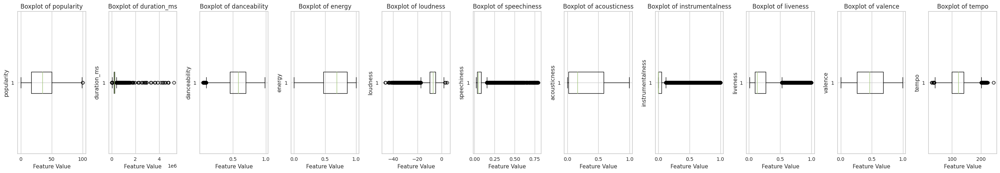

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=len(numeric_cols), figsize=(28, 5))

for i, col in enumerate(numeric_cols):
    axes[i].boxplot(df_6[col], vert=False)

    axes[i].set_title(f"Boxplot of {col}")
    axes[i].set_xlabel("Feature Value")
    axes[i].set_ylabel(col)

fig.tight_layout()

plt.show()

Each boxplot represents the distribution of different features (likely from a dataset related to Spotify songs, given the context) such as `popularity`, `duration_ms`, `danceability`, etc. Here’s a breakdown of what each boxplot tells us about the corresponding feature:

**General Structure of Boxplots**
- **Box (Interquartile Range, IQR):** The box itself represents the interquartile range, which contains the middle 50% of the data.
  - **Lower Quartile (Q1, bottom of the box):** The 25th percentile of the data.
  - **Upper Quartile (Q3, top of the box):** The 75th percentile of the data.
  - **Median (Green Line):** The line inside the box represents the median (50th percentile).
- **Whiskers:** The lines extending from the box represent the range of the data within 1.5 times the IQR from the quartiles.
- **Outliers (circles):** Points beyond the whiskers are considered outliers and are plotted as individual points.

**Explanation of Each Boxplot**

1. **Popularity:**
   - **Range:** Most of the values are centered around the 50th percentile, with the data slightly skewed towards higher values (near the upper quartile).
   - **Outliers:** There are a few outliers on the higher end of the popularity scale, indicating some exceptionally popular songs.

2. **Duration (duration_ms):**
   - **Highly Skewed:** The boxplot for duration shows significant skewness. Most songs are relatively short, but there are extreme outliers representing much longer songs (possibly podcasts or extended versions).

3. **Danceability:**
   - **Distribution:** The danceability feature seems fairly evenly distributed with minimal outliers. The middle 50% of the data is concentrated within the 0.5 to 0.7 range.
   - **Spread:** The spread is wide, indicating a broad range of danceability scores.

4. **Energy:**
   - **Distribution:** The energy feature shows a wide range, mostly centered around the 0.5 to 0.7 range, with minimal outliers.
   - **Outliers:** There are only a few points classified as outliers, indicating that most songs follow a similar energy pattern.

5. **Loudness:**
   - **Outliers:** There are significant outliers on the lower end, suggesting some songs are much quieter than the rest of the data.
   - **Skewed:** The majority of the songs have loudness values closer to the upper quartile (closer to 0 dB), with some extreme outliers.

6. **Speechiness:**
   - **Tightly Packed:** The speechiness feature is tightly packed within a narrow range, with a small interquartile range, but many outliers on the upper end. This suggests that most songs have low speechiness, with a few exceptions.
   - **Outliers:** These outliers might represent tracks with a high percentage of spoken words, such as podcasts or songs with prominent lyrics.

7. **Acousticness:**
   - **Skewed Distribution:** Acousticness is spread widely but leans more toward the lower values, with the median below 0.5. The whiskers show a long tail, indicating many songs are more electronic or less acoustic.
   - **Outliers:** A few outliers suggest that some tracks are very acoustic in nature.

8. **Instrumentalness:**
   - **Highly Skewed:** The distribution of instrumentalness is highly skewed, with the bulk of the songs having near-zero instrumentalness, indicating that most songs have vocals.
   - **Outliers:** There are numerous outliers with higher instrumentalness, indicating a small subset of instrumental tracks.

9. **Liveness:**
   - **Skewed with Outliers:** Liveness has a very concentrated distribution, but there are a lot of outliers on the upper end, suggesting some songs are recorded in front of a live audience.
   - **Typical Values:** Most songs have relatively low liveness scores.

10. **Valence:**
    - **Broad Distribution:** Valence is fairly evenly distributed across the middle range, suggesting that there’s a balance between positive and negative moods in the songs.
    - **Minimal Outliers:** There are few outliers, showing that extreme emotional values (either very positive or very negative) are rare.

11. **Tempo:**
    - **Moderately Distributed:** Tempo values are fairly spread out, with the middle 50% of the data concentrated in a typical range for most songs.
    - **Outliers:** There are a few outliers with extreme tempos, representing either very fast or very slow tracks.

**Summary**
- **Outliers:** Features like `duration_ms`, `loudness`, `speechiness`, and `liveness` exhibit many outliers, indicating that some songs deviate significantly from the norm in terms of these features.
- **Distribution of Features:** Most features have reasonably spread-out distributions, except for `speechiness`, `instrumentalness`, and `liveness`, which are more skewed, suggesting that most songs have low values in these categories.
- **Insights:** These boxplots provide a visual summary of how the features vary across the dataset. For instance, you can infer that most songs have low instrumentalness and speechiness, but there are a few exceptional cases where these values are high.

These insights can help in preprocessing your data, tuning models, or interpreting trends in your dataset.

### Percentage of Outliers in Each Numeric Columns (via IQR Method)

In [ ]:
for col in numeric_cols:
    q1 = df_6[col].quantile(0.25)
    q3 = df_6[col].quantile(0.75)
    iqr = q3 - q1

    upper_boundary = q3 + 1.5 * iqr
    lower_boundary = q1 - 1.5 * iqr

    outliers = df_6[(df_6[col] < lower_boundary) | (df_6[col] > upper_boundary)][col]
    outlier_percent = outliers.count() / df_6[col].count() * 100

    print(f"{col} has {outlier_percent:.2f}% outliers")

popularity has 0.00% outliers
duration_ms has 4.95% outliers
danceability has 0.41% outliers
energy has 0.00% outliers
loudness has 5.29% outliers
speechiness has 11.23% outliers
acousticness has 0.00% outliers
instrumentalness has 22.11% outliers
liveness has 7.15% outliers
valence has 0.00% outliers
tempo has 0.43% outliers


#### Numeric Features with more than 3% Outliers

In [ ]:
for col in numeric_cols:
    q1 = df_6[col].quantile(0.25)
    q3 = df_6[col].quantile(0.75)
    iqr = q3 - q1

    upper_boundary = q3 + 1.5 * iqr
    lower_boundary = q1 - 1.5 * iqr

    outliers = df_6[(df_6[col] < lower_boundary) | (df_6[col] > upper_boundary)][col]
    outlier_percent = outliers.count() / df_6[col].count() * 100

    if outlier_percent >= 3:
      print(f"{col} has {outlier_percent:.2f}% outliers")

duration_ms has 4.95% outliers
loudness has 5.29% outliers
speechiness has 11.23% outliers
instrumentalness has 22.11% outliers
liveness has 7.15% outliers


* The outliers for "speechiness", "instrumentalness", and "time_signature" will not be removed. This data is too important and can be easily misleading if treated. For example treating "speechiness" and "instrumentalness" may remove rap songs on one end and classical on the other, both of which would have components of making a song popular.

* The features having equal to or more than 3% outliers will be transformed by the Yeo-Johnson method.

### Conducting Yeo-Johnson Test

In [ ]:
transformed_data = df_6.copy()

transformed_data['duration_ms'], duration_lambda = yeojohnson(transformed_data['duration_ms'])
transformed_data['loudness'], loudness_lambda = yeojohnson(transformed_data['loudness'])
transformed_data['liveness'], liveness_lambda = yeojohnson(transformed_data['liveness'])

In [ ]:
transformed_data[['duration_ms',
                  'loudness',
                  'liveness']].describe()

,duration_ms,loudness,liveness
count,112114.000000,112114.000000,112114.000000
mean,25.492316,-2.261710,0.096377
std,1.398282,0.558779,0.033691
min,16.991652,-4.408359,0.008957
25%,24.740121,-2.592418,0.071328
50%,25.473875,-2.225606,0.086926
75%,26.246273,-1.900136,0.126483
max,39.753655,13.600535,0.163462


In [ ]:
num_cols = numeric_cols
df_num = transformed_data[num_cols]

for col in num_cols:
    q1 = transformed_data[col].quantile(0.25)
    q3 = transformed_data[col].quantile(0.75)
    iqr = q3 - q1

    upper_boundary = q3 + 1.5 * iqr
    lower_boundary = q1 - 1.5 * iqr

    outliers = transformed_data[(transformed_data[col] < lower_boundary) | (transformed_data[col] > upper_boundary)][col]
    outlier_percent = outliers.count() / transformed_data[col].count() * 100

    print(f"{col} has {outlier_percent:.2f}% outliers")

popularity has 0.00% outliers
duration_ms has 4.46% outliers
danceability has 0.41% outliers
energy has 0.00% outliers
loudness has 2.26% outliers
speechiness has 11.23% outliers
acousticness has 0.00% outliers
instrumentalness has 22.11% outliers
liveness has 0.00% outliers
valence has 0.00% outliers
tempo has 0.43% outliers


* The Yeo-Johnson was able to reduce the percentage of outliers in `loudness` by over 50%.

* The percentage of outliers for `liveness` was reduced to 0.0%.

* The `duration_ms` feature's percentage of outliers was not significantly reduced.

* Being that the goal of outlier detection is to identify values that are significantly outside the general distribution of the data, the wise choice seems to be to leave the data as is within a 1.5 IQR multiplier. Some songs are just LONG.

In [ ]:
df_t = transformed_data.copy()

In [ ]:
df_t.shape

(112114, 34)

# Basic EDA

## Distributions of Each Numeric Features

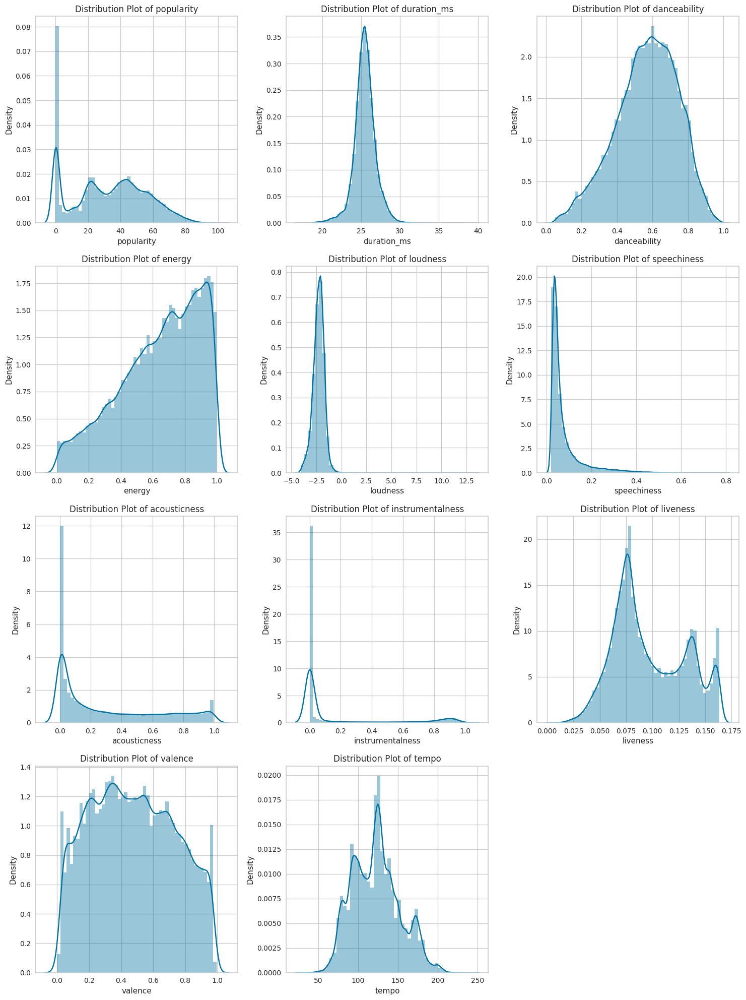

In [ ]:
n_cols = len(num_cols)
n_rows = int(np.ceil(n_cols / 3))

fig, axes = plt.subplots(n_rows, 3, figsize=(15, 5*n_rows))

for i, col in enumerate(num_cols):
    row_idx = i // 3
    col_idx = i % 3
    sns.distplot(df_t[col], ax=axes[row_idx, col_idx], kde=True)

    axes[row_idx, col_idx].set_title(f"Distribution Plot of {col}")
    axes[row_idx, col_idx].set_xlabel(col)

for i in range(n_cols, n_rows*3):
    fig.delaxes(axes.flatten()[i])

fig.tight_layout()
plt.show()

These multiple **distribution plots** (also known as **kernel density plots** or histograms with a density curve). Each plot represents the distribution of a specific feature in your dataset, likely related to audio or song features (similar to those seen in Spotify or other music-related datasets). Let’s go through the details of each plot.

1. **Popularity**
   - **Shape:** The distribution of popularity is multimodal, meaning there are multiple peaks. The highest density is around the lower popularity scores (between 0 and 20), with smaller peaks in the middle and higher popularity ranges.
   - **Skewness:** It is slightly right-skewed with a large concentration of songs at the lower popularity range and a smaller concentration at higher popularity values (closer to 100).

2. **Duration (duration_ms)**
   - **Shape:** This distribution is unimodal with a sharp peak, suggesting that most songs have a similar duration (around 20-30 minutes, likely in milliseconds).
   - **Skewness:** The distribution is slightly left-skewed, with most songs having a typical length, and very few longer or shorter songs.

3. **Danceability**
   - **Shape:** Danceability shows a relatively symmetrical bell-shaped distribution, peaking around 0.6 to 0.7. This indicates that most songs have moderate danceability.
   - **Range:** The range spans from close to 0 to 1, indicating that there is a wide variety of songs in terms of danceability.

4. **Energy**
   - **Shape:** The energy distribution has a steady increase and peaks around 0.8 to 1.0, indicating that most songs are energetic.
   - **Skewness:** The distribution is slightly left-skewed, meaning that fewer songs have low energy.

5. **Loudness**
   - **Shape:** The loudness distribution is centered around -5 dB, with a sharp peak at that value. This suggests that most songs have similar loudness levels.
   - **Skewness:** The distribution is right-skewed, indicating that there are some songs that are quieter than the majority of the data.

6. **Speechiness**
   - **Shape:** The speechiness distribution is heavily right-skewed, with most songs having very low speechiness values (close to 0). This indicates that the majority of songs have very few spoken words or are mostly instrumental.
   - **Outliers:** There are a few songs with high speechiness (closer to 1.0), likely spoken word tracks or podcasts.

7. **Acousticness**
   - **Shape:** Acousticness is strongly right-skewed, meaning most songs have low acousticness scores (closer to 0). This indicates that most songs are more electronically produced or processed.
   - **Outliers:** There are a few outliers with high acousticness (closer to 1.0), which are likely acoustic or unplugged tracks.

8. **Instrumentalness**
   - **Shape:** The distribution of instrumentalness is heavily right-skewed, with the majority of songs having a value close to 0. This suggests that most songs contain vocals.
   - **Outliers:** There are some outliers with higher instrumentalness values, which likely correspond to purely instrumental tracks.

9. **Liveness**
   - **Shape:** The liveness distribution is also right-skewed, with most songs having low liveness scores (close to 0). This suggests that most songs are recorded in studios rather than live environments.
   - **Peaks:** There are a few peaks in the distribution, indicating that some songs are recorded live, with higher liveness scores.

10. **Valence**
   - **Shape:** The valence distribution is relatively uniform, suggesting that there is a balanced mix of positive and negative emotional content across the songs in the dataset.
   - **Symmetry:** The distribution is approximately symmetric, centered around 0.5, indicating a balanced distribution of valence.

11. **Tempo**
   - **Shape:** The tempo distribution is multimodal, indicating that there are distinct clusters of songs with specific tempos (e.g., around 50 BPM, 100 BPM, and 150 BPM).
   - **Spread:** There is a wide range of tempos across songs, from very slow to very fast.


These distribution plots give a clear picture of how various audio features are distributed across the dataset:
- **Right-Skewed Features:** Features like `speechiness`, `acousticness`, `instrumentalness`, and `liveness` are heavily right-skewed, meaning most songs have low values for these features.
- **Bimodal or Multimodal Features:** Some features, like `popularity` and `tempo`, exhibit multimodal distributions, suggesting the presence of distinct clusters within the data.
- **Symmetric Features:** Features like `danceability` and `valence` show relatively symmetric distributions, indicating a balanced range of values across songs.

These insights help in understanding the characteristics of the songs in the dataset and can guide further analysis or modeling steps, such as clustering or classification.

## Checking the Normality with Kolmogorov-Smirnov (K-S) test

In [ ]:
data = df_t[num_cols]

for col in data.columns:
    kstest_result = stats.kstest(data[col], 'norm')

    print(f"{col} - K-S test statistic:", kstest_result.statistic)
    print(f"{col} - p-value:", kstest_result.pvalue)
    print('\n')

popularity - K-S test statistic: 0.8289032371700397
popularity - p-value: 0.0


duration_ms - K-S test statistic: 1.0
duration_ms - p-value: 0.0


danceability - K-S test statistic: 0.5529085884415816
danceability - p-value: 0.0


energy - K-S test statistic: 0.5140476758003281
energy - p-value: 0.0


loudness - K-S test statistic: 0.8779776661815077
loudness - p-value: 0.0


speechiness - K-S test statistic: 0.5089964736717827
speechiness - p-value: 0.0


acousticness - K-S test statistic: 0.5
acousticness - p-value: 0.0


instrumentalness - K-S test statistic: 0.5
instrumentalness - p-value: 0.0


liveness - K-S test statistic: 0.5075470218183802
liveness - p-value: 0.0


valence - K-S test statistic: 0.5077847978416873
valence - p-value: 0.0


tempo - K-S test statistic: 1.0
tempo - p-value: 0.0




The output is from performing the **Kolmogorov-Smirnov (K-S) test** on different features in the dataset. The **K-S test** is a non-parametric test that compares a sample distribution with a reference probability distribution (often a uniform or normal distribution). The test yields two key statistics:

- **K-S Test Statistic**: This value measures the distance between the empirical distribution of the data and the reference distribution. A value close to 1 indicates a significant deviation from the reference distribution, whereas a value close to 0 indicates a closer fit.
- **p-value**: This value helps determine whether the deviation between the empirical and reference distribution is statistically significant. A very small p-value (typically less than 0.05) suggests that the empirical distribution differs significantly from the reference distribution.

**Interpretation**

1. **Test Statistics**:
   - Almost all features have high K-S statistics, close to 0.5 or above. This indicates that the empirical distributions of these features are significantly different from the reference distribution (likely normal or uniform).
   - Some features, like `duration_ms` and `tempo`, have test statistics very close to 1, indicating an extreme deviation from the reference distribution.

2. **p-values**:
   - The p-values for all features are 0.0 (or close to 0). This means that the null hypothesis (which assumes that the data follows the reference distribution) can be rejected with very high confidence. In other words, the data distributions for all the features significantly differ from the reference distribution.

**Significance**
- The K-S test results show that none of the features in your dataset follow the assumed reference distribution. This is important because many machine learning models, such as linear regression or certain types of classifiers, assume that the features follow a specific distribution (e.g., normal). Therefore, these results suggest that:
  - **Standardization/Normalization**: You might need to apply normalization or standardization techniques to transform your features into a more normal-like distribution.
  - **Model Choice**: Consider using models that do not assume normality in the data, such as tree-based models (Random Forest, Gradient Boosting) or neural networks, which are less sensitive to the distribution of the features.

**Specific Features**
- **Features with K-S Statistic = 1 (e.g., `duration_ms`, `tempo`)**: These features have distributions that are completely different from the reference distribution, so further transformations like log-scaling, standard scaling, or even feature engineering might be necessary.

The K-S test results highlight that most of your features do not follow the assumed reference distribution. Depending on your machine learning model, you may need to apply transformations, use more flexible algorithms that don't assume normality, or conduct further exploration to understand the nature of each feature better.

## Checking Normality through Various Transformations

In [ ]:
new_df = pd.DataFrame()

for col_name in num_cols:
    new_df[f'log({col_name})'] = np.log1p(df_6[col_name])
    new_df[f'sqrt({col_name})'] = np.sqrt(df_6[col_name])
    new_df[f'exp({col_name})'] = np.exp(df_6[col_name])

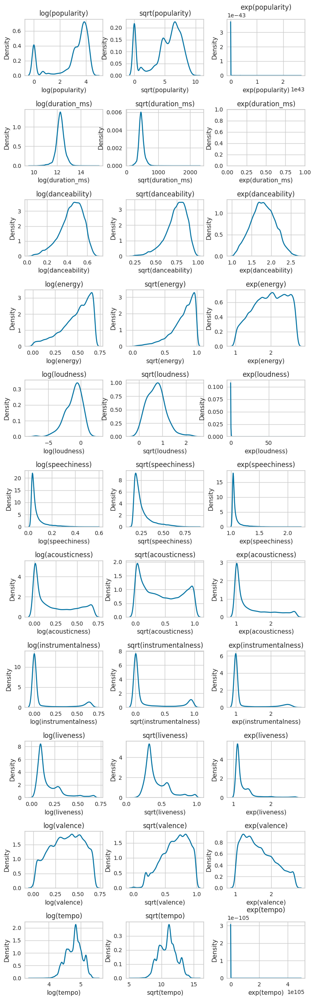

In [ ]:
plot_cols = 3

fig_width = 8
fig_height = 25
subplot_width = fig_width / plot_cols
subplot_height = fig_height / (len(num_cols) / plot_cols)

fig, axes = plt.subplots(len(num_cols), plot_cols, figsize=(fig_width, fig_height))

for i, col_name in enumerate(num_cols):
    for j, transform in enumerate(['log', 'sqrt', 'exp']):
        plot_data = new_df[f"{transform}({col_name})"]
        plot_title = f"{transform}({col_name})"
        ax = axes[i, j]
        sns.kdeplot(plot_data, ax=ax)
        ax.set_title(plot_title)

plt.tight_layout()
plt.subplots_adjust(hspace=0.6, wspace=0.3)
plt.show()

This image shows multiple sets of **transformed distribution plots** for various features. For each feature (e.g., **popularity**, **duration_ms**, **danceability**, etc.), the distribution has been transformed using three different mathematical transformations: logarithmic (log), square root (sqrt), and exponential (exp). These transformations are commonly applied in data preprocessing to normalize data or handle skewed distributions.

**Purpose of the Transformations**

1. **Log Transformation (`log`)**:
   - **Purpose:** This transformation is typically used to reduce the skewness of data, compressing the scale of large values while preserving the order of the data.
   - **Application:** Useful when the data has long tails or extreme values that need to be scaled down.

2. **Square Root Transformation (`sqrt`)**:
   - **Purpose:** This transformation also compresses the scale of data but is less aggressive than the log transformation. It is commonly used when dealing with moderate skewness or to stabilize variance.
   - **Application:** Often used when the data contains positive values and is right-skewed.

3. **Exponential Transformation (`exp`)**:
   - **Purpose:** This transformation is generally used to expand the scale of the data, which can exaggerate differences between values.
   - **Application:** It is rarely used for normalization but could be used for increasing the separation between values when necessary.

**Explanation of Each Row in the Image**

1. **Popularity**:
   - **Log Transformation:** Shows a more compressed distribution with less skewness.
   - **Square Root Transformation:** The distribution is still bimodal, but the values are compressed towards the center.
   - **Exponential Transformation:** The distribution appears extremely skewed, with an extremely large outlier due to the exponential function inflating the values.

2. **Duration (duration_ms)**:
   - **Log Transformation:** Smooths out the sharp peak in the original distribution and reduces the scale.
   - **Square Root Transformation:** Compresses the values and reduces the extreme differences, but retains the peak.
   - **Exponential Transformation:** Produces an extremely sharp peak with a long tail, as the exponential transformation dramatically inflates the values.

3. **Danceability**:
   - **Log and Square Root:** Both transformations help in compressing the data, reducing the range of the feature.
   - **Exponential Transformation:** The range is drastically expanded, producing a sharp peak near 0 and rapidly inflating higher values.

4. **Energy**:
   - **Log Transformation:** Smooths the distribution and reduces skewness.
   - **Square Root Transformation:** Compresses the data but retains the original shape.
   - **Exponential Transformation:** Results in a sharp peak near lower values, which may make the distribution less interpretable.

5. **Loudness**:
   - **Log Transformation:** Smooths the distribution, pulling in extreme values.
   - **Square Root Transformation:** Compresses the range of the distribution, reducing the scale of differences in loudness.
   - **Exponential Transformation:** The extreme nature of this transformation results in an outlier-heavy distribution.

6. **Speechiness**:
   - **Log and Square Root Transformations:** Both transformations help to manage the skewed nature of the original data, compressing the scale.
   - **Exponential Transformation:** Expands the distribution, producing a long tail towards high values.

7. **Acousticness**:
   - **Log and Square Root Transformations:** Both transformations compress the data, reducing skewness and the range of the values.
   - **Exponential Transformation:** Results in a sharp peak, expanding the values drastically.

8. **Instrumentalness**:
   - **Log and Square Root Transformations:** These help to make the data more normally distributed, reducing the concentration of values near 0.
   - **Exponential Transformation:** Results in a sharp peak and extreme inflation of values.

9. **Liveness**:
   - **Log and Square Root Transformations:** These help to reduce the skewness, compressing the scale of the values.
   - **Exponential Transformation:** Expands the range of values drastically, making it harder to interpret.

10. **Valence**:
   - **Log and Square Root Transformations:** Both transformations help to reduce the spread of values, making the distribution more normal.
   - **Exponential Transformation:** Expands the values, creating a sharp peak near the lower range.

11. **Tempo**:
   - **Log and Square Root Transformations:** These reduce the spread and smooth out the distribution, compressing extreme values.
   - **Exponential Transformation:** Expands the data, resulting in a highly skewed distribution.

**General Insights**
- **Logarithmic and Square Root Transformations:** Both transformations are effective in reducing skewness, compressing extreme values, and making the distributions more normal or symmetric. These are typically used when data has a long tail or when extreme values could skew the results of a model.
  
- **Exponential Transformation:** The exponential transformation expands the scale of the data and may not be appropriate for normalization or making data more interpretable. It tends to produce more extreme values and can distort the distribution, leading to heavily skewed plots.

These transformations can help in data preprocessing by making the data more suitable for machine learning models, especially those sensitive to non-normal distributions like linear regression or algorithms requiring normalized data.

In [ ]:
df_t.head()

,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,...,Vivo_album,Christmas_album,Ao_album,Others_album,artist_The Beatles,artist_George Jones,artist_Stevie Wonder,artist_Ella Fitzgerald,artist_Linkin Park,artist_Others
0,73,25.770518,False,0.676,0.4610,C-sharp_D-flat,-2.194176,minor,0.1430,0.0322,...,False,False,False,True,False,False,False,False,False,True
1,55,24.176230,False,0.420,0.1660,C-sharp_D-flat,-3.204876,major,0.0763,0.9240,...,False,False,False,True,False,False,False,False,False,True
2,57,25.433194,False,0.438,0.3590,C,-2.572481,major,0.0557,0.2100,...,False,False,False,True,False,False,False,False,False,True
3,71,25.272704,False,0.266,0.0596,C,-3.287467,major,0.0363,0.9050,...,False,False,False,True,False,False,False,False,False,True
4,82,25.215646,False,0.618,0.4430,D,-2.566679,major,0.0526,0.4690,...,False,False,False,True,False,False,False,False,False,True


## Distribution of the `popularity` Column

<Figure size 1800x1200 with 0 Axes>

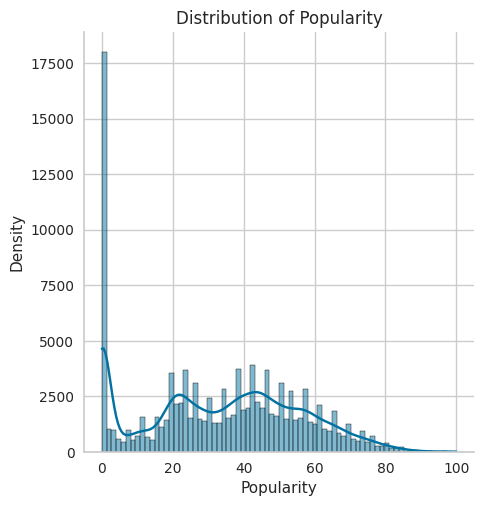

In [ ]:
plt.figure(figsize=(18, 12))
sns.displot(df_t['popularity'], kde=True)
plt.title('Distribution of Popularity')
plt.xlabel('Popularity')
plt.ylabel('Density')
plt.show()

This plot is a **histogram** with a **density plot** overlaid, showing the **distribution of the `Popularity` feature** in the dataset. Here's how to interpret it:

**Key Observations**
1. **Y-axis (Density)**: This axis shows the frequency or count of songs that fall into different popularity ranges. The large peak at the beginning indicates that there are many songs with very low popularity.

2. **X-axis (Popularity)**: This axis represents the popularity score of the songs, likely on a scale from 0 to 100 (common for such features in music datasets).

3. **Distribution Shape**:
   - **Right-Skewed Distribution**: The distribution is heavily right-skewed, meaning that the majority of the songs have low popularity scores, and only a small proportion of songs have high popularity.
   - The large spike at the far left near a popularity score of 0 suggests that many songs are either very unpopular or new, potentially having little exposure or engagement.
   - As the popularity score increases, the frequency of songs decreases, with fewer songs achieving very high popularity.

4. **Density Curve**:
   - The density curve smooths the histogram to show the general trend of the distribution. It reflects the overall skewness and highlights the fact that the distribution tapers off as popularity increases.

**Interpretation**
- **Long Tail**: This distribution suggests a classic "long tail" scenario in the music industry, where a small number of songs achieve high popularity, while the majority of songs remain relatively unknown.
- **Data Imbalance**: The imbalance in the popularity distribution might impact machine learning models. For example, predicting highly popular songs may be more difficult due to the scarcity of such examples in the dataset.
- **Possible Actions**:
  - **Feature Transformation**: A log transformation or other scaling techniques might be considered to handle the skewness.
  - **Balancing Strategies**: In modeling, you might consider techniques to handle the class imbalance, such as resampling (oversampling or undersampling) or using class-weighted algorithms.

Overall, this plot shows that most songs in the dataset have low popularity, which could influence our approach to modeling and evaluation.

## Relation with `popularity` for Each Feature

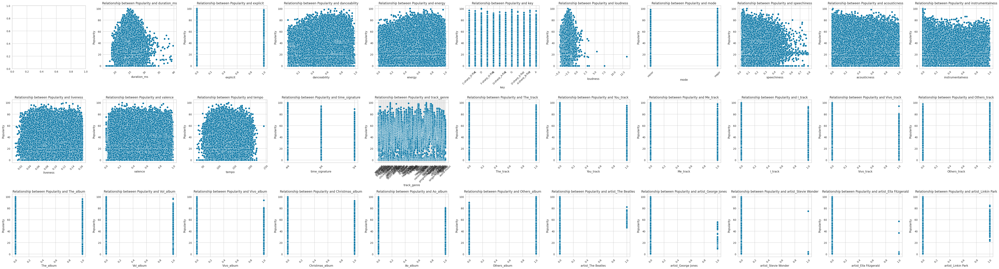

In [ ]:
import math

num_features = len(df_t.columns) - 1
num_rows = 3
num_cols = math.ceil(num_features / num_rows)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 15))

feature_index = 0
for row in range(num_rows):
    for col in range(num_cols):
        if feature_index < num_features:
            feature = df_t.columns[feature_index]
            if feature != 'popularity':
                sns.scatterplot(x=feature, y='popularity', data=df_t, ax=axes[row, col])
                axes[row, col].set_title(f'Relationship between Popularity and {feature}')
                axes[row, col].set_xlabel(feature)
                axes[row, col].set_ylabel('Popularity')
                axes[row, col].tick_params(axis='x', rotation=45)
            feature_index += 1
        else:
            fig.delaxes(axes[row, col])

fig.tight_layout()
plt.show()

This image contains a grid of **scatter plots**, each representing the relationship between the `Popularity` feature and other features in your dataset. Scatter plots are useful for visualizing the relationship between two continuous variables, and they help identify trends, correlations, and patterns in the data.

**Interpretation**

1. **Popularity vs. Other Features**:
   - Each scatter plot shows the relationship between **`Popularity`** (on the y-axis) and a specific feature (on the x-axis). The scatter plots are used to observe how the values of each feature relate to the popularity of a track.
   
2. **General Trends**:
   - **For Continuous Features** (e.g., `duration_ms`, `danceability`, `energy`, `loudness`, `valence`, etc.):
     - The scatter plots generally show a **random spread** of points with no clear linear relationship between these features and `Popularity`.
     - For example, the relationship between `Popularity` and `duration_ms` shows that songs with various durations span the entire range of popularity, indicating no obvious correlation.
     - Similarly, for features like `danceability`, `energy`, and `valence`, popularity seems to be spread across a wide range of values, showing that these features do not have a strong influence on popularity by themselves.

3. **Categorical/Binary Features**:
   - For binary or categorical features such as **`track_genre`, `The_album`, `You_track`, and artist-related features**:
     - The scatter plots display vertical lines or clusters of points, as these features take on discrete values (e.g., 0 or 1). These plots show that most tracks belong to a specific group or are associated with the category "Others" rather than specific named artists or albums.
     - For example, in the scatter plot of `Popularity` vs. `artist_The Beatles`, most tracks have a `Popularity` score of 0, with only a few outliers at higher popularity values.

4. **Key Observations**:
   - **No Strong Linear Correlations**: Based on these scatter plots, it appears that none of the individual features have a strong linear correlation with `Popularity`. The data points are dispersed randomly across the popularity spectrum, suggesting that the relationship between `Popularity` and these features is likely non-linear or may require interaction between multiple features to be meaningful.
   - **Outliers**: In some plots (e.g., `loudness`, `track_genre`), there are distinct outliers, which could represent songs that deviate significantly from the general trend. These outliers might warrant further investigation as they could have specific characteristics leading to high or low popularity.
   
**Possible Implications for Modeling**
- **Feature Engineering**: The scatter plots indicate that no single feature strongly predicts popularity, so it may be necessary to explore feature interactions or transformations. You might also consider using more complex models (e.g., tree-based models or neural networks) that can capture non-linear relationships.
- **Handling Categorical Data**: For the categorical and binary features, one-hot encoding or similar encoding techniques will likely be required for modeling.
- **Outlier Treatment**: Some scatter plots suggest the presence of outliers, particularly in features like `loudness`. Depending on the model you choose, it may be beneficial to address these outliers.

In summary, these scatter plots provide an overview of how each feature relates to `Popularity`, suggesting that the relationship between features and popularity is complex and may require advanced modeling techniques to capture effectively.

## Distribution of Each Categorical Feature

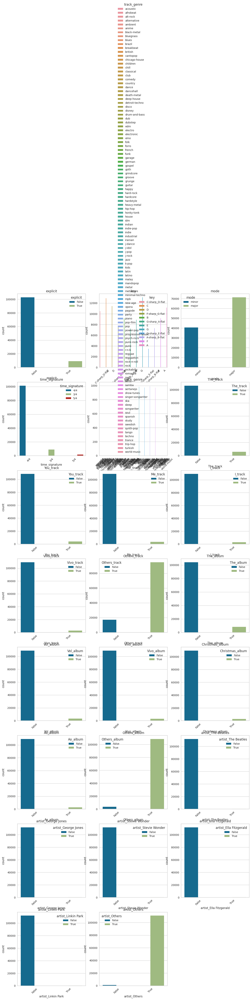

In [ ]:
n_cols = 3
n_rows = math.ceil(len(categorical_cols) / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 6 * n_rows))

for i, column in enumerate(categorical_cols):
    row = i // n_cols
    col = i % n_cols

    sns.countplot(x=column,
                  data=df_t.loc[:, categorical_cols],
                  hue=column,
                  ax=axes[row, col])

    current_ticks = axes[row, col].get_xticks()
    current_tick_labels = axes[row, col].get_xticklabels()

    axes[row, col].set_xticks(current_ticks,
                              labels=current_tick_labels,
                              rotation=45)
    axes[row, col].set_title(column)

for i in range(len(categorical_cols), n_rows * n_cols):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout()
plt.show()

These plots represent **count plots** (also known as bar plots) for various categorical features in the dataset. Each plot displays the frequency of each category within the feature. Let’s break down the different plots shown in the image:

1. **Explicit**
   - This plot shows the count of songs that are **explicit** (`True`) versus those that are not (`False`).
   - **Insight:** There are far more non-explicit songs compared to explicit ones.

2. **Key**
   - This plot shows the distribution of songs across different musical **keys** (C, C-sharp/D-flat, D, etc.).
   - **Insight:** There is a relatively balanced distribution across keys, though some keys are more common (e.g., C major, G major) than others.

3. **Mode**
   - This plot shows the count of songs in the **major** and **minor** musical modes.
   - **Insight:** There are significantly more songs in the major mode than in the minor mode.

4. **Time Signature**
   - This plot displays the count of songs with different **time signatures**.
   - **Insight:** The vast majority of songs have a 4/4 time signature, with much smaller counts for other time signatures like 3/4 and 5/4.

5. **Track Genre**
   - This plot shows the distribution of songs across various **genres**.
   - **Insight:** There are numerous genres represented, but no individual genre appears to dominate the dataset.

6. **The Track, You Track, Me Track, I Track, Vivo Track, Others Track**
   - These plots represent whether the song contains certain specific words in the track title (e.g., "The", "You", "Me", "I", "Vivo", or "Others").
   - **Insight:** The vast majority of tracks do not contain these specific words in their titles, with a small fraction that do.

7. **The Album, Vol Album, Vivo Album, Ao Album, Christmas Album, Others Album**
   - These plots are similar to the track title plots but instead show whether the album title contains certain words (e.g., "The", "Vol", "Vivo", "Ao", "Christmas", "Others").
   - **Insight:** The dataset contains a relatively small number of albums with these specific words in their titles, with most albums falling into the "False" category.

8. **Artists (The Beatles, George Jones, Stevie Wonder, Ella Fitzgerald, Linkin Park, Others)**
   - These plots show whether a song is attributed to a specific artist (e.g., The Beatles, George Jones, Stevie Wonder, Ella Fitzgerald, Linkin Park, or others).
   - **Insight:** The vast majority of songs in the dataset are attributed to "Others" (not these specific artists). Only a small fraction of the dataset contains songs by these named artists.

**General Observations**
- **Imbalanced Categories:** In many of these features, one category dominates the others. For example, most songs are non-explicit, have a 4/4 time signature, and do not contain specific words in their titles or albums. Similarly, the "Others" category dominates the artist-related plots, indicating that the dataset includes many songs from artists who are not among the specific artists highlighted in the plot.
  
- **Balanced Categories:** The **key** and **genre** plots show more balanced distributions, indicating a diverse range of musical keys and genres represented in the dataset.

**Use Cases**
- **Data Preprocessing:** These plots can help identify imbalances in the dataset, which could inform decisions about data preprocessing (e.g., whether to balance the dataset).
- **Feature Importance:** Some features, such as **mode** and **key**, may have more influence on models related to music analysis, such as genre classification or popularity prediction.

Overall, these count plots provide insights into the distribution of categorical features in the dataset, helping to understand the structure of the data before further analysis or modeling.

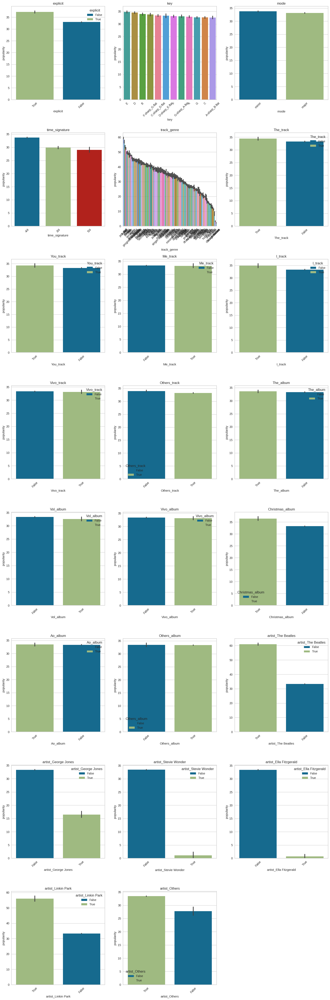

In [ ]:
n_cols = 3
n_rows = math.ceil(len(categorical_cols) / n_cols)

fig, axes = plt.subplots(n_rows,
                         n_cols,
                         figsize=(16, 6 * n_rows))

for i, column in enumerate(categorical_cols):
    row = i // n_cols
    col = i % n_cols

    order = df_t.groupby(column)['popularity'].mean().sort_values(ascending=False).index

    sns.barplot(x=column,
                y='popularity',
                data=df_t,
                estimator=np.mean,
                hue=column,
                order=order,
                ax=axes[row, col])

    axes[row, col].set_title(column)
    axes[row, col].tick_params(axis='x',
                               rotation=45)


for i in range(len(categorical_cols), n_rows * n_cols):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout()
plt.show()

These are **bar plots** that depict the relationship between different categorical features and the **mean popularity** of songs. Each plot shows how the average popularity varies across different categories within the feature. Let's go through them one by one:

1. **Explicit**
   - **Insight:** The mean popularity of explicit songs is slightly higher than that of non-explicit songs.

2. **Key**
   - **Insight:** The mean popularity across different musical keys is relatively similar, with slight variations. No particular key seems to have a significantly higher or lower mean popularity.

3. **Mode**
   - **Insight:** The mean popularity of songs in the major mode is almost identical to the mean popularity of songs in the minor mode.

4. **Time Signature**
   - **Insight:** The mean popularity for songs with a 4/4 time signature is slightly higher than for songs with other time signatures (such as 3/4 and 5/4).

5. **Track Genre**
   - **Insight:** There is a noticeable variation in the mean popularity across different genres. Some genres have much higher average popularity than others. The plot shows a descending order of popularity, indicating which genres tend to be more popular on average.

6. **The Track, You Track, Me Track, I Track, Vivo Track, Others Track**
   - These plots compare the mean popularity of songs based on whether they contain specific words (e.g., "The", "You", "Me", "I", "Vivo", "Others") in their titles.
   - **Insight:** In most cases, songs that contain these specific words in the title have very similar mean popularity to those that do not. For example, the popularity of songs with "The" in the title is nearly the same as songs without it.

7. **The Album, Vol Album, Vivo Album, Ao Album, Christmas Album, Others Album**
   - These plots compare the mean popularity of songs based on whether their album titles contain specific words.
   - **Insight:** The average popularity does not differ much between albums that contain these specific words and those that do not. However, albums labeled "Christmas album" seem to have slightly higher mean popularity compared to non-Christmas albums.

8. **Artists (The Beatles, George Jones, Stevie Wonder, Ella Fitzgerald, Linkin Park, Others)**
   - These plots show the mean popularity of songs attributed to specific artists compared to songs attributed to other artists (categorized as "False").
   - **Insight:** In most cases, songs from "The Beatles", "George Jones", "Stevie Wonder", "Ella Fitzgerald", and "Linkin Park" have lower average popularity compared to songs by other artists. This may indicate that, in this dataset, the songs from these iconic artists tend to be less popular than those by other artists.

**General Observations**
- **Balanced Features:** For most features (e.g., explicit, key, mode, time signature), the mean popularity is relatively consistent across categories, indicating that these features do not have a strong influence on popularity.
  
- **Genre-Specific Insights:** The **track genre** feature shows significant variability in popularity, suggesting that genre may be a more important determinant of popularity compared to features like key or mode.

- **Word Presence in Titles/Albums:** The presence of specific words in track or album titles does not seem to have a strong impact on the popularity of the songs.


These bar plots help to understand how categorical features correlate with the average popularity of songs. While some features like **genre** seem to have a noticeable impact on popularity, others such as **mode** and **time signature** appear to have little effect. This insight could be valuable for building predictive models or making decisions related to song recommendation or content creation.

# Feature Engineering 2

In [ ]:
track_cols = [col for col in df_t.columns if col.endswith('_track')]
album_cols = [col for col in df_t.columns if col.endswith('_album')]

for col in track_cols + album_cols:
    df_t[col] = df_t[col].astype(int)

In [ ]:
artist_cols = [col for col in df_t.columns if col.startswith('artist_')]

for col in artist_cols:
  df_t[col] = df_t[col].astype(int)

In [ ]:
df_t.iloc[:, -18:].describe()

,The_track,You_track,Me_track,I_track,Vivo_track,Others_track,The_album,Vol_album,Vivo_album,Christmas_album,Ao_album,Others_album,artist_The Beatles,artist_George Jones,artist_Stevie Wonder,artist_Ella Fitzgerald,artist_Linkin Park,artist_Others
count,112114.000000,112114.000000,112114.000000,112114.000000,112114.000000,112114.000000,112114.000000,112114.000000,112114.000000,112114.000000,112114.000000,112114.000000,112114.000000,112114.000000,112114.000000,112114.000000,112114.000000,112114.000000
mean,0.052393,0.034634,0.030300,0.026732,0.025929,0.846380,0.072515,0.029354,0.026714,0.024395,0.024680,0.967685,0.002453,0.002417,0.002105,0.001980,0.001971,0.989074
std,0.222819,0.182853,0.171411,0.161299,0.158924,0.360586,0.259341,0.168798,0.161247,0.154272,0.155149,0.176837,0.049466,0.049106,0.045832,0.044455,0.044355,0.103957
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# Feature Selection

## Visualizing Correlation Matrix

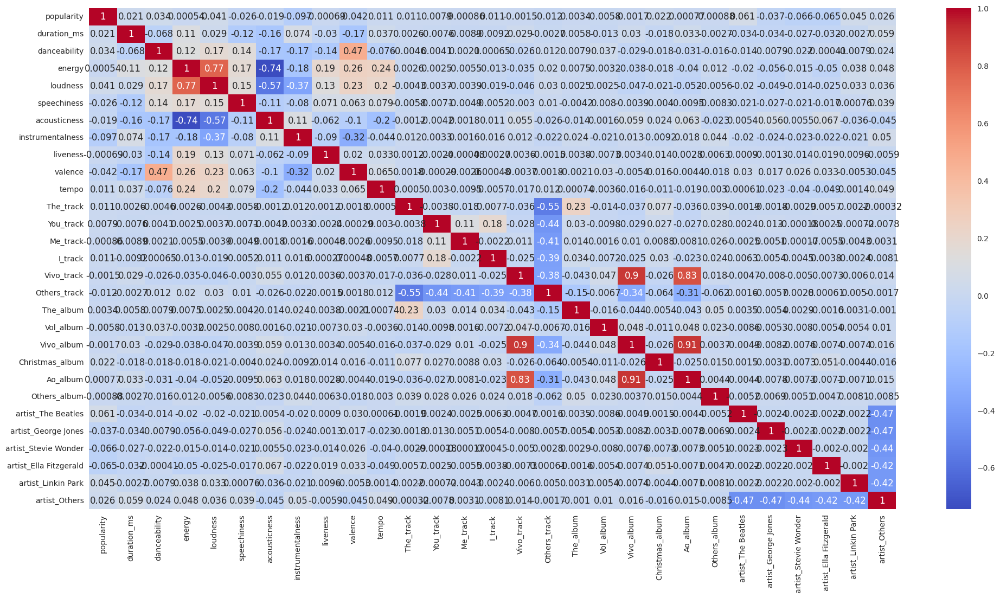

In [ ]:
num_cols = df_t.select_dtypes(include=['int64', 'float64'])
corr_data = num_cols.corr()

fig, ax = plt.subplots(figsize=(24, 12))
sns.heatmap(corr_data, cmap="coolwarm", annot=True)

plt.show()

### Dropping Auto-Correlated Features

In [ ]:
df_t = df_t.drop(['energy', 'Ao_album', 'Vivo_album'], axis=1)

## Visualizing the Changed Correlation Matrix

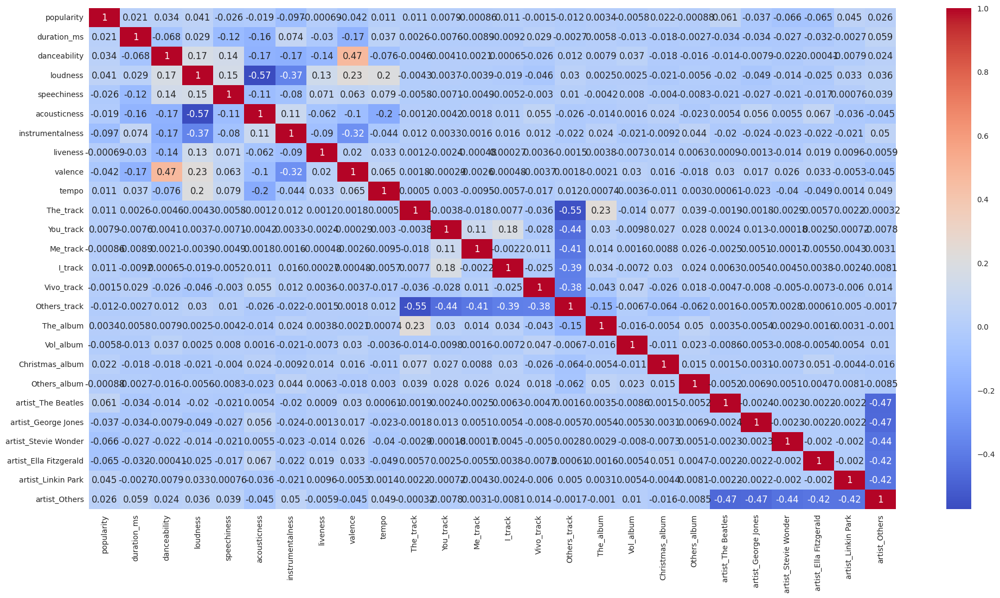

In [ ]:
num_cols = df_t.select_dtypes(include=['int64', 'float64'])
corr_data = num_cols.corr()

fig, ax = plt.subplots(figsize=(24, 12))
sns.heatmap(corr_data, cmap="coolwarm", annot=True)

plt.show()

In [ ]:
continuous_cols = []
categorical_cols = []

for col in df_t.columns:
    if df_t[col].dtype == np.float64 or df_t[col].dtype == np.int64:
        continuous_cols.append(col)
    else:
        categorical_cols.append(col)

print('Continuous columns:', continuous_cols)
print('Categorical columns:', categorical_cols)

Continuous columns: ['popularity', 'duration_ms', 'danceability', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'The_track', 'You_track', 'Me_track', 'I_track', 'Vivo_track', 'Others_track', 'The_album', 'Vol_album', 'Christmas_album', 'Others_album', 'artist_The Beatles', 'artist_George Jones', 'artist_Stevie Wonder', 'artist_Ella Fitzgerald', 'artist_Linkin Park', 'artist_Others']
Categorical columns: ['explicit', 'key', 'mode', 'time_signature', 'track_genre']


In [ ]:
track_genres = df_t.groupby("track_genre")["popularity"].mean().nlargest(20)

table = pd.DataFrame({'track_genre': track_genres.index, 'mean_popularity': track_genres.values.astype('int')}).set_index('track_genre')

print(table)

                   mean_popularity
track_genre                       
pop-film                        59
k-pop                           57
chill                           53
sad                             52
indian                          49
grunge                          49
anime                           48
pop                             48
emo                             48
sertanejo                       47
progressive-house               46
piano                           45
mandopop                        45
deep-house                      44
brazil                          44
electronic                      44
ambient                         44
pagode                          44
british                         43
metal                           43


**Interpretations**
- **`pop-film`:** The average popularity of songs in the "pop-film" genre is 59. This indicates that, on average, songs in this genre tend to have relatively high popularity scores.
  
- **`k-pop`:** Similarly, the mean popularity score for "k-pop" songs is 57, indicating that this genre also has relatively popular songs.

- **Genres with Lower Mean Popularity:**
  - **`british`:** The average popularity of songs in this genre is 43, which is relatively lower compared to genres like `pop-film` or `k-pop`.
  - **`metal`:** The average popularity of songs in the "metal" genre is also 43.

**Use Cases of This Data**
1. **Genre Popularity Analysis:** This can help in identifying which genres are more popular on average. For example, you might infer that genres like `pop-film` and `k-pop` are more likely to have popular songs than genres like `metal` or `british`.

2. **Content Recommendation:** If you're building a recommendation system, you might prioritize recommending songs from genres with higher average popularity if the goal is to recommend popular tracks.

3. **Business Insights:** Music producers or marketers could use this information to identify which genres are currently trending in terms of popularity and adjust their strategies accordingly.

4. **Comparative Analysis:** You could compare different genres in terms of their popularity and see trends, perhaps identifying niche genres that are gaining in popularity or others that are declining.

In summary, this table provides insight into how different music genres perform in terms of song popularity, allowing for trend analysis, content recommendations, and business decision-making based on genre performance.

In [ ]:
num_rows = df_t.shape[0]
num_col = df_t.shape[1]
total_samples = num_rows * num_col

print('Number of rows:', num_rows)
print('Number of columns:', num_col)
print('Total number of samples:', total_samples)

Number of rows: 112114
Number of columns: 31
Total number of samples: 3475534


# Clustering

In [ ]:
track_cols = [col for col in df_t.columns if col.endswith('_track')]
album_cols = [col for col in df_t.columns if col.endswith('_album')]

for col in track_cols + album_cols:
    df_t[col] = df_t[col].astype(bool)

In [ ]:
artist_cols = [col for col in df_t.columns if col.startswith('artist_')]

for col in artist_cols:
  df_t[col] = df_t[col].astype(bool)

## Scaling the Numeric Features

In [ ]:
num_cols = df_t.select_dtypes(include=['int64', 'float64']).columns
df_scaled = df_t[num_cols].copy()

scaler = StandardScaler()
df_scaled[num_cols] = scaler.fit_transform(df_scaled)

## Plotting the Within-Cluster Sum of Squares (WCSS)

In [ ]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import SilhouetteVisualizer

### Elbow Curve

In [ ]:
wcss = []

for k in range(2, 21):
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(df_scaled)
    wcss.append(kmeans.inertia_)

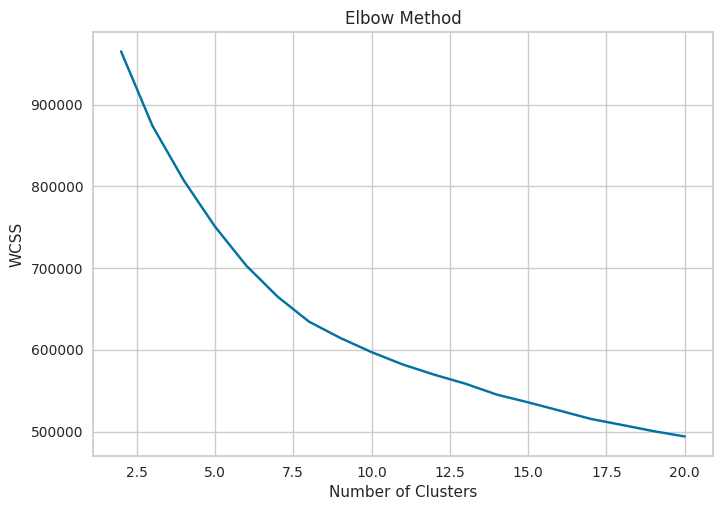

In [ ]:
plt.plot(range(2, 21), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

This is an **Elbow Method plot** used for determining the optimal number of clusters for a K-Means clustering algorithm. The plot shows the **within-cluster sum of squares (WCSS)** on the Y-axis and the **number of clusters (K)** on the X-axis.

**Key Components**

- **WCSS (Within-Cluster Sum of Squares):**
  - WCSS measures the total squared distance between each point and the centroid of the cluster to which it belongs. It is a measure of how tightly grouped the clusters are.
  - As the number of clusters increases, WCSS decreases because the data points are grouped into smaller, tighter clusters.

- **Number of Clusters (K):**
  - The X-axis represents the number of clusters (`K`) being tested, ranging from 2 to 20 in this case.

**Elbow Method**
- The goal of the elbow method is to find the "elbow point" where adding more clusters does not significantly reduce WCSS. This point indicates the optimal number of clusters because it balances model complexity and accuracy.

**Interpretation of the Plot**
- **Steep Decline (Left Side of the Plot):** Initially, as the number of clusters increases, WCSS decreases rapidly. This is because the model is grouping the data points into more clusters, which reduces the variance within each cluster.
- **Elbow Point:** The "elbow" is the point where the rate of decrease slows down significantly. After this point, adding more clusters yields diminishing returns (i.e., WCSS decreases only slightly). In this plot, the elbow seems to be around **K = 8** or **K = 9** clusters. This indicates that 8 or 9 clusters may be the optimal number of clusters for this dataset.
- **After the Elbow (Right Side of the Plot):** After the elbow point, adding more clusters only marginally decreases WCSS, indicating that the additional clusters are not contributing much to reducing the within-cluster variance.



The optimal number of clusters is usually chosen at the elbow point. In this plot, it appears that **8 or 9 clusters** would be a reasonable choice for K-Means clustering, as this is where the WCSS begins to level off and adding more clusters doesn’t significantly improve the clustering outcome.

This method helps to avoid overfitting (by selecting too many clusters) while ensuring that the clusters are sufficiently well-defined.

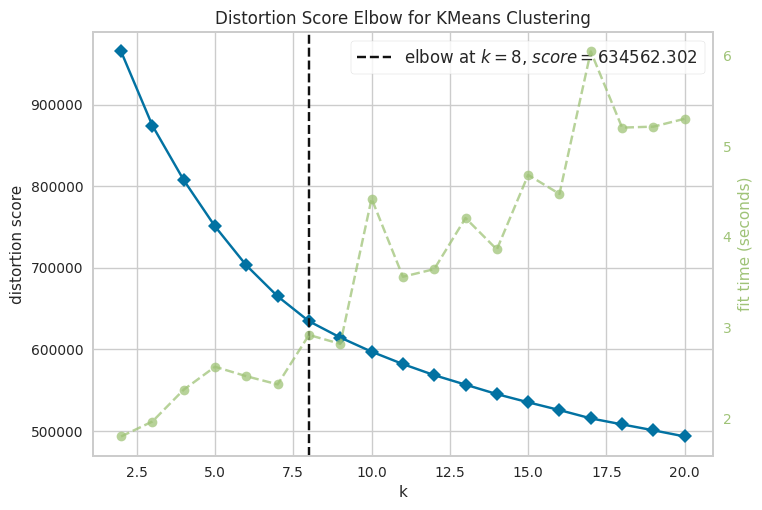

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
km_model = KMeans()
visualizer = KElbowVisualizer(km_model, k=(2, 21))
visualizer.fit(df_scaled)
visualizer.show()

This plot shows the **Elbow Method** for K-Means clustering using the **distortion score** as a metric to assess the optimal number of clusters (`k`). The plot also includes the **fit time** (in seconds) for each value of `k`, represented by a second line.

**Key Components**

1. **X-Axis (`k`):**
   - Represents the number of clusters (K) tested, ranging from 2 to 20.

2. **Y-Axis (Left - Distortion Score):**
   - This measures the **distortion score** (or **within-cluster sum of squares, WCSS**). The distortion score reflects the compactness of the clusters. A lower distortion score means that the clusters are tighter and the points are closer to the centroids.

3. **Y-Axis (Right - Fit Time):**
   - This represents the **fit time** in seconds, which is the time taken by the K-Means algorithm to converge for each value of `k`. The time increases as the number of clusters increases because more computation is required.

**Key Lines**
1. **Blue Line (Distortion Score):**
   - This line represents the distortion score for each value of `k`. As `k` increases, the distortion score decreases, indicating that the clusters are becoming more compact.

2. **Green Dotted Line (Fit Time):**
   - This line represents the time it took to fit the model for each value of `k`. It increases as `k` increases, indicating that more clusters take longer to compute.

**Elbow Point**
- **Elbow at `k=8`:** The plot highlights the "elbow" at **`k=8`**, where the distortion score flattens out after significant improvements in the earlier values of `k`. This is indicated by the vertical dashed line. The corresponding distortion score is **634561.879**.
- After this point (`k=8`), adding more clusters does not significantly reduce the distortion score, so `k=8` is considered the optimal number of clusters.

**Insights from the Plot**
1. **Elbow Method:** The elbow is at **`k=8`**, suggesting that 8 clusters strike a good balance between reducing the distortion score and keeping the model simple. Beyond 8 clusters, the improvement in compactness diminishes.
2. **Fit Time:** The fit time starts to increase rapidly as the number of clusters increases, particularly after `k=10`. This indicates that while adding more clusters improves the model slightly in terms of distortion score, it also substantially increases the computational time.

**Conclusion**
- The **optimal number of clusters** is suggested to be **8** based on the elbow point.
- The plot also shows that while fit time increases with more clusters, `k=8` offers a reasonable trade-off between model complexity and performance without being too computationally expensive.

This plot combines both the performance metric (distortion score) and computational cost (fit time) to help determine the most appropriate number of clusters for the K-Means model.

## K-Means 7

In [ ]:
kmeans_7 = KMeans(n_clusters = 7)
kmeans_7.fit(df_scaled)

KMeans(n_clusters=7)

In [ ]:
silhouette_avg_7 = silhouette_score(df_scaled, kmeans_7.labels_)
print("Average Silhouette Score:", silhouette_avg_7)

Average Silhouette Score: 0.13075081706781835


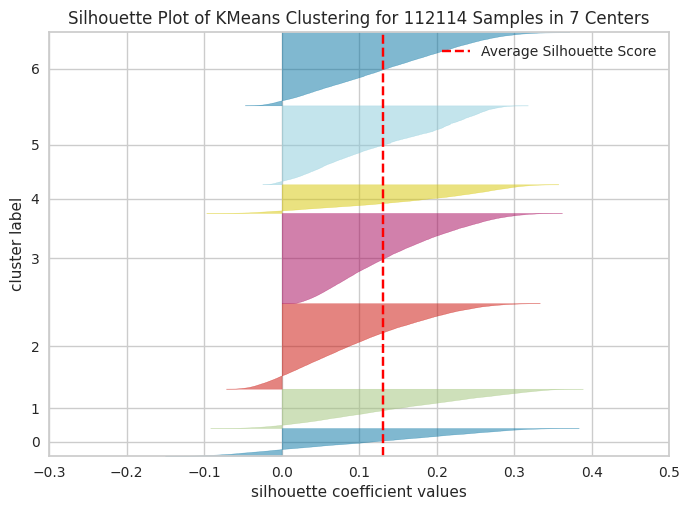

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 112114 Samples in 7 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
visualizer = SilhouetteVisualizer(kmeans_7, colors='yellowbrick')
visualizer.fit(df_scaled)
visualizer.show()

This is a **Silhouette Plot** for K-Means clustering, specifically showing the silhouette coefficients for clusters formed by the algorithm. The silhouette plot helps in evaluating the quality of the clustering by measuring how well each point lies within its cluster compared to other clusters.

**Key Components of the Plot**

1. **X-Axis (Silhouette Coefficient Values):**
   - This axis shows the silhouette coefficient for each sample. The silhouette coefficient ranges between **-1 and 1**.
     - **+1:** The sample is far away from neighboring clusters and well within its own cluster.
     - **0:** The sample is on or very close to the decision boundary between two clusters.
     - **-1:** The sample might be assigned to the wrong cluster, as it is closer to a neighboring cluster than to the cluster it was assigned to.

2. **Y-Axis (Cluster Labels):**
   - This axis represents the different clusters formed by K-Means. Each cluster is represented as a separate horizontal region in the plot.

3. **Silhouette Coefficients per Cluster:**
   - Each region corresponds to a different cluster, and the thickness of the region indicates the number of data points in that cluster. Wider regions imply more data points with higher silhouette scores, meaning that those points are well-clustered.
   - The silhouette coefficient distribution within each cluster is shown as a density distribution. Positive values indicate well-clustered data, while negative values indicate points that might be misclassified.

4. **Red Dashed Line (Average Silhouette Score):**
   - The red vertical dashed line represents the **average silhouette score** across all clusters.
   - This score is a summary of the clustering quality. A higher average score indicates better-defined clusters. Values close to 1 are ideal, while values near 0 or negative suggest poor clustering.

**Interpretation**

- **Cluster Separation and Compactness:**
  - The silhouette coefficient is a balance between cohesion (how close points are to their own cluster) and separation (how far they are from other clusters).
  - Clusters with wider, positively skewed silhouette coefficients indicate well-defined clusters. For example, clusters labeled **5**, **3**, and **1** appear to have generally positive silhouette coefficients, meaning the points within these clusters are well separated from other clusters.
  
- **Clusters with Low or Negative Silhouette Scores:**
  - Some regions, such as parts of clusters **4** and **6**, have silhouette coefficients that dip below 0. This suggests that there are points within these clusters that might be closer to neighboring clusters, indicating potential misclassifications.

- **Average Silhouette Score:**
  - The average silhouette score, marked by the red dashed line, gives an overall assessment of the clustering. The score appears to be positive and centered around **0.1**, which suggests that while the clustering is not perfect, it is moderately successful.

**Insights**
- **Cluster Quality:** Clusters with mostly positive silhouette scores (to the right of 0) are generally well-defined. Clusters with negative scores have some points that are likely misclassified or poorly separated from neighboring clusters.
- **Average Score Analysis:** The average silhouette score is positive but relatively low, suggesting that while the clusters are somewhat distinct, there is room for improvement, possibly by refining the clustering parameters or preprocessing the data further.

**Conclusion**
This silhouette plot indicates that the K-Means algorithm has formed moderately well-defined clusters, with some variation in the quality of clustering between clusters. Clusters with a higher proportion of positive silhouette coefficients are better separated from other clusters, while those with more negative values may need further refinement to improve cluster separability.

## K-Means 8

In [ ]:
kmeans_8 = KMeans(n_clusters = 8)
kmeans_8.fit(df_scaled)

KMeans()

In [ ]:
silhouette_avg_8 = silhouette_score(df_scaled, kmeans_8.labels_)
print("Average Silhouette Score:", silhouette_avg_8)

Average Silhouette Score: 0.12769738917569654


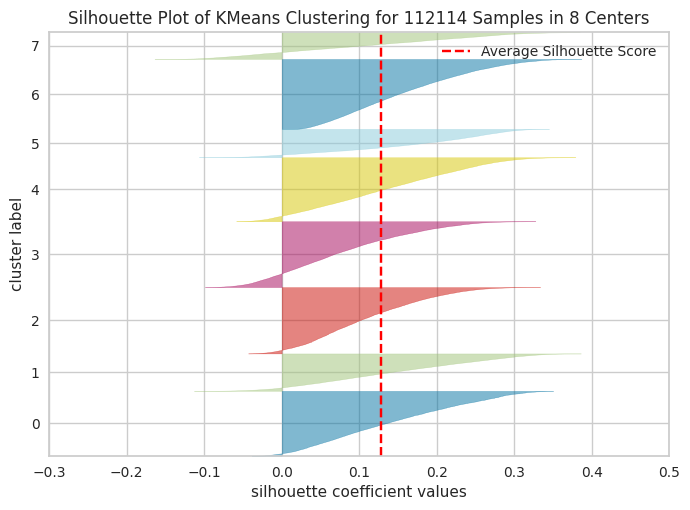

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 112114 Samples in 8 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
visualizer = SilhouetteVisualizer(kmeans_8, colors='yellowbrick')
visualizer.fit(df_scaled)
visualizer.show()

This is another **Silhouette Plot** for K-Means clustering, similar to the previous one, but this time for **8 clusters** (centers). It shows the silhouette coefficients for each data point across the 8 clusters formed by the K-Means algorithm.

***Key Components of the Plot***

1. **X-Axis (Silhouette Coefficient Values):**
   - This shows the silhouette coefficient for each sample, which ranges from **-1 to 1**.
     - **+1:** Perfectly clustered; the point is well within its cluster and far from neighboring clusters.
     - **0:** The point lies on the boundary between clusters.
     - **-1:** The point is potentially misclassified as it is closer to a neighboring cluster than its own.

2. **Y-Axis (Cluster Labels):**
   - This represents the different clusters (numbered from 0 to 7 in this case). Each cluster is visualized as a separate horizontal region in the plot.

3. **Silhouette Coefficients per Cluster:**
   - The width of each region represents the distribution of silhouette coefficients for the points in that cluster. Thicker regions indicate that more points have higher silhouette coefficients, meaning better-defined clusters.
   - The plot also shows the spread of silhouette coefficients within each cluster, with some clusters having points with negative values, indicating possible misclassification.

4. **Red Dashed Line (Average Silhouette Score):**
   - The red vertical dashed line represents the **average silhouette score** across all clusters.
   - This score is a measure of the overall clustering quality. A higher score (closer to 1) indicates better clustering, while a lower score suggests poorer clustering.

***Interpretation***

- **Cluster Compactness and Separation:**
  - **Cluster 7 and Cluster 1** show fairly positive silhouette coefficients, with most points well-clustered and separated from other clusters. These clusters are likely well-defined.
  - **Clusters 0, 2, and 4** have more variation in silhouette coefficients. Some points within these clusters have negative silhouette scores, indicating that those points might be closer to other clusters than to their assigned cluster. This suggests that these clusters are less well-defined and might have overlapping boundaries with neighboring clusters.

- **Negative Silhouette Values:**
  - Some clusters (e.g., Cluster 2 and Cluster 4) have points with negative silhouette values, which indicates that these points are likely misclassified or poorly separated from other clusters.

- **Average Silhouette Score:**
  - The average silhouette score (marked by the red dashed line) appears to be slightly above **0.1**, which is relatively low. This indicates that while the clusters are somewhat distinct, the clustering quality is not particularly strong, and there might be significant overlap between some of the clusters.

***Insights***

- **Cluster Quality:**
  - Clusters with a majority of positive silhouette scores (to the right of 0) are better defined. Clusters with more negative scores might need improvement or a rethinking of the clustering strategy.
  
- **Average Score Analysis:**
  - The relatively low average silhouette score suggests that the K-Means algorithm has formed clusters that are not highly distinct from one another. There might be potential improvements by adjusting parameters or even exploring alternative clustering methods.

***Conclusion***

The silhouette plot for 8 clusters indicates moderate clustering quality. While some clusters (e.g., Clusters 7 and 1) are well-defined, others (e.g., Clusters 2 and 4) show signs of overlap or misclassification. The average silhouette score reflects this, as it is relatively low, suggesting room for improvement in the clustering.

## K-Means 6

In [ ]:
kmeans_6 = KMeans(n_clusters = 6)
kmeans_6.fit(df_scaled)

KMeans(n_clusters=6)

In [ ]:
silhouette_avg_6 = silhouette_score(df_scaled, kmeans_6.labels_)
print("Average Silhouette Score:", silhouette_avg_6)

Average Silhouette Score: 0.1381451310514659


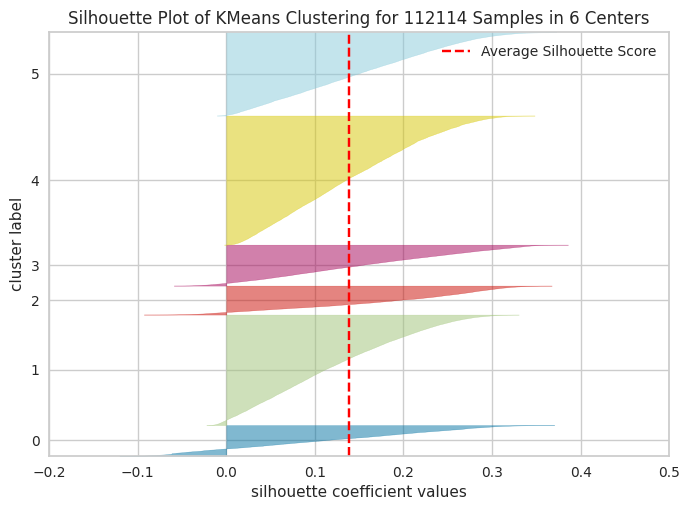

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 112114 Samples in 6 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
visualizer = SilhouetteVisualizer(kmeans_6, colors='yellowbrick')
visualizer.fit(df_scaled)
visualizer.show()

This is a **Silhouette Plot** for K-Means clustering with **6 clusters** (centers). It visualizes the distribution of silhouette coefficients for each data point across the 6 clusters formed by the K-Means algorithm.

***Key Components***

1. **X-Axis (Silhouette Coefficient Values):**
   - The silhouette coefficient ranges from **-1 to 1**.
     - **+1:** Indicates that the point is well within its own cluster and far from neighboring clusters (desirable).
     - **0:** The point is near the boundary between clusters (moderately desirable).
     - **-1:** The point might be closer to a neighboring cluster than its own, suggesting possible misclassification (undesirable).

2. **Y-Axis (Cluster Labels):**
   - This represents the 6 different clusters (labeled 0 to 5). Each horizontal bar represents the distribution of silhouette coefficients for points within that cluster.

3. **Silhouette Coefficients per Cluster:**
   - The width of each bar represents the density of points with corresponding silhouette scores. Wider sections show where most of the points fall in terms of clustering quality.
   - Each cluster is shown as a separate horizontal distribution, and the shape of the bars indicates how tightly clustered the points are.

4. **Red Dashed Line (Average Silhouette Score):**
   - The vertical red dashed line represents the **average silhouette score** for the entire dataset across all clusters.
   - The average silhouette score is a key metric for evaluating the clustering quality. In this case, it appears to be slightly above **0.1**, indicating that the overall clustering quality is not particularly high.

***Interpretation***

- **Positive Silhouette Coefficients:**
  - Clusters with positive silhouette coefficients (points to the right of the red dashed line) are well-defined. For example, clusters **0**, **1**, and **5** have a higher proportion of positive silhouette scores, meaning that most points in these clusters are well-separated from other clusters.

- **Clusters with Negative or Low Silhouette Scores:**
  - Clusters **2** and **4** have a portion of points with negative silhouette scores. This suggests that some points within these clusters are likely misclassified or are closer to other clusters than their assigned cluster.
  - Clusters with a large proportion of points near 0, such as cluster **3**, indicate that the points are near the boundary of two clusters and are not distinctly classified.

- **Average Silhouette Score:**
  - The average silhouette score is slightly positive (just above 0.1). This suggests that, on average, the clustering is moderately successful, but there may be significant overlap between some clusters or points that are poorly classified.

***Insights***

- **Cluster Quality:**
  - Clusters with mostly positive silhouette scores (e.g., clusters **0**, **1**, and **5**) are better defined, meaning that points within these clusters are more cohesive and well-separated from other clusters.
  - Clusters with more negative or close-to-zero silhouette scores (e.g., clusters **2**, **3**, and **4**) indicate that some points might be misclassified or belong to overlapping regions between clusters.

- **Improvement Potential:**
  - Given the relatively low average silhouette score (slightly above 0.1), there might be potential for improvement in the clustering. This could involve refining the number of clusters, using a different distance metric, or applying a different clustering algorithm.

***Conclusion***

This silhouette plot shows that the clustering into 6 clusters is moderately successful, with some clusters being well-defined and others showing signs of overlap or misclassification. The overall clustering quality is not very high, as indicated by the average silhouette score slightly above 0.1. Further adjustments to the clustering process could help improve the separation and compactness of the clusters.

## K-Means 5

In [ ]:
kmeans_5 = KMeans(n_clusters=5)
kmeans_5.fit(df_scaled)

KMeans(n_clusters=5)

In [ ]:
silhouette_avg_5 = silhouette_score(df_scaled, kmeans_5.labels_)
print("Average Silhouette Score:", silhouette_avg_5)

Average Silhouette Score: 0.12546693441890328


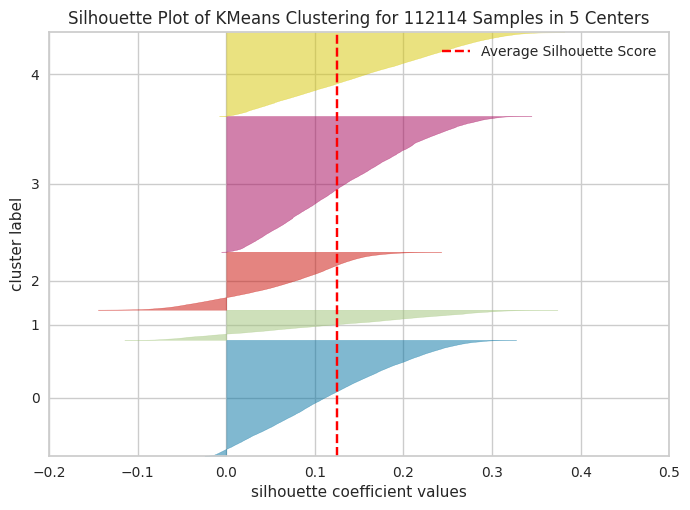

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 112114 Samples in 5 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
visualizer = SilhouetteVisualizer(kmeans_5, colors='yellowbrick')
visualizer.fit(df_scaled)
visualizer.show()

This is a **Silhouette Plot** for K-Means clustering with **5 clusters** (centers). It visualizes the distribution of silhouette coefficients for the points in each cluster, providing insight into the quality of the clustering.

***Key Components of the Plot***

1. **X-Axis (Silhouette Coefficient Values):**
   - The silhouette coefficient ranges from **-1 to 1**.
     - **+1:** Indicates that the point is well-clustered and far from neighboring clusters.
     - **0:** Indicates that the point is on or near the boundary between two clusters.
     - **-1:** Indicates that the point may be misclassified and closer to another cluster than the one it was assigned to.

2. **Y-Axis (Cluster Labels):**
   - The Y-axis represents the 5 clusters, labeled from 0 to 4. Each cluster has its own horizontal bar, showing the distribution of silhouette coefficients for the points within that cluster.

3. **Silhouette Coefficients per Cluster:**
   - The width of the bars represents the density of points with corresponding silhouette scores. Thicker bars indicate that more points in the cluster have higher silhouette coefficients, implying that the cluster is better defined.
   - The shape of the bar indicates the spread of the silhouette scores within the cluster, with some clusters having points with negative values, suggesting potential misclassification.

4. **Red Dashed Line (Average Silhouette Score):**
   - The red vertical dashed line represents the **average silhouette score** across all clusters.
   - This score gives an overall measure of clustering quality. The average score appears to be around **0.1**, which indicates that the clustering quality is moderate but not particularly strong.

***Interpretation***

- **Positive Silhouette Coefficients:**
  - Clusters with mostly positive silhouette coefficients (points to the right of the red dashed line) are better clustered. For example, **cluster 4** has the highest concentration of positive silhouette scores, indicating that the points in this cluster are well-separated from other clusters.

- **Clusters with Negative or Low Silhouette Scores:**
  - Some clusters, such as **cluster 0** and **cluster 2**, have a portion of points with negative silhouette scores, indicating that some points within these clusters may be misclassified or closer to neighboring clusters than to their own cluster.

- **Average Silhouette Score:**
  - The average silhouette score (around 0.1) is relatively low, suggesting that the clusters may not be very well-separated overall, and there may be significant overlap between some of the clusters.

***Insights***

- **Cluster Quality:**
  - **Cluster 4** appears to be well-defined, with most points having positive silhouette scores.
  - On the other hand, **cluster 0** and **cluster 2** show signs of poor clustering, as they contain a number of points with negative silhouette scores, indicating potential misclassification.

- **Improvement Potential:**
  - Given the low average silhouette score, the overall clustering may benefit from improvements, such as refining the number of clusters, adjusting the distance metric, or trying a different clustering algorithm.

***Conclusion***
This silhouette plot shows that the clustering into 5 clusters is moderately successful, with some clusters being well-defined and others showing signs of overlap or misclassification. The relatively low average silhouette score suggests that the clustering is not highly distinct, indicating potential for further optimization.

## Comparing the Average Silhouette Scores

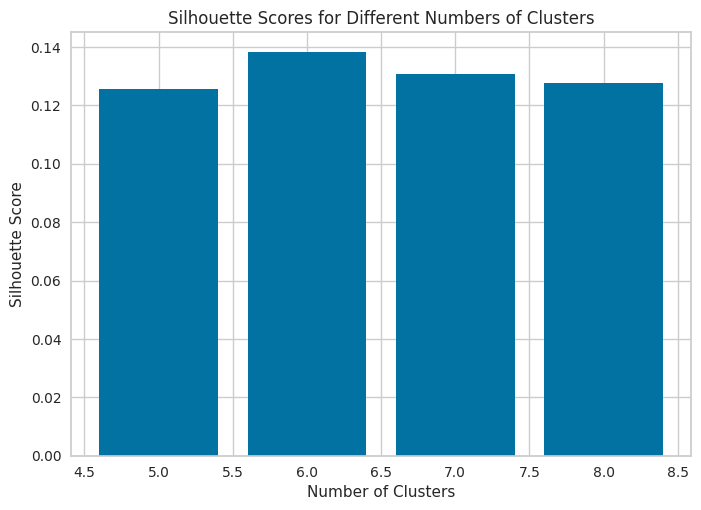

In [ ]:
silhouette_scores = [silhouette_avg_5, silhouette_avg_6, silhouette_avg_7, silhouette_avg_8]

n_clusters = [5, 6, 7, 8]

plt.bar(n_clusters, silhouette_scores)

plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Scores for Different Numbers of Clusters')

plt.show()

## Best Cluster = K-Means 6

### Labelling the Rows with Corresponding `cluster_id`

In [ ]:
kmeans = KMeans(n_clusters = 6)
kmeans.fit(df_scaled)

KMeans(n_clusters=6)

In [ ]:
df_scaled['cluster_id'] = kmeans.labels_

In [ ]:
df_scaled.head()

,popularity,duration_ms,danceability,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,cluster_id
0,1.771680,0.198961,0.622117,0.120861,0.810871,-0.840241,-0.502845,1.286931,0.921814,-1.173045,5
1,0.967674,-0.941221,-0.864518,-1.687910,-0.032012,1.865975,-0.502830,-0.693128,-0.808492,-1.525746,2
2,1.057008,-0.042282,-0.759989,-0.556162,-0.292333,-0.300697,-0.502848,-0.463389,-1.376248,-1.564878,2
3,1.682346,-0.157059,-1.758823,-1.835718,-0.537489,1.808319,-0.502619,-0.268028,-1.287416,2.000282,2
4,2.173682,-0.197865,0.285301,-0.545779,-0.331507,0.485253,-0.502848,-0.982943,-1.194721,-0.089643,2


### Centroids

In [ ]:
centroids = kmeans.cluster_centers_

In [ ]:
centroids

array([[-0.19847031, -0.52452931, -1.13450382, -1.81984822, -0.32463987,
         1.54294266,  2.21843088, -0.25565097, -1.01698305, -0.55498383],
       [ 0.2639208 ,  0.19771826, -0.55294404,  0.58409988, -0.11467264,
        -0.65935948, -0.38325193,  0.42034437, -0.38633702,  0.46002015],
       [ 0.04108971, -0.06797336, -0.29892965, -0.66300029, -0.40892843,
         1.2009299 , -0.43427293, -0.06429318, -0.31912818, -0.36380728],
       [ 0.02950314, -0.39817205,  0.60994812,  0.25141924,  2.95973854,
        -0.12360974, -0.38206308,  0.10124306,  0.26451469,  0.08373279],
       [-0.24956655,  0.84127409,  0.17165331, -0.16881703, -0.16817691,
        -0.68268313,  1.98103288, -0.22353696, -0.53583808,  0.18333827],
       [-0.13960812, -0.18737093,  0.73782966,  0.32673494, -0.19286059,
        -0.30468154, -0.42981614, -0.22002259,  0.88527699, -0.11878097]])

### Visualizing the Distributions of the Clusters

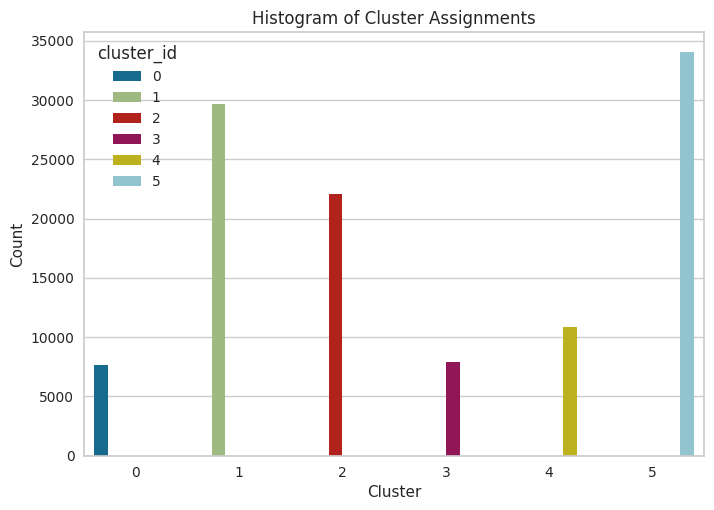

In [ ]:
sns.countplot(data=df_scaled, x='cluster_id', hue='cluster_id')
plt.title('Histogram of Cluster Assignments')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.show()

This is a **Histogram of Cluster Assignments** from a clustering algorithm, likely K-Means, which shows the distribution of data points across different clusters. The plot visualizes how many points have been assigned to each cluster.

***Key Components of the Plot***

1. **X-Axis (Cluster):**
   - The X-axis represents the different clusters, labeled **0** through **5**. These are the cluster IDs assigned by the clustering algorithm, corresponding to the 6 different clusters.

2. **Y-Axis (Count):**
   - The Y-axis represents the **number of data points** (or samples) assigned to each cluster. The height of each bar shows how many points were assigned to that particular cluster.

3. **Bar Heights (Cluster Sizes):**
   - Each bar represents a specific cluster and its height shows the count of points in that cluster.
   - For example:
     - Cluster **0** has approximately 17,000 points.
     - Cluster **1** has the largest number of points, close to 28,000.
     - Cluster **5** also has a large number of points, with over 27,000.
     - Cluster **2** and **3** have fewer points compared to the others.

4. **Color Coding:**
   - Each cluster is color-coded, with different shades representing different clusters (lighter for smaller clusters, darker for larger clusters).

***Interpretation***

- **Cluster Sizes:**
  - **Cluster 1** and **Cluster 5** are the largest clusters, indicating that the algorithm assigned the majority of data points to these clusters.
  - **Clusters 2 and 3** are relatively small in size, indicating that fewer points were assigned to these clusters.

- **Cluster Distribution:**
  - The clustering algorithm does not assign points evenly across clusters. Instead, some clusters (such as **1** and **5**) have absorbed a significantly larger share of the data points, while others (such as **2** and **3**) have far fewer points.
  
- **Imbalanced Clusters:**
  - The unequal heights of the bars indicate that the clusters are imbalanced, with some clusters being more densely populated than others. This could be due to the nature of the data, where certain groups are naturally larger, or it could suggest that the clustering algorithm is struggling to find more evenly-sized clusters.

***Conclusion***

This histogram reveals how the data points are distributed across the clusters in the K-Means (or another clustering algorithm) solution. The distribution is imbalanced, with **Cluster 1** and **Cluster 5** containing the largest number of points, while **Cluster 2** and **Cluster 3** are much smaller. Understanding the cluster sizes is important for analyzing the clustering performance and identifying whether the clustering algorithm is appropriately grouping similar points together or whether some clusters are too large and others too small.

In [ ]:
trace = go.Scatter3d(
    x=df_t['duration_ms'],
    y=df_t['loudness'],
    z=df_t['tempo'],
    mode='markers',
    marker=dict(
        size=12,
        color=df_scaled['cluster_id'],
        colorscale='Viridis',
        opacity=0.8)
)
layout = go.Layout(scene=dict(
        xaxis_title='Duration_ms',
        yaxis_title='Loudness',
        zaxis_title='Tempo'),
        title='3D Scatter Plot of Clusters',
        width=800,
        height=600,
)

fig = go.Figure(data=[trace], layout=layout)

fig.show()

## Creating the Final Dataset

In [ ]:
df_scaled.head()

,popularity,duration_ms,danceability,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,cluster_id
0,1.771680,0.198961,0.622117,0.120861,0.810871,-0.840241,-0.502845,1.286931,0.921814,-1.173045,5
1,0.967674,-0.941221,-0.864518,-1.687910,-0.032012,1.865975,-0.502830,-0.693128,-0.808492,-1.525746,2
2,1.057008,-0.042282,-0.759989,-0.556162,-0.292333,-0.300697,-0.502848,-0.463389,-1.376248,-1.564878,2
3,1.682346,-0.157059,-1.758823,-1.835718,-0.537489,1.808319,-0.502619,-0.268028,-1.287416,2.000282,2
4,2.173682,-0.197865,0.285301,-0.545779,-0.331507,0.485253,-0.502848,-0.982943,-1.194721,-0.089643,2


In [ ]:
df_scaled.shape

(112114, 11)

In [ ]:
cat_cols = df_t.select_dtypes(include=['object', 'bool', 'category']).columns
df_t_cat = df_t[cat_cols].copy()

In [ ]:
df_t_cat.head()

,explicit,key,mode,time_signature,track_genre,The_track,You_track,Me_track,I_track,Vivo_track,...,The_album,Vol_album,Christmas_album,Others_album,artist_The Beatles,artist_George Jones,artist_Stevie Wonder,artist_Ella Fitzgerald,artist_Linkin Park,artist_Others
0,False,C-sharp_D-flat,minor,4/4,acoustic,False,False,False,False,False,...,False,False,False,True,False,False,False,False,False,True
1,False,C-sharp_D-flat,major,4/4,acoustic,False,False,False,False,False,...,False,False,False,True,False,False,False,False,False,True
2,False,C,major,4/4,acoustic,False,False,False,False,False,...,False,False,False,True,False,False,False,False,False,True
3,False,C,major,3/4,acoustic,False,False,False,False,False,...,False,False,False,True,False,False,False,False,False,True
4,False,D,major,4/4,acoustic,False,False,False,False,False,...,False,False,False,True,False,False,False,False,False,True


In [ ]:
df_final = pd.concat([df_scaled, df_t_cat], axis=1)
df_final.head()

,popularity,duration_ms,danceability,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,...,The_album,Vol_album,Christmas_album,Others_album,artist_The Beatles,artist_George Jones,artist_Stevie Wonder,artist_Ella Fitzgerald,artist_Linkin Park,artist_Others
0,1.771680,0.198961,0.622117,0.120861,0.810871,-0.840241,-0.502845,1.286931,0.921814,-1.173045,...,False,False,False,True,False,False,False,False,False,True
1,0.967674,-0.941221,-0.864518,-1.687910,-0.032012,1.865975,-0.502830,-0.693128,-0.808492,-1.525746,...,False,False,False,True,False,False,False,False,False,True
2,1.057008,-0.042282,-0.759989,-0.556162,-0.292333,-0.300697,-0.502848,-0.463389,-1.376248,-1.564878,...,False,False,False,True,False,False,False,False,False,True
3,1.682346,-0.157059,-1.758823,-1.835718,-0.537489,1.808319,-0.502619,-0.268028,-1.287416,2.000282,...,False,False,False,True,False,False,False,False,False,True
4,2.173682,-0.197865,0.285301,-0.545779,-0.331507,0.485253,-0.502848,-0.982943,-1.194721,-0.089643,...,False,False,False,True,False,False,False,False,False,True


In [ ]:
df_final.shape

(112114, 32)

In [ ]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 112114 entries, 0 to 113999
Data columns (total 32 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   popularity              112114 non-null  float64
 1   duration_ms             112114 non-null  float64
 2   danceability            112114 non-null  float64
 3   loudness                112114 non-null  float64
 4   speechiness             112114 non-null  float64
 5   acousticness            112114 non-null  float64
 6   instrumentalness        112114 non-null  float64
 7   liveness                112114 non-null  float64
 8   valence                 112114 non-null  float64
 9   tempo                   112114 non-null  float64
 10  cluster_id              112114 non-null  int32  
 11  explicit                112114 non-null  bool   
 12  key                     112114 non-null  object 
 13  mode                    112114 non-null  object 
 14  time_signature          1

In [ ]:
df_final_1 = df_final.drop(columns=['cluster_id'], axis=1)

In [ ]:
df_final_1.shape

(112114, 31)

In [ ]:
df_final_1.head()

,popularity,duration_ms,danceability,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,...,The_album,Vol_album,Christmas_album,Others_album,artist_The Beatles,artist_George Jones,artist_Stevie Wonder,artist_Ella Fitzgerald,artist_Linkin Park,artist_Others
0,1.771680,0.198961,0.622117,0.120861,0.810871,-0.840241,-0.502845,1.286931,0.921814,-1.173045,...,False,False,False,True,False,False,False,False,False,True
1,0.967674,-0.941221,-0.864518,-1.687910,-0.032012,1.865975,-0.502830,-0.693128,-0.808492,-1.525746,...,False,False,False,True,False,False,False,False,False,True
2,1.057008,-0.042282,-0.759989,-0.556162,-0.292333,-0.300697,-0.502848,-0.463389,-1.376248,-1.564878,...,False,False,False,True,False,False,False,False,False,True
3,1.682346,-0.157059,-1.758823,-1.835718,-0.537489,1.808319,-0.502619,-0.268028,-1.287416,2.000282,...,False,False,False,True,False,False,False,False,False,True
4,2.173682,-0.197865,0.285301,-0.545779,-0.331507,0.485253,-0.502848,-0.982943,-1.194721,-0.089643,...,False,False,False,True,False,False,False,False,False,True


## DBSCAN Clustering

In [ ]:
from sklearn.metrics import pairwise_distances

### Creating Sample for Clustering

In [ ]:
import random
random.seed(0)

sample_size = 5000
random_indices = random.sample(range(df_final_1.shape[0]), sample_size)
sampled_df_1 = df_final_1.iloc[random_indices]

print(sampled_df_1.shape)

(5000, 31)


### Calculating Pairwise Distances

In [ ]:
dist_mat_1 = pairwise_distances(sampled_df_1.select_dtypes(include=['number']), metric='euclidean')

### Visualizing through Histogram

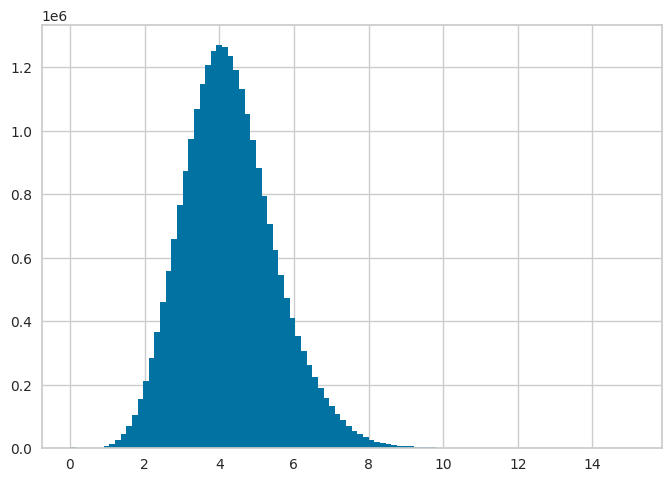

In [ ]:
h = plt.hist(dist_mat_1.flatten(),bins=100)

<Axes: ylabel='Density'>

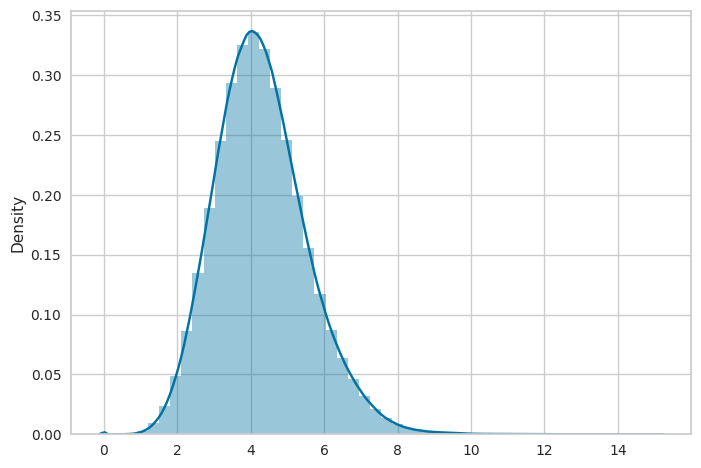

In [ ]:
sns.distplot(dist_mat_1.flatten())

In [ ]:
#from scipy.stats import gaussian_kde

#kde_1 = gaussian_kde(dist_mat_1.flatten())

In [ ]:
#input_array_1 = np.linspace(start=0, stop=0.3, num=600)

In [ ]:
#density_vals_1 = kde_1(input_array_1)

In [ ]:
#eps_1 = input_array_1[density_vals_1 == max(density_vals_1)]
#eps_1

In [ ]:
#dist_mat_1 <= eps_1

In [ ]:
#pts_1 = (dist_mat_1 <= eps_1).sum(axis=0)
#pts_1

In [ ]:
#h= plt.hist(pts_1, bins=10)

### Visualizing the k-Distance Plot

In [ ]:
from sklearn.neighbors import NearestNeighbors

In [ ]:
X = df_final_1.select_dtypes(include=['number'])

#### Compute k-nearest neighbors for a range of k values (min_samples)

In [ ]:
min_samples = 5
neighbors = NearestNeighbors(n_neighbors=min_samples)
neighbors_fit = neighbors.fit(X)
distances, indices = neighbors_fit.kneighbors(X)

#### Sort and plot the distances

In [ ]:
distances = np.sort(distances[:, min_samples-1], axis=0)

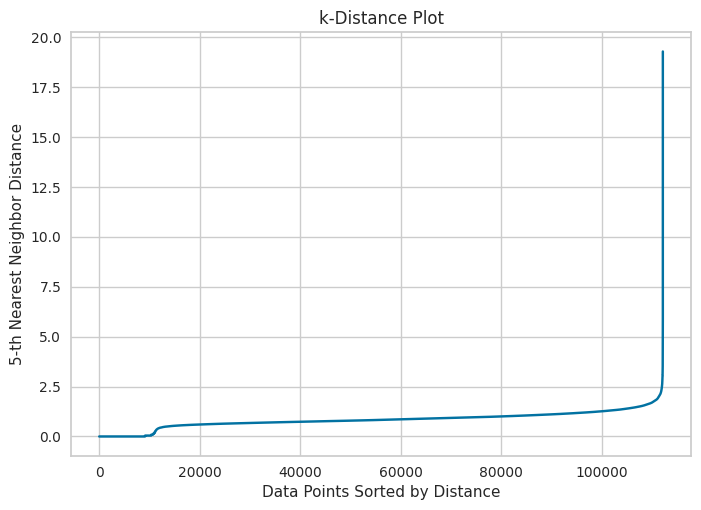

In [ ]:
plt.plot(distances)
plt.xlabel('Data Points Sorted by Distance')
plt.ylabel(f'{min_samples}-th Nearest Neighbor Distance')
plt.title('k-Distance Plot')
plt.show()

This is a **k-distance plot** used in the context of the **DBSCAN (Density-Based Spatial Clustering of Applications with Noise)** algorithm. The plot is often used to help determine the optimal value for the `eps` parameter, which defines the radius of a neighborhood around a point for density-based clustering.

***Key Components of the Plot***

1. **X-Axis (Data Points Sorted by Distance):**
   - The X-axis represents the data points, sorted by their k-distance in ascending order. The k-distance refers to the distance between a point and its k-th nearest neighbor, in this case, the **5th nearest neighbor** (based on the plot title).

2. **Y-Axis (5-th Nearest Neighbor Distance):**
   - The Y-axis shows the distance to the 5-th nearest neighbor for each point.

3. **Shape of the Curve:**
   - The curve starts off relatively flat, indicating that the distances to the 5-th nearest neighbor are small and relatively consistent for many points.
   - At some point, the curve starts to rise more steeply, representing a transition where points are farther apart from their 5-th nearest neighbors.
   - The sharp rise at the end indicates that these points are potentially **outliers** or **border points** far from dense clusters.

***Interpretation in the Context of DBSCAN***

- **Elbow Point:** The goal is to identify the "elbow" in the plot, which is the point where the curve starts to steeply rise after being relatively flat. This elbow point corresponds to the optimal value of the `eps` parameter for DBSCAN. Below this threshold, points are in dense regions (within clusters), and above this threshold, points are in sparse regions (potential outliers or noise).
  
  - In this plot, the elbow appears to be around a distance of **2 to 3** on the Y-axis. This suggests that setting `eps` in the range of **2 to 3** could be a reasonable starting point for DBSCAN.

- **Flat Region:** The flat portion of the curve indicates that within this range, points have a consistent and relatively small distance to their neighbors, meaning they are likely part of dense clusters.

- **Steep Region:** The steep portion of the curve represents points that are farther apart from their neighbors, which could either be sparsely located points or outliers. In DBSCAN, points with distances higher than `eps` would not be considered part of a core point's neighborhood and might be classified as noise.

***Practical Usage***
- To set `eps`, you should choose a value near the elbow point. In this case, a value of `eps ≈ 2.5` seems like a good candidate because it represents a threshold where the distance to the 5-th nearest neighbor starts to increase significantly, suggesting that beyond this distance, points are no longer part of dense regions.


This **k-distance plot** helps you visually determine the value of `eps` for DBSCAN by identifying the point where the curve changes slope (the elbow point). In this case, an `eps` value around **2 to 3** seems appropriate based on the location of the elbow in the plot.

## Clustering on the Final Dataset

In [ ]:
dbscan = DBSCAN(eps=0.3, min_samples=5, metric='euclidean')
df_final_1['dbscan_cluster'] = dbscan.fit_predict(df_final_1.select_dtypes(include=['number']))

In [ ]:
df_final_1['dbscan_cluster'].nunique()

1133

In [ ]:
df_final_1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 112114 entries, 0 to 113999
Data columns (total 32 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   popularity              112114 non-null  float64
 1   duration_ms             112114 non-null  float64
 2   danceability            112114 non-null  float64
 3   loudness                112114 non-null  float64
 4   speechiness             112114 non-null  float64
 5   acousticness            112114 non-null  float64
 6   instrumentalness        112114 non-null  float64
 7   liveness                112114 non-null  float64
 8   valence                 112114 non-null  float64
 9   tempo                   112114 non-null  float64
 10  explicit                112114 non-null  bool   
 11  key                     112114 non-null  object 
 12  mode                    112114 non-null  object 
 13  time_signature          112114 non-null  object 
 14  track_genre             1

In [ ]:
df_final_1.head()

,popularity,duration_ms,danceability,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,...,Vol_album,Christmas_album,Others_album,artist_The Beatles,artist_George Jones,artist_Stevie Wonder,artist_Ella Fitzgerald,artist_Linkin Park,artist_Others,dbscan_cluster
0,1.771680,0.198961,0.622117,0.120861,0.810871,-0.840241,-0.502845,1.286931,0.921814,-1.173045,...,False,False,True,False,False,False,False,False,True,-1
1,0.967674,-0.941221,-0.864518,-1.687910,-0.032012,1.865975,-0.502830,-0.693128,-0.808492,-1.525746,...,False,False,True,False,False,False,False,False,True,-1
2,1.057008,-0.042282,-0.759989,-0.556162,-0.292333,-0.300697,-0.502848,-0.463389,-1.376248,-1.564878,...,False,False,True,False,False,False,False,False,True,-1
3,1.682346,-0.157059,-1.758823,-1.835718,-0.537489,1.808319,-0.502619,-0.268028,-1.287416,2.000282,...,False,False,True,False,False,False,False,False,True,-1
4,2.173682,-0.197865,0.285301,-0.545779,-0.331507,0.485253,-0.502848,-0.982943,-1.194721,-0.089643,...,False,False,True,False,False,False,False,False,True,-1


In [ ]:
df_final_1.describe()

,popularity,duration_ms,danceability,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,dbscan_cluster
count,1.121140e+05,1.121140e+05,1.121140e+05,1.121140e+05,1.121140e+05,1.121140e+05,1.121140e+05,1.121140e+05,1.121140e+05,1.121140e+05,112114.000000
mean,6.084173e-18,2.595914e-16,-3.751907e-17,2.839281e-17,1.860743e-16,-3.954713e-17,-8.112231e-18,-7.453113e-17,-3.508540e-16,1.711174e-16,58.835168
std,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00,207.401034
min,-1.489009e+00,-6.079390e+00,-3.005622e+00,-3.841691e+00,-7.169333e-01,-9.379536e-01,-5.028483e-01,-2.594733e+00,-1.839723e+00,-3.125177e+00,-1.000000
25%,-7.296707e-01,-5.379446e-01,-6.496531e-01,-5.918412e-01,-5.438075e-01,-8.881869e-01,-5.028483e-01,-7.434875e-01,-8.278031e-01,-7.667691e-01,-1.000000
50%,7.433472e-02,-1.318831e-02,7.624324e-02,6.461256e-02,-3.807912e-01,-4.433212e-01,-5.027070e-01,-2.804913e-01,-3.989606e-02,-1.054906e-02,-1.000000
75%,7.443393e-01,5.392047e-01,7.382607e-01,6.470815e-01,5.518268e-02,8.281574e-01,-3.472054e-01,8.936070e-01,8.059453e-01,5.940870e-01,-1.000000
max,2.977688e+00,1.019923e+01,2.416533e+00,2.838743e+01,9.037507e+00,2.084463e+00,2.739713e+00,1.991186e+00,2.003255e+00,4.084829e+00,1131.000000


In [ ]:
df_final_1['dbscan_cluster'].value_counts()

dbscan_cluster
-1       100817
 225        146
 1033        76
 415         73
 212         69
          ...  
 17           5
 19           5
 24           5
 26           5
 27           5
Name: count, Length: 1133, dtype: int64

In [ ]:
df_final_1['dbscan_cluster'].unique()

array([  -1,    0,    1, ..., 1128, 1129, 1130])

In [ ]:
max = df_final_1['dbscan_cluster'].max()
max

1131

In [ ]:
df_final_1['dbscan_cluster'] = df_final_1['dbscan_cluster'].replace(-1, max+1)
df_final_1['dbscan_cluster'].value_counts()

dbscan_cluster
1132    100817
225        146
1033        76
415         73
212         69
         ...  
17           5
19           5
24           5
26           5
27           5
Name: count, Length: 1133, dtype: int64

In [ ]:
scaler = MinMaxScaler(feature_range=(0, 100))
df_final_1['popularity'] = scaler.fit_transform(df_final_1['popularity'].values.reshape(-1, 1))

In [ ]:
average_popularity = df_final_1.groupby('dbscan_cluster')['popularity'].mean()
average_popularity.sort_values(ascending=False)

dbscan_cluster
1015    90.000
370     89.000
400     87.000
1003    85.500
841     85.375
         ...  
723      0.000
724      0.000
725      0.000
466      0.000
717      0.000
Name: popularity, Length: 1133, dtype: float64

In [ ]:
df_final_1['average_popularity'] = df_final_1['dbscan_cluster'].map(df_final_1.groupby('dbscan_cluster')['popularity'].mean())
df_final_1.head()

,popularity,duration_ms,danceability,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,...,Christmas_album,Others_album,artist_The Beatles,artist_George Jones,artist_Stevie Wonder,artist_Ella Fitzgerald,artist_Linkin Park,artist_Others,dbscan_cluster,average_popularity
0,73.0,0.198961,0.622117,0.120861,0.810871,-0.840241,-0.502845,1.286931,0.921814,-1.173045,...,False,True,False,False,False,False,False,True,1132,36.2632
1,55.0,-0.941221,-0.864518,-1.687910,-0.032012,1.865975,-0.502830,-0.693128,-0.808492,-1.525746,...,False,True,False,False,False,False,False,True,1132,36.2632
2,57.0,-0.042282,-0.759989,-0.556162,-0.292333,-0.300697,-0.502848,-0.463389,-1.376248,-1.564878,...,False,True,False,False,False,False,False,True,1132,36.2632
3,71.0,-0.157059,-1.758823,-1.835718,-0.537489,1.808319,-0.502619,-0.268028,-1.287416,2.000282,...,False,True,False,False,False,False,False,True,1132,36.2632
4,82.0,-0.197865,0.285301,-0.545779,-0.331507,0.485253,-0.502848,-0.982943,-1.194721,-0.089643,...,False,True,False,False,False,False,False,True,1132,36.2632


In [ ]:
df_final_1['average_popularity'] = df_final_1['average_popularity'].astype(int)
df_final_1['average_popularity']

0         36
1         36
2         36
3         36
4         36
          ..
113995    36
113996    36
113997    36
113998    36
113999    36
Name: average_popularity, Length: 112114, dtype: int64

In [ ]:
df_final_1['average_popularity'].nunique()

65

In [ ]:
df_final_1['average_popularity'].unique()

array([36,  0, 61, 58, 44,  1,  3, 81, 68, 82, 80, 54, 50, 65, 62, 77, 48,
       66, 60, 70, 69,  2, 57, 64, 59, 51, 40, 74, 73, 67, 35, 32, 47, 46,
       42, 45, 41, 75, 84, 55, 89, 79, 83, 85, 78, 76, 87, 72,  5,  4, 56,
       43, 23, 22, 63, 53, 71,  7, 49, 38, 52, 29,  6, 90, 33])

In [ ]:
df_final_1.head()

,popularity,duration_ms,danceability,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,...,Christmas_album,Others_album,artist_The Beatles,artist_George Jones,artist_Stevie Wonder,artist_Ella Fitzgerald,artist_Linkin Park,artist_Others,dbscan_cluster,average_popularity
0,73.0,0.198961,0.622117,0.120861,0.810871,-0.840241,-0.502845,1.286931,0.921814,-1.173045,...,False,True,False,False,False,False,False,True,1132,36
1,55.0,-0.941221,-0.864518,-1.687910,-0.032012,1.865975,-0.502830,-0.693128,-0.808492,-1.525746,...,False,True,False,False,False,False,False,True,1132,36
2,57.0,-0.042282,-0.759989,-0.556162,-0.292333,-0.300697,-0.502848,-0.463389,-1.376248,-1.564878,...,False,True,False,False,False,False,False,True,1132,36
3,71.0,-0.157059,-1.758823,-1.835718,-0.537489,1.808319,-0.502619,-0.268028,-1.287416,2.000282,...,False,True,False,False,False,False,False,True,1132,36
4,82.0,-0.197865,0.285301,-0.545779,-0.331507,0.485253,-0.502848,-0.982943,-1.194721,-0.089643,...,False,True,False,False,False,False,False,True,1132,36


In [ ]:
spotify = df_final_1.drop(columns=['popularity', 'dbscan_cluster'], axis=1)
spotify.head()

,duration_ms,danceability,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,explicit,...,Vol_album,Christmas_album,Others_album,artist_The Beatles,artist_George Jones,artist_Stevie Wonder,artist_Ella Fitzgerald,artist_Linkin Park,artist_Others,average_popularity
0,0.198961,0.622117,0.120861,0.810871,-0.840241,-0.502845,1.286931,0.921814,-1.173045,False,...,False,False,True,False,False,False,False,False,True,36
1,-0.941221,-0.864518,-1.687910,-0.032012,1.865975,-0.502830,-0.693128,-0.808492,-1.525746,False,...,False,False,True,False,False,False,False,False,True,36
2,-0.042282,-0.759989,-0.556162,-0.292333,-0.300697,-0.502848,-0.463389,-1.376248,-1.564878,False,...,False,False,True,False,False,False,False,False,True,36
3,-0.157059,-1.758823,-1.835718,-0.537489,1.808319,-0.502619,-0.268028,-1.287416,2.000282,False,...,False,False,True,False,False,False,False,False,True,36
4,-0.197865,0.285301,-0.545779,-0.331507,0.485253,-0.502848,-0.982943,-1.194721,-0.089643,False,...,False,False,True,False,False,False,False,False,True,36


In [ ]:
spotify.nunique()

duration_ms               49743
danceability               1168
loudness                  19126
speechiness                1345
acousticness               5051
instrumentalness           5344
liveness                   1720
valence                    1779
tempo                     44777
explicit                      2
key                          12
mode                          2
time_signature                3
track_genre                 114
The_track                     2
You_track                     2
Me_track                      2
I_track                       2
Vivo_track                    2
Others_track                  2
The_album                     2
Vol_album                     2
Christmas_album               2
Others_album                  2
artist_The Beatles            2
artist_George Jones           2
artist_Stevie Wonder          2
artist_Ella Fitzgerald        2
artist_Linkin Park            2
artist_Others                 2
average_popularity           65
dtype: i

In [ ]:
spotify.info()

<class 'pandas.core.frame.DataFrame'>
Index: 112114 entries, 0 to 113999
Data columns (total 31 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   duration_ms             112114 non-null  float64
 1   danceability            112114 non-null  float64
 2   loudness                112114 non-null  float64
 3   speechiness             112114 non-null  float64
 4   acousticness            112114 non-null  float64
 5   instrumentalness        112114 non-null  float64
 6   liveness                112114 non-null  float64
 7   valence                 112114 non-null  float64
 8   tempo                   112114 non-null  float64
 9   explicit                112114 non-null  bool   
 10  key                     112114 non-null  object 
 11  mode                    112114 non-null  object 
 12  time_signature          112114 non-null  object 
 13  track_genre             112114 non-null  object 
 14  The_track               1

# Base Model : Decision Tree Classifier

In [ ]:
from sklearn.tree import DecisionTreeClassifier

## Train-Test Split

In [ ]:
X = spotify.drop(['average_popularity'], axis=1)
y = spotify['average_popularity']

In [ ]:
numerical_cols = X.select_dtypes(exclude=['object', 'bool']).columns
categorical_cols = X.select_dtypes(include=['object', 'bool']).columns

In [ ]:
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
X_encoded = pd.DataFrame(encoder.fit_transform(X[categorical_cols]))
X_encoded.columns = encoder.get_feature_names_out(categorical_cols)
X_encoded.index = X.index

In [ ]:
X_final = pd.concat([X[numerical_cols], X_encoded], axis=1)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_final, y, test_size=0.2, random_state=0)

## Training the Model

In [ ]:
dt_classifier = DecisionTreeClassifier(random_state=0)

dt_classifier.fit(X_train, y_train)

DecisionTreeClassifier(random_state=0)

## Predictions

In [ ]:
y_pred_dt = dt_classifier.predict(X_test)

## Evaluating the Model

### Cross Validation Score

In [ ]:
cv_scores_dt = cross_val_score(dt_classifier, X_train, y_train, cv=5)
print("Cross-Validation Scores:", cv_scores_dt)

Cross-Validation Scores: [0.93667429 0.93321441 0.93488683 0.93739547 0.93867767]


In [ ]:
average_cv_score_dt = cv_scores_dt.mean()
print("Average Cross-Validation Score:", average_cv_score_dt)

Average Cross-Validation Score: 0.936169732698349


### Accuracy

In [ ]:
dt_accuracy = accuracy_score(y_test, y_pred_dt)
print("Accuracy:", dt_accuracy)

Accuracy: 0.9413548588502877


### F1 Score

In [ ]:
dt_f1 = f1_score(y_test, y_pred_dt, average='weighted')
print("F1 Score:", dt_f1)

F1 Score: 0.9438084488750629


### Cohen's Kappa Score

In [ ]:
dt_kappa = cohen_kappa_score(y_test, y_pred_dt)
print("Cohen's Kappa Score:", dt_kappa)

Cohen's Kappa Score: 0.7119225629741365


### Classification Report

In [ ]:
dt_report = classification_report(y_test, y_pred_dt)
print(dt_report)

              precision    recall  f1-score   support

           0       0.72      0.90      0.80      1664
           1       0.65      0.78      0.71       218
           2       0.76      1.00      0.87        55
           3       0.67      0.69      0.68        26
           4       0.55      0.43      0.48        14
           5       0.00      0.00      0.00         2
           6       0.00      0.00      0.00         1
           7       0.00      0.00      0.00         3
          22       1.00      1.00      1.00         1
          32       0.00      0.00      0.00         1
          33       0.00      0.00      0.00         1
          35       0.00      0.00      0.00         0
          36       0.98      0.96      0.97     20174
          38       0.00      0.00      0.00         2
          40       0.00      0.00      0.00         0
          41       0.17      0.25      0.20         4
          42       0.00      0.00      0.00         1
          43       0.22    

# Classification through **Neural Network**

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from sklearn.preprocessing import StandardScaler

## One-Hot Encoding of the Target Variable

In [ ]:
encoder = OneHotEncoder(sparse=False)
y_encoded = encoder.fit_transform(y.values.reshape(-1, 1))

## Train-Test Split

In [ ]:
X_train, X_test, y_train_encoded, y_test_encoded = train_test_split(X, y_encoded, test_size=0.2, random_state=0)

### Convert categorical features to numerical using one-hot encoding

In [ ]:
X_train = pd.get_dummies(X_train)
X_test = pd.get_dummies(X_test)

### Align training and testing data after one-hot encoding

In [ ]:
X_train, X_test = X_train.align(X_test, join='outer', axis=1, fill_value=0)

## Defining the Neural Network Model

In [ ]:
model = tf.keras.models.Sequential([
  tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(64, activation='relu'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(y_encoded.shape[1], activation='softmax')
])

## Compiling the Model

In [ ]:
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

## Training the Model

In [ ]:
model.fit(X_train, y_train_encoded, epochs=10, batch_size=32, validation_split=0.2)

Epoch 1/10
  96/2243 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.7278 - loss: 2.2025    

I0000 00:00:1724475951.560843     310 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


2243/2243 ━━━━━━━━━━━━━━━━━━━━ 13s 4ms/step - accuracy: 0.8870 - loss: 0.5858 - val_accuracy: 0.9047 - val_loss: 0.3320
Epoch 2/10
2243/2243 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9077 - loss: 0.3218 - val_accuracy: 0.9072 - val_loss: 0.3171
Epoch 3/10
2243/2243 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9134 - loss: 0.3019 - val_accuracy: 0.9148 - val_loss: 0.2875
Epoch 4/10
2243/2243 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9173 - loss: 0.2759 - val_accuracy: 0.9155 - val_loss: 0.2779
Epoch 5/10
2243/2243 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9205 - loss: 0.2610 - val_accuracy: 0.9212 - val_loss: 0.2623
Epoch 6/10
2243/2243 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9227 - loss: 0.2488 - val_accuracy: 0.9246 - val_loss: 0.2502
Epoch 7/10
2243/2243 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9262 - loss: 0.2337 - val_accuracy: 0.9256 - val_loss: 0.2429
Epoch 8/10
2243/2243 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9294 - loss: 0.2262 - val_accura

In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 128)            │        20,224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 65)             │         4,225 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 98,117 (383.27 KB)

 Trainable params: 32,705 (127.75 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 65,412 (255.52 KB)

The output describes the architecture of a neural network built using the Sequential API in a deep learning framework like TensorFlow/Keras.

***Layers and Parameters***

1. **Layer Type**:
   - **Dense**: A fully connected (dense) layer where each neuron is connected to every neuron in the previous layer.
   - **Dropout**: A regularization technique that randomly sets a fraction of input units to 0 at each update during training time, which helps prevent overfitting.

2. **Output Shape**:
   - This indicates the shape of the output tensor from each layer. The `None` indicates that the batch size is not fixed and can vary, while the other number indicates the size of the output (the number of neurons in that layer).

3. **Param #**:
   - This shows the total number of trainable parameters in each layer, which are learned during training. This includes both weights and biases.

***Layer-by-Layer Explanation***

1. **First Dense Layer (`dense`)**:
   - **Output Shape**: `(None, 128)` indicates this layer has 128 neurons.
   - **Param #**: 20,224 parameters, which includes:
     - **Weights**: \( 158 \times 128 = 20,224 \)
     - **Biases**: 128 biases (one for each neuron).

2. **First Dropout Layer (`dropout`)**:
   - **Output Shape**: `(None, 128)` indicates the shape remains the same as the input from the previous layer.
   - **Param #**: 0, since dropout doesn't have any trainable parameters.

3. **Second Dense Layer (`dense_1`)**:
   - **Output Shape**: `(None, 64)` indicates this layer has 64 neurons.
   - **Param #**: 8,256 parameters, which includes:
     - **Weights**: \( 128 \times 64 = 8,192 \)
     - **Biases**: 64 biases (one for each neuron).

4. **Second Dropout Layer (`dropout_1`)**:
   - **Output Shape**: `(None, 64)` indicates the shape remains the same as the input from the previous layer.
   - **Param #**: 0, as dropout doesn't involve any trainable parameters.

5. **Third Dense Layer (`dense_2`)**:
   - **Output Shape**: `(None, 65)` indicates this layer has 65 neurons.
   - **Param #**: 4,225 parameters, which includes:
     - **Weights**: \( 64 \times 65 = 4,160 \)
     - **Biases**: 65 biases (one for each neuron).

***Total Parameters***

- **Total Parameters**: 98,117, which is the sum of all the trainable parameters in the model.
- **Trainable Parameters**: 32,705, indicating these are the parameters that will be updated during training.
- **Non-trainable Parameters**: 0, indicating there are no frozen layers or non-trainable parameters in the model.

***Optimizer Parameters***

- **Optimizer Parameters**: 65,412, representing the parameters used by the optimizer during the training process. These could include additional parameters for techniques like momentum, adaptive learning rates, etc.


This neural network consists of three fully connected (dense) layers, interspersed with dropout layers for regularization. The first dense layer has 128 neurons, the second has 64, and the final output layer has 65 neurons, likely representing the classes if this were a classification problem. The total number of trainable parameters in the model is 32,705, and there are no non-trainable parameters, indicating all layers are active and learnable.

## Predictions

In [ ]:
y_pred_n = model.predict(X_test)

701/701 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


## Evaluation of the Model

### Cross Validation Score

In [ ]:
from sklearn.model_selection import KFold

In [ ]:
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True, random_state=0)

In [ ]:
cv_scores_nn = []

for train_index, val_index in kf.split(X):
  X_train_fold, X_val_fold = X.iloc[train_index], X.iloc[val_index]
  y_train_fold, y_val_fold = y_encoded[train_index], y_encoded[val_index]

  # Convert categorical features to numerical using one-hot encoding for each fold
  X_train_fold = pd.get_dummies(X_train_fold)
  X_val_fold = pd.get_dummies(X_val_fold)

  # Align training and validation data after one-hot encoding for each fold
  X_train_fold, X_val_fold = X_train_fold.align(X_val_fold, join='outer', axis=1, fill_value=0)

  # Train the model on the training fold
  model.fit(X_train_fold, y_train_fold, epochs=10, batch_size=32, verbose=0)

  # Evaluate the model on the validation fold
  _, accuracy = model.evaluate(X_val_fold, y_val_fold, verbose=0)
  cv_scores_nn.append(accuracy)

print("Cross-Validation Scores (Neural Network):", cv_scores_nn)

Cross-Validation Scores (Neural Network): [0.9447442293167114, 0.9536636471748352, 0.9601302146911621, 0.9663292169570923, 0.9650789499282837]


In [ ]:
average_cv_score_nn = np.mean(cv_scores_nn)
print("Average Cross-Validation Score (Neural Network):", average_cv_score_nn)

Average Cross-Validation Score (Neural Network): 0.9579892516136169


### Loss & Accuracy

In [ ]:
nn_loss, nn_accuracy = model.evaluate(X_test, y_test_encoded)
print("Loss:", nn_loss)
print("Accuracy:", nn_accuracy)

701/701 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9771 - loss: 0.0664
Loss: 0.06865684688091278
Accuracy: 0.9756054282188416


### F1 Score

In [ ]:
y_pred_labels = np.argmax(y_pred_n, axis=1)

In [ ]:
y_test_labels = np.argmax(y_test_encoded, axis=1)

In [ ]:
nn_f1 = f1_score(y_test_labels, y_pred_labels, average='weighted')
print("F1 Score:", nn_f1)

F1 Score: 0.9176875785944972


### Cohen's Kappa Score

In [ ]:
nn_kappa = cohen_kappa_score(y_test_labels, y_pred_labels)
print("Cohen's Kappa Score:", nn_kappa)

Cohen's Kappa Score: 0.5119892543468042


### Classification Report

In [ ]:
nn_report = classification_report(y_test_labels, y_pred_labels)
print(nn_report)

              precision    recall  f1-score   support

           0       0.80      0.44      0.57      1664
           1       0.84      0.52      0.64       218
           2       0.90      0.49      0.64        55
           3       1.00      0.23      0.38        26
           4       1.00      0.36      0.53        14
           5       0.00      0.00      0.00         2
           6       0.00      0.00      0.00         1
           7       0.00      0.00      0.00         3
           8       0.00      0.00      0.00         1
          11       0.00      0.00      0.00         1
          12       0.00      0.00      0.00         1
          14       0.94      0.99      0.96     20174
          15       0.00      0.00      0.00         2
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         1
          19       0.00      0.00      0.00         5
          20       0.00      0.00      0.00         5
          21       0.00    

## Save the Model

In [ ]:
model.save('spotify_neural_network_model.h5')

# Building the Pipeline

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler

In [ ]:
X = spotify.drop(['average_popularity'], axis=1)
y = spotify['average_popularity']

In [ ]:
numerical_features = X.select_dtypes(include=['int64', 'float64']).columns
categorical_features = X.select_dtypes(include=['object', 'category', 'bool']).columns

In [ ]:
numerical_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())
])

In [ ]:
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

In [ ]:
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ])

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

## XGBoost Classifier

In [ ]:
from xgboost import XGBClassifier

xgb_model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', XGBClassifier(enable_categorical=True))
])

### Training the Model

In [ ]:
unique_classes = sorted(y_train.unique())
class_mapping = {old_class: new_class for new_class, old_class in enumerate(unique_classes)}
y_train_adjusted = y_train.map(class_mapping)

xgb_model.fit(X_train, y_train_adjusted)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  Index(['duration_ms', 'danceability', 'loudness', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo'],
      dtype='object')),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  Index(['explicit...
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=None, n_jobs=None,
                               num_parallel_tree=None,
                               objective='multi:softprob', ...))])

### Predictions

In [ ]:
y_pred_xgb = xgb_model.predict(X_test)

### Evaluation of the Model

In [ ]:
unique_classes = sorted(y_test.unique())
class_mapping = {old_class: new_class for new_class, old_class in enumerate(unique_classes)}
y_test_adjusted = y_test.map(class_mapping)

In [ ]:
unique_classes = sorted(np.unique(y_pred_xgb))
class_mapping = {old_class: new_class for new_class, old_class in enumerate(unique_classes)}
y_pred_adjusted = np.array([class_mapping[old_class] for old_class in y_pred_xgb])

#### Cross Validation Score

In [ ]:
cv_scores_xgb = cross_val_score(xgb_model, X_train, y_train_adjusted, cv=5)
print("Cross-Validation Scores:", cv_scores_xgb)

Cross-Validation Scores: [0.86983667 0.87947374 0.87267254 0.88454677 0.87925075]


In [ ]:
average_cv_score_xgb = cv_scores_xgb.mean()
print("Average Cross-Validation Score:", average_cv_score_xgb)

Average Cross-Validation Score: 0.8771560950310102


#### Accuracy

In [ ]:
xgb_accuracy = accuracy_score(y_test_adjusted, y_pred_adjusted)
print("Accuracy:", xgb_accuracy)

Accuracy: 0.03991437363421487


#### F1 Score

In [ ]:
xgb_f1 = f1_score(y_test_adjusted, y_pred_adjusted, average='weighted')
print("F1 Score:", xgb_f1)

F1 Score: 0.03929408170342211


#### Cohen's Kappa Score

In [ ]:
xgb_kappa = cohen_kappa_score(y_test_adjusted, y_pred_adjusted)
print("Cohen's Kappa Score:", xgb_kappa)

Cohen's Kappa Score: 0.03426387794750363


#### Classification Report

In [ ]:
xgb_report = classification_report(y_test_adjusted, y_pred_adjusted)
print(xgb_report)

              precision    recall  f1-score   support

           0       0.41      0.42      0.42      1664
           1       0.49      0.52      0.51       218
           2       0.76      0.80      0.78        55
           3       0.88      0.85      0.86        26
           4       0.50      0.50      0.50        14
           5       0.00      0.00      0.00         2
           6       0.00      0.00      0.00         1
           7       0.00      0.00      0.00         3
           8       0.00      0.00      0.00         1
           9       0.00      1.00      0.00         1
          10       0.00      0.00      0.00         1
          11       1.00      0.00      0.00     20174
          12       0.00      0.00      0.00         2
          13       0.00      0.00      0.00         4
          14       0.00      0.00      0.00         1
          15       0.00      0.00      0.00         5
          16       0.00      0.00      0.00         5
          17       0.00    

## Support Vector Machine

In [ ]:
from sklearn.svm import SVC

svm_model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', SVC())
])

### Training the Model

In [ ]:
svm_model.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  Index(['duration_ms', 'danceability', 'loudness', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo'],
      dtype='object')),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  Index(['explicit', 'key', 'mode', 'time_signature', 'track_genre', 'The_track',
       'You_track', 'Me_track', 'I_track', 'Vivo_track', 'Others_track',
       'The_album', 'Vol_album', 'Christmas_album', 'Others_album',
       'artist_The Beatles', 'artist_George Jones', 'artist_Stevie Wonder',
       'artist_Ella Fitzgerald', 'artist_Linkin Park', 'artist_Others'],
      dtype='object'))])),
                ('classifier', SVC())])

### Predictions

In [ ]:
y_pred_svm = svm_model.predict(X_test)

### Evaluation of the Model

#### Cross Validation Score

In [ ]:
cv_scores_svm = cross_val_score(svm_model, X_train, y_train, cv=5)
print("Cross-Validation Scores:", cv_scores_svm)

Cross-Validation Scores: [0.90556887 0.90757052 0.90634407 0.90634407 0.90651132]


In [ ]:
average_cv_score_svm = cv_scores_svm.mean()
print("Average Cross-Validation Score:", average_cv_score_svm)

Average Cross-Validation Score: 0.9064677715590111


#### Accuracy

In [ ]:
svm_accuracy = accuracy_score(y_test, y_pred_svm)
print("Accuracy:", svm_accuracy)

Accuracy: 0.9078178655844445


#### F1 Score

In [ ]:
svm_f1 = f1_score(y_test, y_pred_svm, average='weighted')
print("F1 Score:", svm_f1)

F1 Score: 0.8719126918336173


#### Cohen's Kappa Score

In [ ]:
svm_kappa = cohen_kappa_score(y_test, y_pred_svm)
print("Cohen's Kappa Score:", svm_kappa)

Cohen's Kappa Score: 0.15223825434359017


#### Classification Report

In [ ]:
svm_report = classification_report(y_test, y_pred_svm)
print(svm_report)

              precision    recall  f1-score   support

           0       0.89      0.12      0.21      1664
           1       0.00      0.00      0.00       218
           2       0.00      0.00      0.00        55
           3       0.00      0.00      0.00        26
           4       0.00      0.00      0.00        14
           5       0.00      0.00      0.00         2
           6       0.00      0.00      0.00         1
           7       0.00      0.00      0.00         3
          22       0.00      0.00      0.00         1
          32       0.00      0.00      0.00         1
          33       0.00      0.00      0.00         1
          36       0.91      1.00      0.95     20174
          38       0.00      0.00      0.00         2
          41       0.00      0.00      0.00         4
          42       0.00      0.00      0.00         1
          43       0.00      0.00      0.00         5
          44       0.00      0.00      0.00         5
          45       0.00    

## Logistic Regession

In [ ]:
from sklearn.linear_model import LogisticRegression

logreg_model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', LogisticRegression())
])

### Training the Model

In [ ]:
logreg_model.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  Index(['duration_ms', 'danceability', 'loudness', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo'],
      dtype='object')),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  Index(['explicit..., 'mode', 'time_signature', 'track_genre', 'The_track',
       'You_track', 'Me_track', 'I_track', 'Vivo_track', 'Others_track',
       'The_album', 'Vol_album', 'Christmas_album', 'Others_album',
       'artist_The Beatles', 'artist_George Jones', 'artist_Stevie Wonder',
       'artist_Ella Fitzgerald', 'artist_Linkin Park', 'artist_Others'],
      dtype='object'))])),
                ('classifier', LogisticRegression())])

### Predictions

In [ ]:
y_pred_logreg = logreg_model.predict(X_test)

### Evaluation of the Model

#### Cross Validation Score

In [ ]:
cv_scores_logreg = cross_val_score(logreg_model, X_train, y_train, cv=5)
print("Cross-Validation Scores:", cv_scores_logreg)

Cross-Validation Scores: [0.90350633 0.90411417 0.90266473 0.90338945 0.90389118]


In [ ]:
average_cv_score_logreg = cv_scores_logreg.mean()
print("Average Cross-Validation Score:", average_cv_score_logreg)

Average Cross-Validation Score: 0.903513173081425


#### Accuracy

In [ ]:
logreg_accuracy = accuracy_score(y_test, y_pred_logreg)
print("Accuracy:", logreg_accuracy)

Accuracy: 0.9044730856709629


#### F1 Score

In [ ]:
logreg_f1 = f1_score(y_test, y_pred_logreg, average='weighted')
print("F1 Score:", logreg_f1)

F1 Score: 0.8700768780165051


#### Cohen's Kappa Score

In [ ]:
logreg_kappa = cohen_kappa_score(y_test, y_pred_logreg)
print("Cohen's Kappa Score:", logreg_kappa)

Cohen's Kappa Score: 0.15130371532853792


#### Classification Report

In [ ]:
logreg_report = classification_report(y_test, y_pred_logreg)
print(logreg_report)

              precision    recall  f1-score   support

           0       0.63      0.12      0.20      1664
           1       0.00      0.00      0.00       218
           2       1.00      0.02      0.04        55
           3       0.00      0.00      0.00        26
           4       0.44      0.29      0.35        14
           5       0.00      0.00      0.00         2
           6       0.00      0.00      0.00         1
           7       0.00      0.00      0.00         3
          22       0.00      0.00      0.00         1
          32       0.00      0.00      0.00         1
          33       0.00      0.00      0.00         1
          36       0.91      0.99      0.95     20174
          38       0.00      0.00      0.00         2
          41       0.00      0.00      0.00         4
          42       0.00      0.00      0.00         1
          43       0.00      0.00      0.00         5
          44       0.00      0.00      0.00         5
          45       0.00    

## Random Forest Classifier

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf_model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier())
])

### Training the Model

In [ ]:
rf_model.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  Index(['duration_ms', 'danceability', 'loudness', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo'],
      dtype='object')),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  Index(['explicit...de', 'time_signature', 'track_genre', 'The_track',
       'You_track', 'Me_track', 'I_track', 'Vivo_track', 'Others_track',
       'The_album', 'Vol_album', 'Christmas_album', 'Others_album',
       'artist_The Beatles', 'artist_George Jones', 'artist_Stevie Wonder',
       'artist_Ella Fitzgerald', 'artist_Linkin Park', 'artist_Others'],
      dtype='object'))])),
                ('classifier', RandomForestClassifier())])

### Predictions

In [ ]:
y_pred_rf = rf_model.predict(X_test)

### Evaluation of the Model

#### Cross Validation Score

In [ ]:
cv_scores_rf = cross_val_score(rf_model, X_train, y_train, cv=5)
print("Cross-Validation Scores:", cv_scores_rf)

Cross-Validation Scores: [0.97140309 0.96811239 0.97006355 0.96967332 0.96933883]


In [ ]:
average_cv_score_rf = cv_scores_rf.mean()
print("Average Cross-Validation Score:", average_cv_score_rf)

Average Cross-Validation Score: 0.9697182361122951


#### Accuracy

In [ ]:
rf_accuracy = accuracy_score(y_test, y_pred_rf)
print("Accuracy:", rf_accuracy)

Accuracy: 0.9744904785265129


#### F1 Score

In [ ]:
rf_f1 = f1_score(y_test, y_pred_rf, average='weighted')
print("F1 Score:", rf_f1)

F1 Score: 0.9710103197995983


#### Cohen's Kappa Score

In [ ]:
rf_kappa = cohen_kappa_score(y_test, y_pred_rf)
print("Cohen's Kappa Score:", rf_kappa)

Cohen's Kappa Score: 0.8499465598036668


#### Classification Report

In [ ]:
rf_report = classification_report(y_test, y_pred_rf)
print(rf_report)

              precision    recall  f1-score   support

           0       0.95      0.87      0.91      1664
           1       0.92      0.77      0.84       218
           2       0.95      0.95      0.95        55
           3       1.00      0.69      0.82        26
           4       1.00      0.43      0.60        14
           5       0.00      0.00      0.00         2
           6       0.00      0.00      0.00         1
           7       0.00      0.00      0.00         3
          22       1.00      1.00      1.00         1
          32       0.00      0.00      0.00         1
          33       0.00      0.00      0.00         1
          36       0.98      1.00      0.99     20174
          38       1.00      0.50      0.67         2
          41       1.00      0.25      0.40         4
          42       1.00      1.00      1.00         1
          43       1.00      0.40      0.57         5
          44       0.00      0.00      0.00         5
          45       0.50    

## CatBoost Classifier

In [ ]:
! pip install catboost

In [ ]:
from catboost import CatBoostClassifier

catboost_model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', CatBoostClassifier())
])

### Training the Model

In [ ]:
catboost_model.fit(X_train, y_train)

Learning rate set to 0.099521
0:	learn: 0.7621379	total: 1.1s	remaining: 18m 20s
1:	learn: 0.6380671	total: 2.05s	remaining: 17m
2:	learn: 0.6002841	total: 2.97s	remaining: 16m 26s
3:	learn: 0.5720961	total: 3.88s	remaining: 16m 6s
4:	learn: 0.5485163	total: 4.82s	remaining: 15m 58s
5:	learn: 0.5290060	total: 5.74s	remaining: 15m 50s
6:	learn: 0.5126907	total: 6.66s	remaining: 15m 44s
7:	learn: 0.4972841	total: 7.58s	remaining: 15m 40s
8:	learn: 0.4839898	total: 8.51s	remaining: 15m 37s
9:	learn: 0.4738527	total: 9.44s	remaining: 15m 34s
10:	learn: 0.4642892	total: 10.4s	remaining: 15m 32s
11:	learn: 0.4559983	total: 11.3s	remaining: 15m 34s
12:	learn: 0.4472236	total: 12.4s	remaining: 15m 40s
13:	learn: 0.4400903	total: 13.3s	remaining: 15m 38s
14:	learn: 0.4329735	total: 14.3s	remaining: 15m 37s
15:	learn: 0.4261344	total: 15.2s	remaining: 15m 35s
16:	learn: 0.4210794	total: 16.1s	remaining: 15m 33s
17:	learn: 0.4158677	total: 17.1s	remaining: 15m 32s
18:	learn: 0.4115298	total: 18s	

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  Index(['duration_ms', 'danceability', 'loudness', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo'],
      dtype='object')),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  Index(['explicit...e', 'The_track',
       'You_track', 'Me_track', 'I_track', 'Vivo_track', 'Others_track',
       'The_album', 'Vol_album', 'Christmas_album', 'Others_album',
       'artist_The Beatles', 'artist_George Jones', 'artist_Stevie Wonder',
       'artist_Ella Fitzgerald', 'artist_Linkin Park', 'artist_Others'],
      dtype='object'))])),
                ('classifier',
                 <catboost.core.CatBoostClassifier object at 0x7dbe135ee140>)])

### Predictions

In [ ]:
y_pred_cb = catboost_model.predict(X_test)

### Evaluation of the Model

#### Cross Validation Score

In [ ]:
cv_scores_cb = cross_val_score(catboost_model, X_train, y_train, cv=3)

Learning rate set to 0.097484
0:	learn: 0.7977481	total: 692ms	remaining: 11m 31s
1:	learn: 0.6844803	total: 1.4s	remaining: 11m 37s
2:	learn: 0.6385814	total: 2.13s	remaining: 11m 47s
3:	learn: 0.6058864	total: 3s	remaining: 12m 27s
4:	learn: 0.5781319	total: 3.82s	remaining: 12m 40s
5:	learn: 0.5551302	total: 4.47s	remaining: 12m 21s
6:	learn: 0.5362196	total: 5.13s	remaining: 12m 7s
7:	learn: 0.5201552	total: 5.79s	remaining: 11m 57s
8:	learn: 0.5050552	total: 6.45s	remaining: 11m 50s
9:	learn: 0.4929223	total: 7.1s	remaining: 11m 43s
10:	learn: 0.4817120	total: 7.75s	remaining: 11m 37s
11:	learn: 0.4711295	total: 8.41s	remaining: 11m 32s
12:	learn: 0.4613138	total: 9.08s	remaining: 11m 29s
13:	learn: 0.4537151	total: 9.73s	remaining: 11m 25s
14:	learn: 0.4456648	total: 10.4s	remaining: 11m 22s
15:	learn: 0.4383706	total: 11.1s	remaining: 11m 19s
16:	learn: 0.4323476	total: 11.8s	remaining: 11m 20s
17:	learn: 0.4267585	total: 12.4s	remaining: 11m 17s
18:	learn: 0.4216539	total: 13.1

In [ ]:
print("Cross-Validation Scores:", cv_scores_cb)

Cross-Validation Scores: [0.95651738 0.9569522  0.95738703]


In [ ]:
average_cv_score_cb = cv_scores_cb.mean()
print("Average Cross-Validation Score:", average_cv_score_cb)

Average Cross-Validation Score: 0.95695220256213


#### Accuracy

In [ ]:
cb_accuracy = accuracy_score(y_test, y_pred_cb)
print("Accuracy:", cb_accuracy)

Accuracy: 0.9614681353966908


#### F1 Score

In [ ]:
cb_f1 = f1_score(y_test, y_pred_cb, average='weighted')
print("F1 Score:", cb_f1)

F1 Score: 0.9583193714581772


#### Cohen's Kappa Score

In [ ]:
cb_kappa = cohen_kappa_score(y_test, y_pred_cb)
print("Cohen's Kappa Score:", cb_kappa)

Cohen's Kappa Score: 0.7634640386618762


#### Classification Report

In [ ]:
cb_report = classification_report(y_test, y_pred_cb)
print(cb_report)

              precision    recall  f1-score   support

           0       0.90      0.63      0.74      1664
           1       0.94      0.73      0.82       218
           2       0.95      1.00      0.97        55
           3       1.00      0.88      0.94        26
           4       1.00      0.57      0.73        14
           5       0.00      0.00      0.00         2
           6       1.00      1.00      1.00         1
           7       1.00      1.00      1.00         3
          22       1.00      1.00      1.00         1
          32       1.00      1.00      1.00         1
          33       0.00      0.00      0.00         1
          36       0.97      0.99      0.98     20174
          38       1.00      1.00      1.00         2
          41       1.00      0.75      0.86         4
          42       1.00      1.00      1.00         1
          43       1.00      0.80      0.89         5
          44       1.00      0.80      0.89         5
          45       0.86    

## Visualizing the Model Performances

In [ ]:
models = ['Decision Tree','Neural Network', 'XGBoost', 'SVM', 'Logistic Regresson', 'Random Forest', 'CatBoost']
scores = [average_cv_score_dt, average_cv_score_nn, average_cv_score_xgb, average_cv_score_svm, average_cv_score_logreg, average_cv_score_rf, average_cv_score_cb]
accuracies = [dt_accuracy, nn_accuracy, xgb_accuracy, svm_accuracy, logreg_accuracy, rf_accuracy, cb_accuracy]
kappa_scores = [dt_kappa, nn_kappa, xgb_kappa, svm_kappa, logreg_kappa, rf_kappa, cb_kappa]
f1_scores = [dt_f1, nn_f1, xgb_f1, svm_f1, logreg_f1, rf_f1, cb_f1]

In [ ]:
sorted_data = sorted(zip(models, scores, accuracies, kappa_scores, f1_scores), key=lambda x: x[1], reverse=True)
sorted_models, sorted_scores, sorted_accuracies, sorted_kappas, sorted_f1s = zip(*sorted_data)

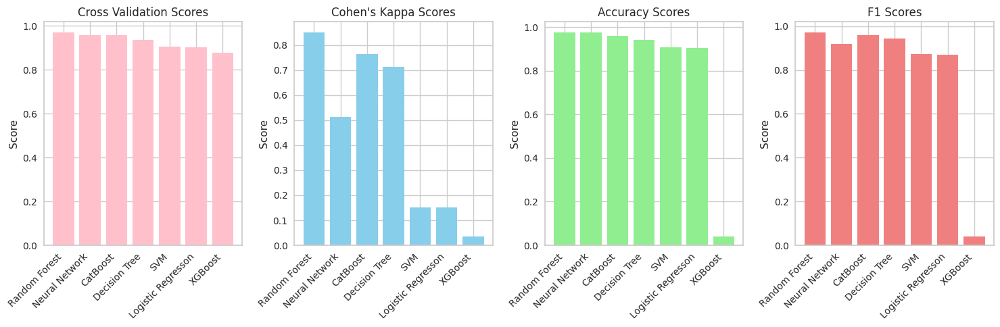

In [ ]:
fig, axs = plt.subplots(1, 4, figsize=(15, 5))

axs[0].bar(sorted_models, sorted_scores, color='pink')
axs[0].set_title("Cross Validation Scores")
axs[0].set_ylabel("Score")
axs[0].set_xticklabels(sorted_models, rotation=45, ha='right')

axs[1].bar(sorted_models, sorted_kappas, color='skyblue')
axs[1].set_title("Cohen's Kappa Scores")
axs[1].set_ylabel("Score")
axs[1].set_xticklabels(sorted_models, rotation=45, ha='right')

axs[2].bar(sorted_models, sorted_accuracies, color='lightgreen')
axs[2].set_title("Accuracy Scores")
axs[2].set_ylabel("Score")
axs[2].set_xticklabels(sorted_models, rotation=45, ha='right')

axs[3].bar(sorted_models, sorted_f1s, color='lightcoral')
axs[3].set_title("F1 Scores")
axs[3].set_ylabel("Score")
axs[3].set_xticklabels(sorted_models, rotation=45, ha='right')

plt.tight_layout()
plt.show()

This figure consists of **four bar plots** comparing different classification models across various evaluation metrics. Each subplot represents a different metric: **Cross Validation Scores**, **Cohen’s Kappa Scores**, **Accuracy Scores**, and **F1 Scores**. Let’s break down each plot:

1. **Cross Validation Scores (First Plot)**
- **What it Represents:** This plot shows the **average cross-validation score** for each model. Cross-validation involves splitting the data into multiple folds and training the model on these folds to get an average performance measure.
- **Insights:**
  - All models, including **Random Forest, CatBoost, Neural Network, Decision Tree, SVM, Logistic Regression, and XGBoost**, show **high cross-validation scores** (all close to or above 0.8).
  - This suggests that all models performed well when evaluated using cross-validation.

2. **Cohen's Kappa Scores (Second Plot)**
- **What it Represents:** **Cohen's Kappa** measures the agreement between the predicted and actual labels, adjusted for the agreement expected by chance. It’s particularly useful in classification tasks, especially when there is class imbalance.
- **Insights:**
  - **Random Forest, CatBoost, and Decision Tree** have the highest Kappa scores, indicating **strong agreement** between predicted and actual labels.
  - **Decision Tree** and **SVM** have moderate Kappa scores.
  - **Logistic Regression and XGBoost** show **low Kappa scores**, with XGBoost performing particularly poorly.
  - This suggests that although models like XGBoost might have good cross-validation scores, they struggle with label agreement after adjusting for chance, likely due to class imbalance or prediction bias.

3. **Accuracy Scores (Third Plot)**
- **What it Represents:** This plot shows the **accuracy** of each model, which is the percentage of correct predictions out of the total predictions.
- **Insights:**
  - **Random Forest, CatBoost, Neural Network, Decision Tree, SVM, and Logistic Regression** all show **high accuracy scores** (close to or above 0.8).
  - **XGBoost** shows a **very low accuracy score**, indicating that it is making incorrect predictions the majority of the time. This aligns with its poor Kappa score.

4. **F1 Scores (Fourth Plot)**
- **What it Represents:** The **F1 score** is the harmonic mean of precision and recall and is a good measure of a model’s ability to make correct predictions in imbalanced datasets.
- **Insights:**
  - **Random Forest, CatBoost, Neural Network, Decision Tree, SVM, and Logistic Regression** all have **high F1 scores** (close to or above 0.8), indicating that these models balance precision and recall well.
  - **XGBoost** again shows a **very low F1 score**, indicating poor precision and recall, which likely reflects a failure to classify correctly.

***General Observations***
- **Strong Performers:** Models like **Random Forest, CatBoost, and Decision Tree** consistently perform well across all metrics (cross-validation, Kappa, accuracy, and F1 score), indicating that they are reliable for this classification task.
- **Poor Performer:** **XGBoost** performs well in cross-validation but **fails significantly** in terms of accuracy, Kappa, and F1 scores. This suggests that XGBoost may be overfitting during cross-validation or it may be suffering from issues related to class imbalance, where it struggles to generalize to the test set.

***Conclusion***
- **Cross-Validation vs Test Performance:** Although all models have good cross-validation scores, **XGBoost** fails to generalize, as reflected in its very low test accuracy, F1 score, and Kappa score. This highlights the importance of not relying solely on cross-validation scores but evaluating models on real unseen data and metrics that account for chance, like Cohen’s Kappa.
- **Best Models:** Based on the metrics, **Random Forest, CatBoost, and Decision Tree** appear to be the most consistent and reliable models for this task.

# Hyperparameter Tuning

## Installing Optuna

In [ ]:
! pip -q install optuna

In [ ]:
! pip install --upgrade optuna optuna-integration

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.4/93.4 kB 897.4 kB/s eta 0:00:000:00:01


In [ ]:
import optuna

## Defining the Objective Function

In [ ]:
def objective(trial):
    classifier_name = trial.suggest_categorical("classifier", ["Random Forest", "Cat Boost", "Decision Tree"])

    if classifier_name == "Random Forest":
          model = RandomForestClassifier(
              n_estimators = trial.suggest_int("n_estimators", 50, 300, 20),
              max_depth = trial.suggest_int("max_depth", 2, 20),
              min_samples_split = trial.suggest_int("min_samples_split", 2, 10),
              min_samples_leaf = trial.suggest_int("min_samples_leaf", 1, 10),
              random_state = 0
          )

    elif classifier_name == "Cat Boost":
        model = CatBoostClassifier(
            iterations = trial.suggest_int("iterations", 100, 500),
            depth = trial.suggest_int("depth", 2, 10),
            learning_rate = trial.suggest_loguniform("learning_rate", 1e-4, 1e-1),
            verbose = 0,
            random_state = 0
        )

    else:
        model = DecisionTreeClassifier(
            max_depth = trial.suggest_int("max_depth", 2, 20),
            min_samples_split = trial.suggest_int("min_samples_split", 2, 10),
            min_samples_leaf = trial.suggest_int("min_samples_leaf", 1, 10),
            random_state = 0
        )

    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('classifier', model)
    ])

    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)

    f1 = f1_score(y_test, y_pred, average='weighted')

    return f1

## Hyperparameters Optimization

In [ ]:
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=15)

[I 2024-08-24 09:19:31,202] A new study created in memory with name: no-name-b4fa663f-cd39-4b2b-ae71-49eea1c88ec0
[I 2024-08-24 09:20:21,631] Trial 0 finished with value: 0.8606986288035445 and parameters: {'classifier': 'Cat Boost', 'iterations': 175, 'depth': 3, 'learning_rate': 0.026012267437096413}. Best is trial 0 with value: 0.8606986288035445.
[I 2024-08-24 09:33:00,670] Trial 1 finished with value: 0.8725386274350608 and parameters: {'classifier': 'Cat Boost', 'iterations': 431, 'depth': 8, 'learning_rate': 0.013177146917403878}. Best is trial 1 with value: 0.8725386274350608.
[I 2024-08-24 09:36:35,120] Trial 2 finished with value: 0.8521995446609982 and parameters: {'classifier': 'Cat Boost', 'iterations': 228, 'depth': 6, 'learning_rate': 0.0003524384763595125}. Best is trial 1 with value: 0.8725386274350608.
[I 2024-08-24 09:43:05,074] Trial 3 finished with value: 0.8521995446609982 and parameters: {'classifier': 'Cat Boost', 'iterations': 414, 'depth': 6, 'learning_rate': 

## Best Model & Hyperparameters

In [ ]:
best_trials = study.best_trials

In [ ]:
print("Details about Best Model")
print("-"*60)

for trial in best_trials:
    f1 = trial.values
    print("-"*60)
    print(f'Best trial number: {trial.number+1}')
    print(f'Best F1 Score: {f1}')
    print('Best hyperparameters:')

    for key, value in trial.params.items():
        print(f'  {key}: {value}')

Details about Best Model
------------------------------------------------------------
------------------------------------------------------------
Best trial number: 13
Best F1 Score: [0.9630957104570879]
Best hyperparameters:
  classifier: Cat Boost
  iterations: 310
  depth: 10
  learning_rate: 0.0972819884561472


## Fitting the Best Model

In [ ]:
best_params = study.best_params
best_model_name = best_params.pop('classifier')

In [ ]:
if best_model_name == 'Random Forest':
  best_model = RandomForestClassifier(**best_params, random_state=0)
elif best_model_name == 'Cat Boost':
  best_model = CatBoostClassifier(**best_params, random_state=0, verbose=0)
else:
  best_model = DecisionTreeClassifier(**best_params, random_state=0)

In [ ]:
best_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', best_model)
])

In [ ]:
best_pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  Index(['duration_ms', 'danceability', 'loudness', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo'],
      dtype='object')),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  Index(['explicit...e', 'The_track',
       'You_track', 'Me_track', 'I_track', 'Vivo_track', 'Others_track',
       'The_album', 'Vol_album', 'Christmas_album', 'Others_album',
       'artist_The Beatles', 'artist_George Jones', 'artist_Stevie Wonder',
       'artist_Ella Fitzgerald', 'artist_Linkin Park', 'artist_Others'],
      dtype='object'))])),
                ('classifier',
                 <catboost.core.CatBoostClassifier object at 0x7dbdac30b760>)])

## Predictions of the Best Model

In [ ]:
y_pred_best = best_pipeline.predict(X_test)

## Evaluation of the Best Model

In [ ]:
best_accuracy = accuracy_score(y_test, y_pred_best)
best_f1 = f1_score(y_test, y_pred_best, average='weighted')
best_kappa = cohen_kappa_score(y_test, y_pred_best)
best_report = classification_report(y_test, y_pred_best)

In [ ]:
print("Metrics of the Best Model:")
print("-" * 60)
print("Accuracy:", best_accuracy)
print("F1 Score:", best_f1)
print("Cohen's Kappa Score:", best_kappa)

Metrics of the Best Model:
------------------------------------------------------------
Accuracy: 0.9658832448824868
F1 Score: 0.9630957104570879
Cohen's Kappa Score: 0.7914379905848942


In [ ]:
print("Classification Report:\n", best_report)

Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.67      0.79      1664
           1       0.92      0.78      0.85       218
           2       0.95      0.96      0.95        55
           3       1.00      0.88      0.94        26
           4       1.00      0.50      0.67        14
           5       0.00      0.00      0.00         2
           6       1.00      1.00      1.00         1
           7       1.00      1.00      1.00         3
          22       1.00      1.00      1.00         1
          32       1.00      1.00      1.00         1
          33       0.00      0.00      0.00         1
          36       0.97      1.00      0.98     20174
          38       1.00      1.00      1.00         2
          41       1.00      0.75      0.86         4
          42       1.00      1.00      1.00         1
          43       1.00      0.80      0.89         5
          44       1.00      0.60      0.75         5
   

## Obsevations



*   Therefore the best model turns out to be as the ***Cat Boost***.
*   It is providing **`accuracy = 0.97`** and **`F1 Score (weighted) = 0.96`**.



## Visualizing the Tree

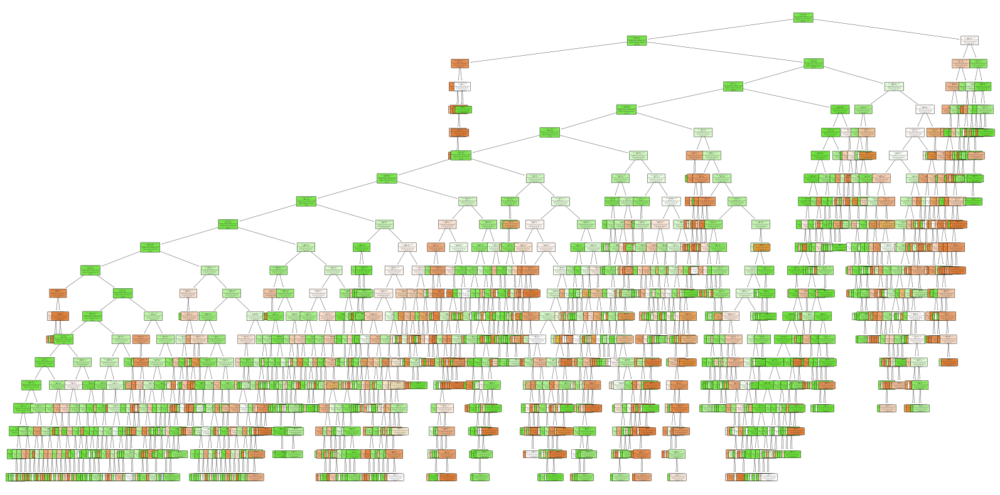

In [ ]:
from sklearn.tree import plot_tree

if isinstance(preprocessor, ColumnTransformer):
    feature_names = preprocessor.get_feature_names_out()
else:
    feature_names = X.columns

plt.figure(figsize=(20,10))
class_names_str = [str(c) for c in best_model.classes_]
plot_tree(best_model,
          filled=True,
          rounded=True,
          feature_names=feature_names,
          class_names=class_names_str)
plt.show()

# Feature Importance

## Get the Most Important Features

In [ ]:
if hasattr(best_model, 'feature_importances_'):
  importances = best_model.feature_importances_
else:
  importances = None

## Visualizing the  Predictors

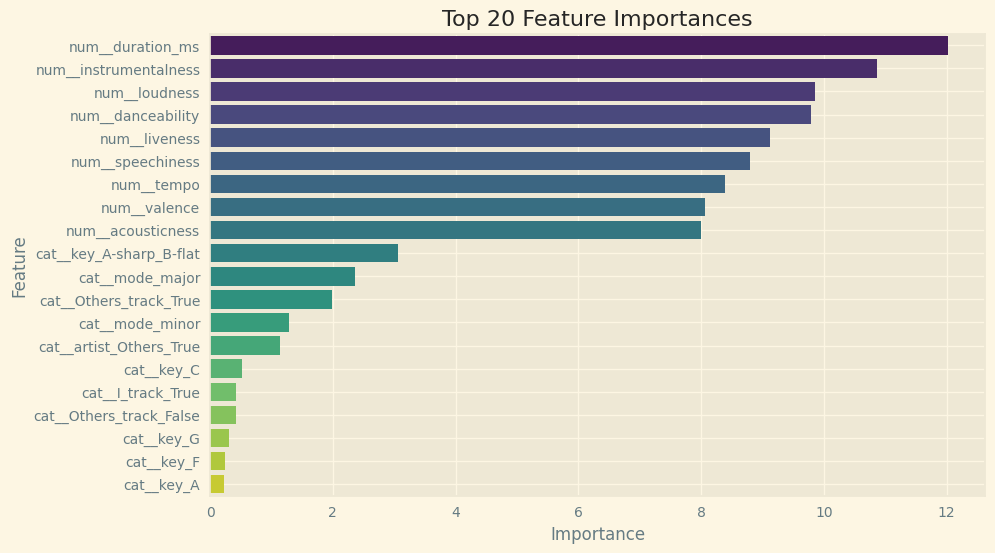

In [ ]:
if importances is not None:
    feature_names = preprocessor.get_feature_names_out()

    feature_importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': importances
    })

    top_20_features = feature_importance_df.sort_values(by='Importance', ascending=False).head(20)

    plt.style.use('Solarize_Light2')
    plt.figure(figsize=(10, 6))
    sns.barplot(x='Importance', y='Feature', data=top_20_features, palette='viridis')
    plt.title('Top 20 Feature Importances')
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.savefig('top_20_features.png')
    plt.grid(True)
    plt.show()

else:
    print("The best model does not have a feature_importances_ attribute.")

This plot represents the top 20 feature importances from the decision tree classification model. It shows the relative importance of each feature in terms of their contribution to the model's predictive power. Here's a detailed breakdown:

***Plot Breakdown***

1. **Title:**
   - The title "Top 20 Feature Importances" indicates that the plot is displaying the 20 most important features for the model's performance.

2. **X-Axis (Importance):**
   - The x-axis represents the importance score of each feature. These scores measure how much each feature contributes to the model's predictions.
   - Higher scores mean that the feature has a larger influence on the model’s decisions.

3. **Y-Axis (Feature Names):**
   - The y-axis lists the top 20 features ranked by their importance.
   - The features are a mix of numerical features (prefixed with `num__`) and categorical features (likely encoded and prefixed with names like `track_genre`, `Stevie_Wonder_False`, etc.).
   - The features represent various characteristics of the data, such as the duration of a song (`num__duration_ms`), tempo (`num__tempo`), and specific genres or artists.

4. **Bars:**
   - Each horizontal bar represents the importance of a particular feature.
   - The length of the bar corresponds to the importance score of the feature. The bars are color-coded with a gradient, starting from deep purple for the most important features and transitioning to lighter colors for the less important ones.

***Key Features***
- **`num__duration_ms`** is the most important feature with the highest importance score, indicating that the duration of the track (in milliseconds) plays a significant role in the model’s decision-making process.
- **`num__tempo`**, **`num__speechiness`**, and **`instrumentalness`** follow closely in importance, suggesting that these features are also critical in determining the model's output.
- Other important numerical features include **`num__loudness`**, **`num__danceability`**, **`num__valence`**, and **`num__liveness`**, all of which are commonly used characteristics in music analysis.
- Categorical features such as **`track_genre_jazz`**, **`Stevie_Wonder_False`**, and various genres like **`latin`**, **`rock`**, and **`reggae`** are also identified as important, though they have a relatively lower importance score compared to the numerical features.

***Interpretation***
- **Numerical Features:** The top features in this list are primarily numerical, which suggests that the model places significant weight on the quantitative characteristics of the data, such as song duration, tempo, and speechiness.
- **Categorical Features:** Despite the dominance of numerical features, certain categorical features like track genres and artist presence (e.g., **`Stevie_Wonder_False`**) still play an important role in the model’s predictions, likely indicating that genre or artist-related information adds value to the model.
  
This kind of plot is essential for understanding how a model makes its predictions and identifying which features are most influential. In this case, it helps you see which song characteristics and categorical attributes are driving the model’s predictions and could help in further refining or interpreting the model.

### Business Implications

The **Top 20 Feature Importances** from a machine learning model has been used to predict Spotify track popularity. These feature importances highlight the audio and metadata characteristics that are most influential in determining a track's success. Here's how these insights can be applied to various business objectives:

1. **Optimizing Track Production and Development**:
   - **Insight**: Features such as `duration_ms`, `tempo`, and `speechiness` have the highest importance, meaning these are key factors that contribute to a track's popularity.
   - **Application**: **Artists and Producers** can focus on optimizing these attributes during the production process. For example:
     - **Track Duration**: Producers can experiment with track lengths that align with successful patterns (e.g., longer or shorter durations depending on genre preferences).
     - **Tempo**: By aligning the tempo with what listeners prefer, producers can create more engaging and potentially popular tracks, particularly for genres like EDM or pop that are more tempo-driven.
     - **Speechiness**: If speechiness (presence of spoken words) is a high-impact factor, artists may choose to emphasize or reduce spoken content depending on the target audience.

2. **Strategic Marketing and Promotion**:
   - **Insight**: Features like `instrumentalness`, `danceability`, and `loudness` are also significant contributors to popularity.
   - **Application**: **Marketing Teams** can tailor their promotional strategies based on the strengths of these features:
     - **Danceability and Loudness**: If a track scores high on danceability and loudness, it can be promoted in social and high-energy environments, such as clubs, festivals, or workout playlists.
     - **Instrumentalness**: Tracks with higher instrumentalness may be marketed towards specific niche audiences, such as classical music lovers or ambient music listeners, thereby improving the effectiveness of campaigns.
   - **Genre-Specific Promotion**: Features like `track_genre_jazz`, `track_genre_latin`, and `track_genre_reggaeton` suggest that genre plays an important role in popularity. Marketing strategies can be tailored to these genres to target relevant audiences on platforms like Spotify and social media.

3. **Enhanced Playlist Curation**:
   - **Insight**: With features like `liveness` and `valence` contributing to popularity, streaming platforms can enhance their recommendation and playlist curation algorithms.
   - **Application**: **Streaming Platforms** can leverage these insights to create playlists that resonate more with users:
     - **Happy/Upbeat Playlists**: Tracks with high valence (positiveness) can be included in playlists aimed at boosting mood or energy, such as "Feel-Good" or "Happy Hits" playlists.
     - **Live Performances**: Tracks with higher liveness scores can be featured in live music or concert-based playlists, catering to users who enjoy the ambiance of live performances.
   - **Targeted Recommendations**: Platforms can use these feature importance rankings to improve recommendation systems, providing users with tracks that match their listening preferences based on characteristics like tempo, danceability, and speechiness.

4. **Data-Driven Artist Development**:
   - **Insight**: Genre-related features (`track_genre_jazz`, `track_genre_rock`, `track_genre_dance`) indicate that genre significantly impacts popularity.
   - **Application**: **Record Labels and A&R Teams** can use this data to inform artist development and genre-specific investments:
     - **Genre Expansion**: Labels may encourage artists to explore popular genres like Latin, Reggaeton, or Jazz based on the data trends, potentially leading to new successful tracks.
     - **Track Characteristics**: A&R teams can use feature importance rankings to guide artists in developing songs that align with the characteristics driving popularity within their target genres, increasing the likelihood of success.

5. **Optimizing Advertising Revenue and User Engagement**:
   - **Insight**: Popularity-driving features help platforms understand which types of tracks keep users engaged.
   - **Application**: **Streaming Services** can use feature importance data to increase engagement and ad revenue:
     - **Engagement Maximization**: By prioritizing tracks with high scores in features like tempo, valence, and danceability, platforms can improve user engagement metrics, leading to longer listening sessions and increased ad impressions.
     - **Premium Subscription Push**: Platforms can highlight tracks that fit user preferences, encouraging them to subscribe to premium services for an ad-free experience.

6. **Customized Event Promotion**:
   - **Insight**: Features like `track_genre_latin` and `track_genre_reggaeton` point to popularity in specific cultural or social contexts.
   - **Application**: **Event Organizers and Sponsors** can align their music choices with the top-ranked features to create more engaging live events:
     - **Cultural Festivals**: Events targeting Latin, Jazz, or Reggaeton music fans can be curated based on feature importance, ensuring the right music mix for the audience, thereby increasing attendance and sponsorship opportunities.
     - **Partnerships**: Brands can partner with specific genres based on popularity trends, helping them reach target demographics more effectively through events and promotional collaborations.

7. **For the Whole Music Industry: Future-Proofing Trends and Investment Decisions**:
   - **Insight**: The analysis of feature importance can help the music industry stay ahead of emerging trends and ensure that investments are strategically aligned with the future of music.
   - **Application**:
     - **Future-Proofing Trends**: By monitoring the features that drive track popularity, industry stakeholders can detect emerging trends early. For example, a sudden increase in the importance of certain genres (like Latin or Jazz) or characteristics (like acousticness or liveness) can signal a shift in listener preferences. The music industry can leverage this information to invest in developing talent or producing music that aligns with these future trends.
     - **Investment Decisions**: Record labels, streaming platforms, and investors can use these insights to allocate resources more efficiently. By investing in artists, tracks, or genres that align with high-importance features, stakeholders can maximize their returns. For instance, if `track_genre_reggaeton` or `track_genre_dance` shows increasing importance, record labels can sign more artists in these genres, while streaming platforms can allocate more promotional resources to these tracks. This helps ensure that investments are data-driven and focused on music with the highest potential for commercial success.


By understanding the relative importance of various features, businesses in the music industry can make more informed, data-driven decisions that maximize the commercial success of tracks. Whether it's optimizing track production, enhancing marketing campaigns, curating playlists, or improving user engagement, these insights enable stakeholders to refine their strategies based on the characteristics that matter most to listeners.

On a broader scale, the entire music industry can benefit from these insights by staying ahead of emerging trends and making smarter investment decisions. By continuously analyzing feature importance, the industry can future-proof its strategies, ensuring that resources are directed toward the most promising genres, artists, and musical trends. This proactive approach allows the industry to stay competitive, innovative, and aligned with evolving consumer preferences.

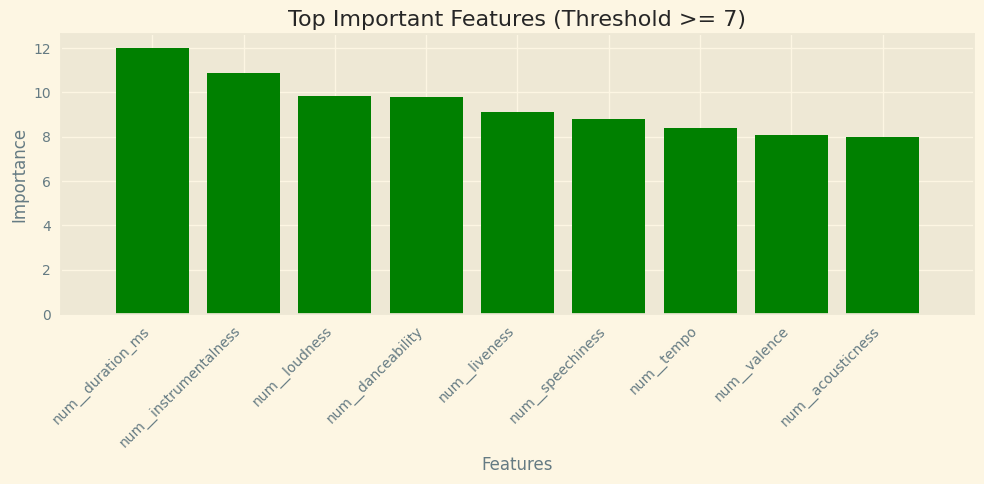

In [ ]:
if importances is not None:
    indices = np.argsort(importances)[::-1]

    selected_indices = indices[importances[indices] >= 7]

    plt.style.use('Solarize_Light2')
    plt.figure(figsize=(10, 5))
    plt.title("Top Important Features (Threshold >= 7)")
    plt.bar(range(len(selected_indices)), importances[selected_indices], color="Green", align="center")
    plt.xticks(range(len(selected_indices)), [feature_names[i] for i in selected_indices], rotation=45, ha='right')
    plt.xlabel("Features")
    plt.ylabel("Importance")
    plt.xlim([-1, len(selected_indices)])
    plt.tight_layout()
    plt.show()

else:
    print("Feature importances are not available for this model.")

The plot titled **"Top Important Features (Threshold >= 7)"** displays the most important features for predicting Spotify track popularity, where each feature has a significance score greater than or equal to 7. The y-axis represents the "Importance" score, while the x-axis shows the corresponding features. Here's an explanation of the key elements:

***Plot Breakdown***

1. **Title:**
   - The title "Top Important Features (Threshold > 0.03)" indicates that this bar chart is showing the features with an importance score above 0.03. These are considered the most important features in the model.

2. **X-Axis (Features):**
   - The x-axis lists the feature names. These features are a mix of numerical features (indicated by "num__") and categorical features (indicated by "cat__").
   - The numerical features are likely continuous variables, such as `num__duration_ms`, `num__tempo`, `num__speechiness`, etc.
   - The categorical features have been encoded as part of the preprocessing pipeline, for example, `cat__track_genre_jazz`, `cat__artist_Stevie_Wonder_False`, etc.

3. **Y-Axis (Importance):**
   - The y-axis shows the importance score for each feature. This score represents how much each feature contributes to the model's predictive power.
   - The higher the bar, the more important the feature is to the model.

4. **Bars:**
   - Each bar represents the importance of a specific feature in the model. The heights of the bars correspond to the importance values.
   - The bars are colored green and are sorted from highest to lowest importance.


***Key Observations***

1. **Top Features**:
   - **num__duration_ms**: The duration of the track in milliseconds is the most important feature, with an importance score slightly above 12. This suggests that track length plays a critical role in determining its popularity.
   - **num__instrumentalness**: Instrumentalness, which measures the likelihood of a track being instrumental (having no vocals), has a high importance score, indicating it significantly influences track popularity.
   - **num__loudness**: Loudness, which reflects the average volume level of a track, is also crucial for predicting popularity. This implies that louder tracks may correlate with higher listener engagement.
   
2. **Other Significant Features**:
   - **num__danceability**: Danceability, a metric that quantifies how suitable a track is for dancing, is important, indicating its relevance in popular tracks.
   - **num__liveness**: Tracks with higher liveness, which measures the presence of a live audience, tend to be more popular, possibly because of their energetic and spontaneous feel.
   - **num__speechiness**: This measures the presence of spoken words in a track. A higher speechiness score suggests that the presence of lyrics or spoken word content influences popularity.
   - **num__tempo**, **num__valence**, and **num__acousticness**: These features, including tempo (speed), valence (positiveness of the music), and acousticness (whether the track is acoustic or not), also play a role in driving popularity.

***Interpretation***

The plot highlights the relative importance of different features in the machine learning model. These features are critical in predicting the success of Spotify tracks. For instance:
- **Track Duration (num__duration_ms)** being the most significant feature suggests that there's an optimal track length that resonates with listeners.
- **Instrumentalness and Loudness** indicate that the composition and auditory dynamics of a track play a significant role in attracting listeners.

This information can guide **artists, record labels, and streaming platforms** in optimizing their content production, curation, and marketing strategies by focusing on these key aspects to maximize a track's potential for popularity.

# Model Interpretation through Shapley Values

## Installing `shap` Module

In [ ]:
! pip install shap

In [ ]:
import shap

## Create a TreeExplainer object

In [ ]:
X = spotify[['duration_ms', 'instrumentalness', 'loudness', 'danceability', 'liveness', 'speechiness', 'tempo', 'valence', 'acousticness']]
Y = spotify['average_popularity']

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state = 0)

In [ ]:
explainer = shap.TreeExplainer(best_model)

## Calculate Shap values for the test set

In [ ]:
ohc = OneHotEncoder(sparse_output=False)
X_test_encoded = ohc.fit_transform(X_test)

In [ ]:
shap_values = explainer.shap_values(X_test_encoded)

## Visualize Shap values for a single instance

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0][0], feature_names=feature_names)

## Visualize Shap values for the entire test set

In [ ]:
shap.summary_plot(shap_values, X_test_encoded, feature_names=feature_names)

# Conclusion

This project demonstrates the viability of predicting track popularity using machine learning techniques. By leveraging Spotify's rich audio feature data, we can build predictive models that help stakeholders in the music industry make data-driven decisions. The models developed can provide insights into what makes a track popular and offer valuable recommendations to record labels, artists, and streaming platforms.

While the models may not perfectly predict every track's popularity due to the subjective nature of music and external factors like social media influence, they offer a solid foundation for optimizing various processes in the music industry. With further fine-tuning and continuous learning from new data, these models can become integral tools for artists, labels, and platforms looking to maximize their success.